In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import math
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
contractions = { 
"ain't": "am not / are not / is not / has not / have not",
"aren't": "are not / am not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he had / he would",
"he'd've": "he would have",
"he'll": "he shall / he will",
"he'll've": "he shall have / he will have",
"he's": "he has / he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how has / how is / how does",
"i'd": "i had / i would",
"i'd've": "i would have",
"i'll": "i shall / i will",
"i'll've": "i shall have / i will have",
"i'm": "i am",
"im": "i am",
"i've": "I have",
"isn't": "is not",
"it'd": "it had / it would",
"it'd've": "it would have",
"it'll": "it shall / it will",
"it'll've": "it shall have / it will have",
"it's": "it has / it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she had / she would",
"she'd've": "she would have",
"she'll": "she shall / she will",
"she'll've": "she shall have / she will have",
"she's": "she has / she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as / so is",
"that'd": "that would / that had",
"that'd've": "that would have",
"that's": "that has / that is",
"there'd": "there had / there would",
"there'd've": "there would have",
"there's": "there has / there is",
"they'd": "they had / they would",
"they'd've": "they would have",
"they'll": "they shall / they will",
"they'll've": "they shall have / they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we had / we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what shall / what will",
"what'll've": "what shall have / what will have",
"what're": "what are",
"what's": "what has / what is",
"what've": "what have",
"when's": "when has / when is",
"when've": "when have",
"where'd": "where did",
"where's": "where has / where is",
"where've": "where have",
"who'll": "who shall / who will",
"who'll've": "who shall have / who will have",
"who's": "who has / who is",
"who've": "who have",
"why's": "why has / why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you had / you would",
"you'd've": "you would have",
"you'll": "you shall / you will",
"you'll've": "you shall have / you will have",
"you're": "you are",
"you've": "you have"
}

In [2]:
df_train= pd.read_csv('multimodal_train.tsv', delimiter='\t')
df_validate= pd.read_csv('multimodal_validate.tsv', delimiter='\t')
df_test= pd.read_csv('multimodal_test_public.tsv', delimiter='\t')
df_train.shape

(564000, 16)

In [3]:
df_train = df_train[df_train['clean_title'].notna()]
df_validate = df_validate[df_validate['clean_title'].notna()]
df_test = df_test[df_test['clean_title'].notna()]
df_train.head()

,author,clean_title,created_utc,domain,hasImage,id,image_url,linked_submission_id,num_comments,score,subreddit,title,upvote_ratio,2_way_label,3_way_label,6_way_label
0,Alexithymia,my walgreens offbrand mucinex was engraved wit...,1.551641e+09,i.imgur.com,True,awxhir,https://external-preview.redd.it/WylDbZrnbvZdB...,NaN,2.0,12,mildlyinteresting,My Walgreens offbrand Mucinex was engraved wit...,0.84,1,0,0
1,VIDCAs17,this concerned sink with a tiny hat,1.534727e+09,i.redd.it,True,98pbid,https://preview.redd.it/wsfx0gp0f5h11.jpg?widt...,NaN,2.0,119,pareidolia,This concerned sink with a tiny hat,0.99,0,2,2
2,prometheus1123,hackers leak emails from uae ambassador to us,1.496511e+09,aljazeera.com,True,6f2cy5,https://external-preview.redd.it/6fNhdbc6K1vFA...,NaN,1.0,44,neutralnews,Hackers leak emails from UAE ambassador to US,0.92,1,0,0
3,NaN,puppy taking in the view,1.471341e+09,i.imgur.com,True,4xypkv,https://external-preview.redd.it/HLtVNhTR6wtYt...,NaN,26.0,250,photoshopbattles,PsBattle: Puppy taking in the view,0.95,1,0,0
4,3rikR3ith,i found a face in my sheet music too,1.525318e+09,i.redd.it,True,8gnet9,https://preview.redd.it/ri7ut2wn8kv01.jpg?widt...,NaN,2.0,13,pareidolia,I found a face in my sheet music too!,0.84,0,2,2


In [4]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 564000 entries, 0 to 563999
Data columns (total 16 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   author                535290 non-null  object 
 1   clean_title           564000 non-null  object 
 2   created_utc           564000 non-null  float64
 3   domain                396143 non-null  object 
 4   hasImage              564000 non-null  bool   
 5   id                    564000 non-null  object 
 6   image_url             562466 non-null  object 
 7   linked_submission_id  167857 non-null  object 
 8   num_comments          396143 non-null  float64
 9   score                 564000 non-null  int64  
 10  subreddit             564000 non-null  object 
 11  title                 564000 non-null  object 
 12  upvote_ratio          396143 non-null  float64
 13  2_way_label           564000 non-null  int64  
 14  3_way_label           564000 non-null  int64  
 15  

In [5]:
df_train=df_train[['clean_title','2_way_label']]
print(df_train['2_way_label'].value_counts())
df_train.head()

0    341919
1    222081
Name: 2_way_label, dtype: int64


,clean_title,2_way_label
0,my walgreens offbrand mucinex was engraved wit...,1
1,this concerned sink with a tiny hat,0
2,hackers leak emails from uae ambassador to us,1
3,puppy taking in the view,1
4,i found a face in my sheet music too,0


In [6]:
Truth_map={0 :'False', 1: 'True'}
df_train['word_count']= df_train['clean_title'].apply(lambda x: len (str(x).split()))
df_train['stop_words_count']= df_train['clean_title'].apply(lambda x: len([sw for sw in x.split() if sw in STOP_WORDS]))
df_train= df_train[df_train.word_count> 2]
df_train.head()

,clean_title,2_way_label,word_count,stop_words_count
0,my walgreens offbrand mucinex was engraved wit...,1,15,7
1,this concerned sink with a tiny hat,0,7,3
2,hackers leak emails from uae ambassador to us,1,8,3
3,puppy taking in the view,1,5,2
4,i found a face in my sheet music too,0,9,5


In [7]:
print(df_train['word_count'].value_counts())
print('Updated Shape:', df_train['2_way_label'].value_counts())

3      51180
4      50791
5      49020
6      45813
7      41721
       ...  
127        1
93         1
553        1
101        1
89         1
Name: word_count, Length: 74, dtype: int64
Updated Shape: 0    255038
1    215716
Name: 2_way_label, dtype: int64


# PREPROCESSING

In [8]:
all_text= ' '.join(df_train['clean_title'])
def cont_to_exp(x):
    if type(x) is str:
        for key in contractions:
            value = contractions[key]
            x=x.replace(key, value)
        return x
    else:
        return x
df_train['clean_title']= df_train['clean_title'].apply(lambda x: cont_to_exp(x))
df_train['clean_title']= df_train['clean_title'].apply(lambda x: x.lower())
df_train['clean_title']= df_train['clean_title'].apply(lambda x: " ".join([t for t in x.split() if t not in STOP_WORDS]))

df_train.drop('stop_words_count', axis='columns', inplace=True)
df_train.head()

,clean_title,2_way_label,word_count
0,walgreens offbrand mucinex engraved letters mu...,1,15
1,concerned sink tiny hat,0,7
2,hackers leak emails uae ambassador,1,8
3,puppy taking view,1,5
4,found face sheet music,0,9


In [9]:
import nltk
nltk.download('words')
words = set(nltk.corpus.words.words())
def clean_sent(sent):
    return " ".join(w for w in nltk.wordpunct_tokenize(sent) \
     if w.lower() in words or not w.isalpha())

df_train['clean_title']= df_train['clean_title'].apply(lambda x: clean_sent(x))
df_train.head()

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\Abdelrahman\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


,clean_title,2_way_label,word_count
0,engraved different order,1,15
1,concerned sink tiny hat,0,7
2,leak ambassador,1,8
3,puppy taking view,1,5
4,found face sheet music,0,9


In [10]:
def tokenization(x):
    return x.split()

df_train['clean_title']= df_train['clean_title'].apply(lambda x: tokenization(x))

df_train.head()

,clean_title,2_way_label,word_count
0,"[engraved, different, order]",1,15
1,"[concerned, sink, tiny, hat]",0,7
2,"[leak, ambassador]",1,8
3,"[puppy, taking, view]",1,5
4,"[found, face, sheet, music]",0,9


In [11]:
from nltk.stem.porter import PorterStemmer
porter = PorterStemmer()
def stemming(x):
    stems = []
    for t in x:
        lemma=str(porter.stem(t))
        if lemma == '-PRON-' or lemma == 'be':
            lemma=t
        stems.append(lemma)
    return stems
df_train['clean_title']= df_train['clean_title'].apply(lambda x: stemming(x))
df_train.head()

,clean_title,2_way_label,word_count
0,"[engrav, differ, order]",1,15
1,"[concern, sink, tini, hat]",0,7
2,"[leak, ambassador]",1,8
3,"[puppi, take, view]",1,5
4,"[found, face, sheet, music]",0,9


In [12]:
import spacy
nlp= spacy.load('en_core_web_sm')
def make_to_base(x):
    x_list=[]
    doc=nlp(" ".join(x))
    for token in doc:
        lemma= str(token.lemma_)
        if lemma == '-PRON-' or lemma == 'be':
            lemma=token.text
        x_list.append(lemma)
    return x_list

df_train['clean_title']= df_train['clean_title'].apply(lambda x:  make_to_base(x))

df_train.head()

,clean_title,2_way_label,word_count
0,"[engrav, differ, order]",1,15
1,"[concern, sink, tini, hat]",0,7
2,"[leak, ambassador]",1,8
3,"[puppi, take, view]",1,5
4,"[find, face, sheet, music]",0,9


In [13]:
temp_df=pd.DataFrame()
temp_df=df_train
temp_df.head()

,clean_title,2_way_label,word_count
0,"[engrav, differ, order]",1,15
1,"[concern, sink, tini, hat]",0,7
2,"[leak, ambassador]",1,8
3,"[puppi, take, view]",1,5
4,"[find, face, sheet, music]",0,9


In [14]:
corpus= temp_df['clean_title'].apply(lambda x: ' '.join(x))
all_text= ' '.join(corpus)
words= all_text.split()
freq_com=pd.Series(words).value_counts()
freq_com
Most_common=freq_com[:10]
rare= freq_com[freq_com<100]
freq_com

like          16718
man           14145
nt            13563
find          12453
new           11055
              ...  
teratoma          1
unshak            1
needlework        1
ocular            1
mot               1
Length: 20231, dtype: int64

In [15]:
temp_df['clean_title']= temp_df['clean_title'].apply(lambda x: ([t for t in x if t not in Most_common]))
temp_df['clean_title']= temp_df['clean_title'].apply(lambda x: ([t for t in x if t not in rare]))

In [30]:
freq_dict={}
freq_dict_true = {}
freq_dict_false = {}
def count_freq(x,y):
    list_set = set(x)
    x = (list(list_set))
    for t in x:
        if(y == 1):
            if(t in freq_dict_true):
                freq_dict_true[t]+=1
            else: 
                freq_dict_true[t] = 1
        else: 
            if(t in freq_dict_false):
                freq_dict_false[t]+=1
            else: 
                freq_dict_false[t] = 1      
        if(t in freq_dict):
            freq_dict[t]+=1
        else:
            freq_dict[t] = 1
temp_df.apply(lambda x: count_freq (x['clean_title'],x['2_way_label']), axis = 1)
len(freq_dict)

2781

In [17]:
temp_df['word_count']= temp_df['clean_title'].apply(lambda x: len (x))
temp_df= temp_df[temp_df.word_count> 0]
temp_df.shape

(439402, 3)

In [29]:
temp_df['2_way_label'].value_counts()

0    231723
1    207679
Name: 2_way_label, dtype: int64

In [19]:
temp_df['clean_title'].apply(lambda x: print(x))

['differ', 'order']
['concern', 'sink', 'tini', 'hat']
['leak', 'ambassador']
['puppi', 'take', 'view']
['face', 'sheet', 'music']
['bride', 'exchang', 'fatal', 'shoot', 'we', 'd']
['meat', 'pig', 'eat', 'milk']
['convert', 'local', 'teen', 'circa', 'ad']
['victori', 'great', 'crusad']
['villag', 'leader', 'clean', 'patch']
['ai', 'fli', 'moon']
['seven', 'sloth']
['babi', 'cow', 'see', 'head', 'day', 'enjoy']
['girl', 'wear', 'virtual', 'realiti', 'hold']
['way', 'rain', 'bike']
['mental', 'ill', 'easi']
['love', 'peac', 'way', 'soviet', 'union']
['view', 'bar', 'palac']
['goe', 'well', 'red', 'white', 'rememb']
['happi', 'boat']
['tree', 'angri', 'fall']
['governor', 'statement', 'interview']
['join', 'communist', 'parti', 'music', 'video', 'w']
['neighbor', 'ambul', 'compani', 'move', 'get']
['creepi', 'guy', 'creepi', 'hair', 'stare']
['rain', 'iron', 'wall', 'beauti', 'red']
['presid', 'make', 'point', 'parliament']
['final', 'come', 'steam', 'there', 'big', 'catch']
['loo', 'truc

['organ', 'respon']
['strang', 'phone', 'train', 'platform']
['photo', 'batman']
['student', 'stage', 'graduat']
['determin', 'that', 'suppos', 'mean']
['eat']
['red', 'tree']
['drag', 'age', 'care', 'villag']
['academi', 'fine']
['local', 'sign']
['articl', 'v', 'constitut', 'convent', 'state', 'today']
['school']
['life', 'learn', 'piano', 'way', 'tri']
['dad']
['shield', 'steven', 'univer', 'paint', 'paper']
['good', 'fight', 'background', 'nois']
['teen', 'math', 'error', 'museum', 'scienc']
['guy', 'stand', 'larg', 'pipe', 'mouth']
['yard']
['fork', 'small', 'rest']
['peopl', 'stay', 'prior']
['sell']
['strawberri', 'grow', 'strawberri']
['dawn', 'ad', 'nation', 'defen', 'fund', 'order', 'fund', 'liber', 'war']
['float', 'trophi']
['get', 'real', 'tire']
['launch', 'solar', 'plant']
['high', 'stamp']
['death', 'public', 'health']
['explain', 'state', 'econom']
['kitten', 'fall', 'asleep', 'arm', 'leave', 'paw']
['play']
['safeti']
['style', 'clearli', 'second']
['pen']
['colleg', 

['trump', 'yell']
['specif', 'cast']
['local']
['owl', 'suspici']
['white', 'hous', 'dinner']
['bread', 'work', 'brown', 'bear']
['neat', 'stori', 'band', 'draw', 'ago', 'take', 'cell', 'phone', 'pictur', 'cover', 'late', 'album', 'track', 'artist', 'thank', 'hi']
['templ', 'revolutionari']
['phone', 'thought']
['realiti', 'hit']
['healthi', 'option']
['relat']
['grand', 'festiv', 'poster']
['singl', 'tear']
['game', 'physic']
['hous']
['thank', 'whale', 'near', 'citi']
['canada', 'get', 'hotel', 'furri', 'convent']
['fight', 'golf', 'hospit']
['master', 'race', 'right', 'progress']
['flower']
['cap', 'come', 'friend']
['beauti', 'nativ', 'tradit']
['china', 'word']
['acid', 'wash', 'follow', 'leader']
['spin', 'turn']
['lid', 'spot', 'straw']
['hand', 'flame']
['rain']
['demand', 'mum', 'order', 'hi', 'pizza']
['day', 'summer', 'commun', 'pool', 'lose']
['stare', 'camera']
['wine', 'tast', 'face', 'war', 'face']
['north', 'law', 'sex']
['big']
['million', 'feel']
['news', 'faith', 'hu

['mike', 'penc', 'religi', 'freedom', 'bill', 'privat', 'ceremoni']
['planet', 'earth', 'eagl', 'surfac', 'astronaut', 'snap', 'shoot', 'moon', 'command', 'servic']
['singl', 'jail', 'ti', 'food', 'group']
['giant']
['section']
['damn', 'emu']
['see', 'store']
['fli', 'jack']
['cup']
['black', 'panther', 'corgi']
['trump', 'launch', 'push']
['die']
['billion']
['fall', 'jump', 'rope']
['school', 'detect']
['rare', 'live', 'orang', 'instead', 'red', 'black']
['heart', 'shape', 'green', 'tomato']
['twin']
['toddler', 'day', 'job']
['woman', 'mirror']
['beach', 'walk']
['heart', 'radio', 'play', 'lead', 'femal', 'cup', 'leav']
['alli']
['seal', 'pride', 'rock']
['hous']
['pull', 'tab', 'coconut', 'buddi', 'store']
['happi', 'dude', 'class']
['polic', 'hedgehog', 'apart', 'raid', 'littl', 'floor', 'eat', 'polic', 'chief']
['coloni', 'shoe']
['get', 'leg', 'honor']
['half', 'backward']
['crab', 'speci']
['year', 'master']
['cover', 'math']
['whale', 'save', 'rope', 'remov', 'mouth']
['monit

['drunk', 'octopu', 'want', 'fight']
['light', 'match', 'snow']
['puppi']
['white', 'kitchen']
['beach', 'whale', 'right']
['want', 'play', 'game']
['bit', 'hurt']
['spoon', 'mac', 'n', 'chee', 'tip']
['beard', 'dress', 'princess']
['tri', 'chest', 'air']
['shave', 'circa']
['snow', 'slide', 'roof', 'form', 'wave']
['straight', 'northern', 'win', 'war', 'south']
['float', 'hood']
['hold', 'recoveri', 'steal', 'bad', 'art', 'histori', 'receiv', 'inform']
['heavi', 'metal', 'poster']
['bird', 'person']
['face']
['action']
['ass']
['let', 'sand', 'danc', 'floor']
['happi', 'lunch']
['wall']
['ice']
['frame', 'piec', 'old', 'bed', 'balanc', 'desk', 'fan', 'bed', 'frame']
['friend', 'come', 'post']
['day']
['life', 'unit', 'million']
['obe', 'dead', 'chang']
['fortun', 'fortun']
['sorri']
['refer']
['tough']
['turtl']
['futur', 'go', 'ami']
['japan', 'appl', 'coke', 'diet', 'crystal']
['red', 'appl', 'jack']
['pray', 'movi', 'socialist', 'govern', 's', 'chile']
['movi']
['coin', 'car', 'doo

['car', 'left', 'tank', 'zero']
['turn', 'heart', 'think']
['boy', 'band', 'releas', 'debut', 'album']
['east', 'red', 'opera', 'revolutionari', 'war']
['happi']
['bottl', 'attach']
['that']
['chicken', 'grill']
['sir', 'let', 'teach', 'use']
['fill', 'oil', 'shock']
['count']
['shooter', 'eric']
['san', 'vote', 'free', 'elect']
['falcon']
['stone', 'differ', 'rock']
['morn']
['west']
['total', 'keep', 'stop', 'concert', 'night', 'check', 'dress', 'room', 'catch', 'big']
['meet', 'mother', 'el', 'littl', 'child']
['kitten', 'sweater']
['watch', 'break', 'bad']
['photograph']
['doubl', 'size', 'navi', 'diet', 'disabl']
['see', 'way', 'work']
['sorri', 'resist']
['apart', 'build', 'separ', 'entranc', 'poor', 'peopl']
['throw']
['femal', 'warm', 'race']
['serv', 'tenni', 'ball']
['sock', 'warn']
['da', 'paint', 'florenc', 'circa']
['happi', 'fish']
['alcohol', 'kill']
['white', 'stop', 'write']
['slide']
['battl']
['frozen', 'cut', 'point']
['soviet', 'space']
['autist', 'teen', 'polic']


['win', 'sir']
['rest', 'easi', 'japan', 'sign', 'space']
['fire']
['outdoor', 'observ', 'th', 'floor', 'warn']
['make', 'face', 'toilet', 'roll', 'holder']
['pose']
['reaction', 'pay', 'hotel', 'bill']
['sad', 'potato', 'plate']
['shi']
['sign', 'soda', 'shop', 'near', 'suppos']
['llama']
['guy', 'hi', 'ad']
['candl']
['rain']
['hous', 'display', 'museum', 'garden', 'dare', 'enter']
['e', 'grade']
['hotel', 'bathroom', 'mirror', 'speaker']
['sneak', 'celebr']
['quiz', 'share']
['sun', 'half', 'old', 'news', 'print', 'pad', 'life', 'draw']
['happi', 'stove']
['tank', 'german', 'tiger', 'tank']
['awesom', 'illus']
['street']
['count']
['right']
['sculptur']
['job', 'get', 'fire', 'clear', 'desk']
['satir', 'citi', 'hall', 'legisl', 'respon']
['complet', 'differ']
['fall', 'slide']
['true', 'high', 'poverti', 'rate']
['york', 'want', 'leav']
['ice', 'ice', 'coffe']
['coupl', 'celebr', 'th', 'we', 'd', 'anniversari', 'th']
['local', 'coffe', 'station', 'cup', 'wait', 'seat']
['guy']
['hum

['face', 'film', 'pack']
['mysteri', 'star', 'joe', 'exist']
['beauti', 'canyon', 'river']
['smile']
['ride', 'crocodil']
['youth', 'air', 'forc', 'china', 'c']
['go']
['chair', 'today']
['littl', 'guy', 'river']
['pass', 'x']
['join', 'die']
['young', 'eleph', 'beach']
['express']
['happi', 'face', 'morn']
['life', 'past']
['friend', 'jar', 'bathroom', 'hot', 'water', 'calm', 'fli', 'get', 'crazi', 'reason', 'fli', 'turn', 'gold', 'slightli', 'clear']
['need', 'gun', 'carri']
['gener', 'rear', 'battl']
['outsid', 'tire', 'scratch', 'pole']
['coupl', 'truck']
['hit', 'classic']
['north', 'star']
['candl', 'lid', 'stop', 'burn']
['old', 'hot']
['good', 'choic']
['toaster', 'excit']
['hous', 'iron', 'throne', 'campaign']
['woman', 'allegedli', 'presid', 'twitter', 'sick', 'court', 'appear', 'carri', 'prison']
['feder', 'court', 'rule', 'privat', 'instal']
['past', 'femal', 'bodi', 'pose']
['jordan']
['bee', 'eat', 'recent']
['york']
['door', 'hous', 'build', 'wall']
['th', 'squar']
['sal

['idea']
['nation']
['love']
['brown', 'bear']
['intern', 'player', 'tape', 'read', 'head', 'crazi', 'think', 'oper', 'success', 'eat', 'tape']
['dan', 'commun']
['presid', 'save', 'countri']
['bathroom', 'light', 'probe']
['japan', 'circa']
['meet', 'room']
['ancient']
['lizard']
['shine', 'pictur']
['sweater']
['debat', 'team', 'x', 'member', 'defeat', 'colleg']
['secret', 'german', 'militari', 'project']
['dirti', 'ani']
['giant', 'camera', 'ti']
['real', 'subtl', 'thought', 'run']
['moth', 'caterpillar']
['father', 'son', 'adopt']
['true', 'agre', 'liber', 'grandma', 'go', 'sleep', 'forev', 'grandma']
['happi', 'hang']
['end']
['follow']
['artist', 'die', 'partner']
['get', 'gym', 'guess']
['see']
['trump', 'alli', 'nuclear', 'agreement']
['lazi', 'check', 'fight', 'thread']
['catch', 'treat']
['red', 'wax', 'mix', 'blue', 'wax', 'pencil']
['fli', 'f', 'car', 'account']
['black', 'are', 'black']
['boot', 'white', 'web', 'site', 'offen', 'post']
['face', 'machin', 'long']
['dad', 'a

['old', 'piec', 'gum', 'park', 'wear']
['honey', 'young', 'bee', 'need', 'young', 'flower', 'old']
['long']
['ice', 'ice']
['doubl', 'pizza', 'night', 'york']
['bill', 'ghost', 'past']
['mysteri', 'case', 'fall', 'dollar']
['wonder']
['sit', 'insid']
['warn', 'listen']
['stone', 'multipl', 'ti', 'studi']
['axe']
['stop']
['bug', 'communist', 'western', 'attack', 'nation']
['soccer', 'player', 'head', 'ball']
['perspect', 'famou', 'aerial', 'lift', 'bridg']
['cast', 'iron', 'pan']
['smart', 'bird', 'piec', 'inform', 'think', 'cool']
['independ']
['peter', 'pan', 'get', 'peopl']
['g', 'watch', 'issu', 'updat']
['year', 'student', 'confid', 'friend', 'learn']
['grace']
['get', 'unit']
['wait', 'right', 'moment', 'send']
['frank']
['learn']
['headquart', 'dip', 'oil']
['judg', 'court', 'th', 'circuit', 'servic']
['odd', 'learn', 'walk', 'million']
['lose', 'head']
['smile', 'onion']
['angri', 'pickl', 'sub', 'shop']
['charact']
['sit', 'funni']
['woman', 'save', 'ago']
['babi']
['glow', 'l

['bed']
['microwav']
['bull']
['decor']
['navi', 'jet', 'coast', 'key', 'west']
['creat', 'well', 'debat', 'post', 'ye', 'campaign', 'group']
['year', 'prison', 'sentenc', 'throw', 'lawyer', 'sleep', 'trial']
['sad']
['help', 'escap', 'disguis']
['hotel', 'profession']
['group', 'photo', 'old', 'home']
['clear']
['secur']
['follow', 'begin', 'desert', 'storm', 'law', 'appeal']
['black', 'field']
['game', 'divis', 'game']
['work']
['key', 'pad', 'number', 'theyr', 'rare']
['toy', 'ani']
['budget', 'star']
['ti', 'decid', 'leav']
['hello']
['fountain']
['deaf', 'k']
['emerg', 'fire', 'space', 'center']
['evil', 'delici', 'demon']
['use', 'candi', 'critic', 'portrait']
['order', 'send', 'messag', 'circa']
['librari', 'book', 'return', 'school', 'late']
['f']
['small', 'hole', 'sidewalk', 'hello', 'kitti']
['father', 'fli']
['thing', 'hous', 'come', 'pile', 'navi', 'opposit', 'door', 'tell']
['blind', 'autist', 'boy', 'anthem']
['park', 'bench']
['person', 'mail']
['scratch', 'foot', 'wear

['lie', 'view']
['shell', 'stick', 'shell', 'stick']
['senior', 'career', 'end', 'year', 'start', 'senior', 'day']
['van', 'ear']
['ca']
['ca', 'wait', 'tri', 'chicken', 'honey']
['wear', 'helmet']
['close', 'shot', 'yellow', 'jacket', 'window', 'leav', 'reason']
['long', 'beard', 'giant']
['know', 'type', 'tape', 'ani', 'peopl']
['dan', 'turn', 'bit', 'hungri']
['teen', 'ambul', 'polic', 'station']
['good', 'joy', 'ride', 'car']
['church', 'offer', 'adopt', 'left']
['ti', 'centuri', 'return', 'york', 'citi']
['accus', 'agent', 'tri', 'trade', 'sex', 'previous', 'say', 'tri', 'establish', 'gun', 'organ', 'news']
['ca', 'decid']
['station', 'countri', 'music', 'instead', 'hockey']
['plant']
['dark', 'cloud', 'light', 'cloud', 'come']
['littl', 'wall', 'build']
['famili', 'restaur', 'thank']
['thousand', 'mile', 'journey', 'lose', 'ti']
['secret', 'weapon']
['extrem', 'larg']
['russia']
['magic']
['bird', 'groceri', 'store', 'today']
['renew', 'energi', 'great', 'coal']
['spin', 'whale']

['rain']
['peopl', 'think', 'suppos', 'right']
['play', 'kick', 'cap']
['destroy', 'life']
['war', 'ti']
['accus', 'state']
['circa']
['dentist', 'van', 'sight']
['fortun', 'what']
['hello']
['cut', 'scene', 'throw', 'pizza', 'small', 'child', 'roof']
['section', 'crane', 'paint', 'green']
['bunni', 'big']
['million', 'live', 'extrem', 'air', 'pollut', 'datum']
['world', 'war', 'polit']
['restaur', 'duck', 'differ']
['guy', 'huge', 'soul', 'patch']
['egg']
['settl', 'bet', 'comment', 'hippo']
['patch']
['fox', 'rabbit', 'eagl']
['hair', 'warn', 'eye']
['mint', 'come', 'tini', 'packag']
['massiv', 'mountain']
['sit', 'hole']
['licen', 'plate', 'number', 'color', 'color', 'plate']
['gather', 'creat', 'late', 'teen']
['babi', 'girl', 'wake', 'nap']
['chemic', 'highway']
['german', 'car', 'industri', 'act', 'reveng']
['mouth', 'shut']
['cut', 'bell']
['guy']
['display', 'watch', 'freeze']
['sour']
['musk', 'interview', 'great', 'cover']
['leav', 'red', 'land', 'south']
['check']
['gain', '

['green', 'sunset']
['bird', 'young']
['exit']
['tri', 'color', 'color', 'sky', 'blue', 'think', 'great']
['hous', 'speaker', 'feder', 'grand', 'juri', 'bank', 'bid', 'pay', 'million', 'past', 'individu', 'west', 'link']
['ca', 'suppos']
['car', 'domest', 'violenc', 'survivor', 'big', 'gift', 'hear', 'stori']
['tini', 'hold', 'paper']
['cover']
['make', 'suggest', 'hand', 'open', 'mouth']
['sex', 'fort', 'home', 'stove']
['board', 'grass']
['state', 'lawmak', 'bike', 'tax', 'good']
['organ', 'celebr', 'foster']
['line', 'liter']
['burn', 'tractor', 'edg']
['young', 'high', 'school', 'gymnast', 'team']
['airport', 'bathroom', 'stall']
['center', 'program', 'ai', 'prevent', 'jail']
['guy']
['squad', 'collect']
['sandwich', 'meat', 'bread']
['wake', 'random', 'reflect', 'shape', 'puzzl', 'piec', 'closet', 'world', 'autism', 'day']
['good', 'roll', 'life']
['anti', 'drink', 'soviet', 'union']
['old', 'edg', 'adventur', 'readi']
['carter', 'san']
['extra', 'strawberri', 'food', 'market', 'b

['peopl', 'take']
['creepi']
['today', 'boil', 'lava']
['sad', 'ga', 'station', 'bathroom']
['happi', 'happi', 'pig']
['justic', 'peac']
['beach', 'rio']
['blue']
['fight', 'control']
['branch', 'tree', 'bend', 'sorri', 'bad', 'view']
['captain']
['rais', 'hack', 'report']
['titan']
['boy', 'fight', 'rare', 'disea', 'birthday', 'world', 'articl']
['famili', 'ani', 'accident', 'read', 'goat']
['think', 'address', 'nation', 'titl']
['thanksgiv', 'day', 'parad']
['statu', 'cliff', 'session']
['littl']
['giant', 'corn', 'ye', 'eat']
['weird', 'hous']
['war']
['doctor', 'vaccin', 'child']
['republican', 'governor', 'vote']
['combin', 'offic', 'toilet']
['ye', 'text', 'state', 'memori']
['mayb', 'should', 'hold', 'underwear', 'competit']
['huge', 'rope']
['consid', 'shift', 'dramat']
['yeah']
['program', 'turn', 'help']
['oper', 'soul', 'war']
['unit', 'paint', 'bee']
['earli', 'warn', 'system']
['god', 'earth']
['hockey']
['dream', 'dream']
['ye']
['line']
['metal', 'credit', 'card']
['litt

['miracl', 'south', 'babi', 'birthday']
['puppi', 'admir', 'leav']
['fu']
['friend', 'twin']
['blade', 'runner', 'restaur', 'door']
['pipe', 'night', 'aftermath']
['bike', 'rider', 'race']
['oh', 'hi', 'bag']
['girl', 'water', 'bottl', 'fit', 'insid', 'bottl']
['hear', 'there', 'fli', 'remot', 'forget', 'turn', 'elev', 'open', 'rush', 'joke', 'boss', 'nois', 'was']
['jersey', 'woman', 'provid', 'love', 'home', 'eat', 'mix', 'tri', 'attack', 'leave', 'nose', 'miss']
['tweet']
['offici', 'china', 'nuclear', 'altern', 'prize']
['work', 'line', 'ancient']
['inmat', 'live', 'life', 'free', 'relea']
['fake', 'week', 'basic']
['pink']
['good', 'buy', 'insan', 'deal', 'li', 'ti']
['produc']
['sexi', 'girl', 'sticker']
['choo']
['wake', 'mind', 'goe', 'bad', 'sale']
['greet', 'observ', 'well']
['assassin']
['star', 'movi', 'wo']
['hat', 'son']
['fur', 'haircut']
['asleep', 'believ', 'dream']
['oh', 'love', 'game']
['that', 'submiss']
['recruit']
['follow']
['offic', 'float', 'away']
['pictur', 

['festiv']
['night']
['pirat', 'bay', 'peter', 'face']
['round', 'hold']
['circa', 'ani', 'addit', 'effect', 'young']
['compani', 'boot', 'camp', 'prior', 'enter']
['sheep', 'right']
['shock']
['hot', 'send']
['s', 'water', 'littl', 'paper']
['lightn', 'crazi']
['west']
['marri', 'wrong', 'person']
['sorri', 'late', 'parti']
['mobil', 'rate']
['insid', 'truck']
['center', 'earth']
['run']
['chang', 'lunch', 'includ', 'match', 'd', 'mint']
['what']
['bush', 'mask', 'forev', 'tattoo']
['polic', 'investig', 'femal', 'post']
['match', 'candl', 'colour']
['see', 'holi', 'mother', 'plastic', 'pink', 'plastic']
['come']
['leg', 'littl', 'dolphin']
['machin', 'week', 'power', 'satir']
['sad']
['th', 'centuri', 'fox', 'give', 'hi', 'k', 'trailer', 'movi', 'tell', 'well', 'idea']
['battl', 'previou', 'winner']
['til', 'word', 'action', 'happi', 'end']
['albino', 'red', 'squirrel']
['thousand', 'save', 'altern', 'feather', 'program']
['close', 'eye']
['hey', 'littl', 'guy']
['si', 'card', 'tray',

['giant', 'area', 'secur']
['swift', 'sick', 'beat']
['hope', 'len']
['tap', 'link', 'dead', 'comput']
['know']
['know', 'go', 'far']
['emperor', 'throne', 'eat', 'ad']
['stone']
['forc', 'strong']
['happi', 'plane']
['tomato']
['coupl', 'beauti', 'day']
['black', 'choic', 'despit', 'set']
['act', 'effect', 'end', 'democraci', 'opera', 'hous']
['post', 'black']
['mountain', 'end', 'tragic']
['grandma', 'store', 'goe', 'spend', 'hour']
['light', 'tough']
['zoo', 'owner', 'accus', 'toss', 'crowd']
['protest']
['wait', 'forev', 'album', 'drop']
['press', 'old', 'old']
['cardboard']
['mechan', 'car', 'seat']
['armi', 'soldier', 'enemi']
['beauti', 'stori', 'freedom']
['plant', 'grow', 'roof']
['homemad', 'fresh', 'russia', 'investig', 'peopl', 'die', 'day', 'good', 'piec', 'candi']
['polic', 'hi', 'elderli']
['that', 'littl']
['li']
['studio', 'record', 'bad', 'guy']
['dad', 'parent', 'leav', 'social', 'insur', 'agenc', 'polit', 'campaign', 'advertis']
['prefer']
['go', 'buzz', 'ride', 'wo

['ca', 'believ', 'get', 'rate']
['garag']
['plot', 'twist', 'singl', 'guy']
['otter']
['art', 'citi']
['white', 'witch', 'moth', 'moth', 'extrem', 'end', 'size']
['ted', 'enjoy']
['car', 'hit', 'tonight']
['famili', 'seek', 'forgiv', 'shoot', 'far']
['woman', 'boat']
['town', 'silent', 'way', 'respect', 'ani']
['fine', 'art']
['take', 'nap', 'middl', 'store']
['oper', 'snake']
['slightli', 'demon', 'coupl', 'day', 'ago']
['cover', 'stupid', 'ass']
['get', 'hot', 'car']
['way', 'wrap']
['seek', 'collect', 'm', 'peopl', 'wrong', 'murder', 'counti', 'pay', 'million', 'feder', 'juri']
['middl', 'east']
['advis', 'sander', 'campaign']
['way', 'cream', 'settl', 'coffe']
['ama']
['leave', 'toilet']
['order', 'enter', 'restaur']
['sticker', 'phone', 'case', 'result']
['littl', 'deer', 'snow']
['battl', 'ink', 'cloud']
['fuel', 'altern', 'jet', 'fuel']
['pablo']
['super', 'smash']
['deer', 'fabul']
['librari', 'book', 's', 'horror', 'tape']
['offic']
['steak', 'guy', 'hold', 'shield']
['yeah', 

['keyboard']
['woman', 'year', 'door', 'strange', 'free', 'charg']
['soviet', 'union']
['complet', 'wrong']
['way', 'cut', 'face', 'privaci', 'screen', 'airport']
['blue']
['tunnel']
['blue']
['dick', 'gay', 'happi']
['say']
['gift', 'joy', 'amid', 'struggl']
['weapon', 'democraci', 'unit']
['water', 'tax', 'tackl', 'drink', 'water']
['bird', 'balconi', 'night', 'ca', 'hi']
['tree', 'stump', 'frog']
['doubl']
['dress', 'protest', 'auto', 'ban']
['tree', 'sign']
['stare', 'ti', 'plane', 'ride', 'home', 'wait', 'catch', 'guard']
['wave', 'spider']
['lose', 'ring', 'turn', 'day', 'lose']
['eleph']
['crab']
['welcom']
['old']
['wound']
['poster', 'messag', 'elect', 'cycl']
['water', 'tap', 'compani', 'work', 'today']
['oppos', 'pay', 'rais', 'want', 'govern', 'pay', 'say', 'health', 'care', 'industri', 'work', 'tough']
['de', 'la', 'soul']
['toilet', 'paper', 'holder', 'workplac']
['ancient', 'histori', 'exhibit']
['coach', 'day']
['steel']
['give', 'abort', 'rate', 'serial', 'child']
['ki

['wood', 'grain', 'bell']
['combat', 'chang']
['oh', 'head']
['dinner']
['surpris', 'fan', 'hospit', 'concert', 'treatment']
['aggress', 'ride']
['littl', 'girl', 'birthday', 'present', 'small', 'arm']
['high', 'school']
['chanc', 'bring', 'mitt', 'level', 'get', 'near', 'ball']
['offic', 'drive', 'van', 'gray', 'case', 'guilti']
['harri']
['center', 'see', 'dad']
['histori']
['pirat', 'trash']
['thief', 'steal', 'video']
['polit', 'remind', 'world', 'clean', 'energi', 'technolog', 'readi']
['fire', 'breath']
['el', 'secur', 'prison', 'aid', 'alli']
['display']
['dad', 'travel']
['secret', 'list', 'ca']
['heroic', 'batman', 'sign', 'hospit']
['reason', 'forc', 'rice', 'death']
['surpris', 'littl', 'brother', 'invit', 'hi', 'join', 'garden']
['see', 'today']
['get', 'control']
['gener']
['give']
['mother', 'hi', 'river']
['ti']
['elev', 'separ', 'button', 'short', 'tall', 'peopl']
['snow', 'leopard', 'bite', 'tail']
['littl', 'girl', 'real', 'disappoint', 'visit']
['lamp', 'float', 'sta

['happi']
['pencil']
['grow', 'porch', 'screen']
['bow', 'get', 'tie']
['pick', 'pick', 'want', 'cut']
['central', 'citi']
['tree', 'tri', 'eat', 'fenc', 'cut', 'leave']
['sleep', 'low', 'tide', 'middl', 'lake']
['work', 'pictur', 'promot', 'donat', 'event']
['brick', 'couch']
['mushroom', 'week']
['bee', 'red', 'leg', 'san', 'reason', 'afraid', 'bee', 'grow', 'love', 'hope', 'help', 'bring', 'healthi', 'popul', 'size']
['tri', 'hire', 'kill', 'wife', 'daughter', 'accident', 'boss', 'polic']
['pictur']
['overli', 'coupl', 'strip', 'club']
['newli', 'bust']
['state', 'ban', 'pet', 'day', 'care']
['life', 'class', 'affect', 'experi', 'aquarium', 'field', 'trip']
['soldier', 'german', 'circa']
['meet', 'si', 'femal', 'wall', 'street']
['maj', 'lead']
['trump', 'tri', 'close', 'pen']
['brother', 'rare', 'sleep', 'giant']
['field']
['windshield', 'repair', 'process']
['inform', 'potato', 'pic', 'come', 'opposit']
['rain']
['peopl', 'care', 'tooth']
['prevent', 'sky']
['float', 'market']
['y

['open', 'mind']
['world']
['support', 'trump', 'number', 'surpris', 'lot']
['tear']
['bob', 'racism']
['opposit']
['homeless', 'ambul', 'attempt', 'reach', 'strip', 'club']
['carrot', 'cross']
['rocki', 'horror', 'riot']
['orang', 'garden']
['local', 'mall', 'screen', 'boot']
['artist']
['give', 'award']
['sale', 'actual', 'high']
['know']
['huge', 'carpet']
['exercis', 'right', 'vote']
['start', 'line', 'race']
['oh', 'dirti']
['metal', 'band', 'cold', 'night']
['end']
['goe']
['assassin', 'w', 'bush']
['mail', 'box', 'concern', 'mail']
['war']
['big', 'pile']
['survey', 'white', 'minor', 'popul']
['doubl', 'cherri']
['stop', 'go', 'kill']
['old']
['stick', 'bee', 'ti', 'son']
['wonder', 'team', 'earli']
['committe', 'ca', 'escap', 'run', 'away']
['pollut', 'red', 'bull', 'energi', 'drink', 'poop']
['c', 'chicken', 'nugget']
['shadow', 'bird']
['degre', 'teach', 'tweet']
['great', 'white', 'shark']
['eye', 'tiger']
['brand', 'salt', 'pepper', 'have', 's', 'use', 'late', 's']
['peopl'

['licen']
['late', 'line']
['eat', 'sour']
['judg', 'rape', 'stop', 'sex', 'marri']
['good', 'friend', 'ass']
['song', 'perfectli', 'car', 'radio', 'screen']
['brother', 'dress', 'exactli', 'hi']
['l', 'tank']
['homeless', 'stock', 'market', 'crash', 'circa']
['beauti', 'waterfal']
['small', 'town', 'tri', 'today']
['big', 'smile', 'sugar']
['rid', 'hi', 'violent']
['scream']
['major', 'fli', 'duck']
['ride', 'face', 'wave']
['rememb', 'clean', 'box']
['appar', 'are', 'star']
['kitten', 'air']
['award', 'piec', 'spray', 'paint', 'wood', 'tiger', 'toy']
['cheap']
['young']
['doubl', 'mount']
['brave', 'face', 'german']
['branch']
['take', 'pic', 'work', 'print', 'press', 'certain', 'film', 'use', 'press']
['bee', 'class', 'murder', 'peopl', 'societi', 'night']
['lake', 'canada']
['safe', 'care', 'fire', 'year', 'unknown']
['shed', 'snake', 'skin']
['elderli', 'coupl', 'long', 'traffic', 'island', 'mayor']
['crowd', 'teen', 'fall', 'york', 'park', 'ride']
['devic', 'final', 'work', 'soon

['push', 'past', 'burn', 'hous']
['russia', 'billion', 'cloud', 'base', 'datum', 'servic', 'ti', 'right', 'cut', 'job']
['public', 'alert', 'ti', 'pizza']
['honest', 'meet', 'accept']
['epic', 'star', 'space', 'battl']
['hospit', 'grandmoth']
['puppi', 'bite', 'bubbl']
['hit', 'hit']
['unit', 'languag', 'barrier', 'tear', 'poster', 'date', 'unknown']
['martin', 'v']
['extrem', 'eleph', 'sculptur']
['hug', 'player']
['fat', 'robot', 'soviet', 'space', 'shuttl']
['massiv', 'alien', 'shadow', 'mountain']
['robot', 'supermarket']
['white', 'hous', 'wo', 'get', 'involv']
['knife', 'goe', 'work']
['o', 'art']
['dad', 'let', 'insid', 'fast']
['ti']
['turn']
['superhero', 'costum']
['see', 'lot', 'pile', 'sand', 'shape', 'thin', 'island', 'beach', 'near']
['eye', 'leave', 'hi']
['snake', 'plane', 'flight']
['winter', 'morn']
['sugar', 'sea']
['boy', 'museum']
['eleph', 'rescu', 'offici', 'declar', 'free', 'high', 'court', 'offici', 'declar', 'free', 'live', 'day', 'peac', 'ground', 'sanctuari'

['wear', 'metal', 'orang']
['woman', 'care', 'live', 'long']
['switch', 'video', 'stream']
['hungri']
['classic']
['moon']
['wall', 'outlet']
['killer']
['keyboard', 'kit', 'game', 'chair', 'come', 'littl', 'white']
['place', 'student']
['street', 'art', 'think', 'potenti']
['bin', 'laden', 'view', 'sniper', 'rifl', 'right', 'seal', 'team', 'c']
['awkward']
['bush']
['bag', 'potato', 'insid']
['apart', 'paint', 'color', 'distribut', 'fade', 'actual', 'fill', 'blank', 'spot', 'wall']
['pink', 'grow', 'wast', 'bag']
['weird', 'dust', 'think', 'probabl']
['dress', 'illus']
['return']
['happi', 'bread', 'store']
['turtl', 'enjoy']
['japan', 'catch', 'pacif', 'tan']
['chill', 'porch']
['woman']
['goat', 'deliveri', 'van']
['local', 'wash']
['understand', 'catch', 'work']
['lazi']
['un', 'late', 'missil', 'engin', 'test']
['friend', 'piec', 'accid', 'parent', 'plant', 'water', 'root', 'water', 'turn', 'bright', 'pink']
['bird']
['watch', 'presid', 'chang', 'escap', 'trump']
['babi']
['eleph'

['light', 'green', 'color', 'pine', 'tree']
['real', 'local', 'water', 'hole']
['ti', 'passion', 'follow']
['think', 'lord', 'pink']
['pope']
['style']
['gift', 'artifici', 'li', 'tiger', 'paw']
['spi', 'unit', 'govern']
['teacher', 'draw']
['old', 'abandon']
['univer', 'south']
['beauti', 'happen', 'combin', 'senior', 'care', 'child', 'care']
['inflat', 'space']
['central', 'villag', 'racist']
['dead', 'come']
['fli', 'close', 'sun']
['wet', 'floor', 'warn']
['listen', 'know', 'that', 'go']
['toilet', 'view']
['turn', 'entir', 'hill', 'countri', 'town', 'giant']
['satellit', 'beauti']
['scientist', 'effect']
['perfect', 'beach', 'ti']
['use', 'shelf', 'system', 'unit', 'build']
['call', 'defen', 'poster', 'matter']
['danc', 'strike']
['abort', 'law', 'follow', 'life']
['stick']
['samurai', 'group', 'clean', 'street']
['crystal', 'clear', 'ocean']
['patch', 'grass', 'lawn']
['snow']
['west', 'rain']
['tribut', 'god']
['rubber', 'band']
['half', 'femal', 'boot', 'camp', 'ca']
['old']
['

['state', 'big', 'energi', 'solar', 'power']
['ani', 'speci', 'differ', 'size']
['plug', 'd']
['face', 'soap']
['way', 'see', 'tree', 'nation', 'park', 'tree', 'nation', 'park']
['deal']
['extinct', 'popul']
['corn']
['target', 'tourist']
['guy', 'sell', 'twice']
['session', 'tough', 'talk', 'lead', 'feder', 'prison', 'popul', 'attorney', 'gener', 'tough', 'need', 'privat', 'prison', 'rever', 'trend']
['oh', 'run']
['funni']
['evil', 'say', 'hi']
['toe', 'purpos', 'fine']
['face', 'ceil']
['fox', 'wake']
['univer', 'system', 'encourag', 'fall', 'short', 'pilot', 'program', 'stop', 'colleg', 'degre']
['station', 'promot', 'mous', 'catch']
['free']
['throw', 'away']
['dream', 'dream']
['caus']
['parent', 'footbal', 'bulli', 'win']
['happi']
['cell', 'phone', 'tower', 'disguis', 'tree', 'near', 'lake']
['slightli', 'owl']
['leave', 'right']
['upsid']
['drink', 'sir', 'smoke', 'area']
['pope']
['bottl', 'plu', 'dispen', 'contest']
['ladi', 'shop']
['beetl', 'control']
['wake', 'cigarett', 

['phone', 'commun']
['hand', 'paint', 'rock']
['oh', 'suprem', 'leader']
['end', 'fruit', 'cup', 'form', 'skull']
['wild', 'eye']
['insid', 'offic', 'fire']
['circa']
['car', 'sink', 'sand', 'beach']
['strong', 'planet', 'catch', 'extra', 'hour']
['lie']
['trump', 'way', 'die', 'elect']
['earth']
['announc']
['race']
['oh', 'god', 'somebodi', 'help', 'hi']
['sad', 'there', 'use']
['democrat', 'state', 'union', 'address']
['human', 'head', 'transplant', 'metal', 'gear', 'solid', 'public']
['ride', 'share', 'floor']
['sad', 'face']
['know', 'cross', 'mind']
['eu', 'ban', 'tea']
['cool', 'tree', 'sculptur']
['local', 'state', 'rep', 'split', 'ban']
['cool']
['caus', 'poop', 'track']
['straw', 'hold', 'cup', 'center']
['photograph', 'suck']
['bob', 'manag', 'grow', 'long', 'game', 'tomorrow']
['student']
['eu', 'militari', 'headquart']
['store', 'case', 'exist']
['ya', 'believ']
['album', 'cover', 'draw']
['hold', 'foot', 'long']
['bake', 'ya']
['rape']
['break', 'danc']
['save', 'armi', '

['comment']
['hello', 'babi']
['bark', 'bark']
['social', 'health', 'care', 'poster']
['trump', 'court', 'decis', 'ban']
['stain']
['that', 'definit']
['health', 'night', 'homeless', 'cold', 'night']
['y', 'probabl', 'x']
['bean', 'bag', 'chair']
['worri', 'roommat', 'job', 'slowli', 'apart']
['ship', 'near', 'sea']
['strawberri']
['woman', 'eye']
['hero', 'home', 'snake', 'attack']
['hor', 'size', 'sleep', 'size', 'comparison']
['fun', 'slip', 'n', 'slide']
['book', 'cowboy', 'outfit', 's', 'toy', 'stori']
['tri']
['singer', 'bush', 'demand', 'record', 'label', 'releas', 'singl', 'debut', 'album', 'kick', 'insid']
['get', 'drunk']
['fascist', 'beast']
['royal']
['day']
['disguis']
['sad', 'water']
['unit', 'incid', 'remov', 'passeng', 'circa']
['plane', 'emerg', 'land', 'york', 'highway']
['hor', 'power']
['presid', 'pope']
['captain', 'prepar', 'greet', 'transport', 'technolog', 'board']
['monster', 'face', 'snow', 'melt']
['cooper', 'role', 'launch']
['disea', 'finger', 'touch', 'fo

['seed', 'sprout', 'appl']
['escal', 'go']
['form', 'bar']
['rock', 'conserv', 'area']
['trump', 'disappoint', 'china', 'north', 'missil', 'test']
['privaci', 'polici']
['boy', 'face', 'hair']
['restaur', 'shortli']
['final', 'th']
['boy']
['shall', 'pass']
['piec', 'costum', 'armor']
['turtl']
['amir', 'artist', 'run', 'offic']
['system', 'board']
['run', 'singl', 'mother', 'late', 'day', 'gift']
['bathroom', 'randomli', 'see', 'pant', 'tag', 'pant', 'year']
['remot', 'work', 'perfectli', 'fine', 'half']
['giant', 'grow', 'year', 'normal', 'scale']
['fighter', 'northern', 'coast']
['need']
['hungri']
['student', 'admit', 'colleg']
['actual', 'video']
['scienc', 'congress', 'wrong', 'ancient']
['wave']
['white', 'egg', 'carton', 'come', 'brown']
['ca', 'bad', 'robot']
['person', 'steal', 'sub', 'was', 'good']
['great', 'day', 'market', 'd']
['soviet', 'satir', 'know']
['remain']
['incom', 'wave']
['old', 'bathtub']
['circa', 's']
['custom', 'lunch', 'law', 'enforc', 'town', 'funer']
['

['i', 'd', 'tri', 'mouth', 'close', 'job']
['sky']
['big', 'boy', 'mannequin', 'china', 'bad']
['acid']
['surrend', 'court', 'hous', 'circa']
['china', 'billion', 'good']
['suddenli', 'wooden', 'coaster', 'way']
['father', 'son']
['disguis']
['know']
['cherri', 'cherri', 'grow']
['mari', 'ray', 'home']
['famili', 'day', 'wildfir']
['statu', 'lord', 'hous', 'birthday']
['mitt', 'quick', 'break', 'campaign']
['st', 'divis', 'pilot', 'land']
['happi']
['sign', 'local', 'produc', 'stand']
['cabinet', 'outsid']
['old']
['big', 'fan']
['stab', 'suspect', 'think', 'devil']
['sound', 'wind']
['serv', 'commun', 'servic', 'daughter', 'draw', 'public', 'park']
['unit', 'bay']
['second', 'beach', 'x']
['correct', 'spell', 'error']
['secret', 'navi', 'steal', 'extrem', 'hack']
['presid', 'f']
['build', 'explo']
['insid', 'letter', 'random', 'seri', 'backward']
['bunch', 'cheap', 'walk']
['russia', 'big', 'dick', 'centuri']
['build', 'forest']
['play', 'video', 'game']
['strang', 'straight', 'cloud'

['hor', 'treatment', 'promis', 'lab']
['littl', 'school', 'juic', 'bag', 'instead', 'carton']
['process', 'napoleon', 'exhibit', 'york']
['text']
['use']
['chi']
['ti', 'cook', 'meet']
['awesom', 'thing', 'bike', 'steal']
['pop', 'cultur', 'site', 'movi', 'film', 'critic', 'trash']
['tree', 'flame']
['war', 'obe', 'assault', 'liberti']
['ignor', 'real', 'chick']
['explos', 'town', 'take', 'hospit']
['circa']
['news', 'save', 'freez']
['ring']
['help']
['build', 'puddl']
['crazi', 'guy']
['big', 'life', 'twice']
['face', 'head']
['ladi', 'dress', 'egg']
['technolog', 'job', 'lot', 'easy']
['famili', 'histori']
['crystal', 'ball']
['world']
['polit']
['renew', 'energi', 'great', 'coal']
['scandal', 'bed', 'bath', 'd', 'd', 'd']
['light', 'kingdom']
['jail', 'mail', 'big', 'hit']
['roll']
['bark', 'god']
['cousin', 'post', 'cannon', 'ball', 'pool', 'mushroom', 'cloud']
['lean', 'origin', 'content']
['brazil', 'make', 'smell', 'pizza']
['slightli', 'concern', 'tile', 'greet', 'apart']
['ki

['tell', 'public', 'pool']
['maj', 'fli', 'play', 'space']
['young']
['fairi', 'perman']
['hor', 'eat', 'child']
['b', 'shoe']
['vision', 'x']
['measur', 'good']
['leave', 'pic', 'footbal', 'game', 'cup', 'holder', 'sit', 'soccer', 'match']
['hand', 'famou', 'poster', 'mouth', 'open']
['right', 'world', 'white', 'bread', 'cover', 'polici']
['turtl', 'tri', 'eat']
['un', 'funni']
['work', 'hard']
['holocaust', 'circa']
['film', 'music', 'video', 'circa']
['dream']
['toaster', 'dark']
['boy', 'jean']
['hold', 'stand']
['queen']
['swift', 'fan', 'cancer', 'pay', 'medic']
['landscap', 'divid', 'wooden']
['plant', 'bunch']
['li', 'student', 'hi', 'money']
['woman', 'crazi']
['set']
['year', 'terror', 'attack', 'tattoo', 'rais', 'money', 'chariti']
['brief', 'break', 'wait', 'hold', 'insur', 'celebr', 'rule']
['fresh']
['hammer']
['pictur', 'good', 'moment', 'life']
['mint', 'action']
['campaign', 'go']
['nation', 'opera', 'stage', 'jack', 'murder', 'season', 'take']
['light', 'shine', 'wind

['touch']
['wild', 'crazi', 'guy']
['kiss', 'snail']
['drug', 'teen', 'weed']
['lion', 'king', 'x']
['know', 'gay', 'shock']
['car']
['smith', 'step', 'career', 'unexpect']
['take', 'resid', 'histor', 'build']
['get', 'x']
['woman', 'spend', 'jean']
['bunch', 'random', 'outdoor', 'sidewalk']
['pregnant', 'fish', 'steal', 'tank', 'home', 'southern']
['go', 'r', 'day']
['bit', 'happi', 'mayb']
['secret', 'trip']
['husband', 'car', 'river', 'wife', 'suit', 'later']
['chef', 'bear', 'star']
['fire']
['love']
['come', 'forev']
['think', 'guy']
['plan']
['farmer', 'day', 'combin', 'flight', 'attend']
['way', 'bend', 'sunlight']
['cage', 'nation', 'costum']
['fog']
['laugh']
['ship', 'wheel']
['trump']
['bring', 'hard', 'bone']
['night', 'sky']
['ti', 'costum']
['jack']
['draw', 'lava', 'lamp']
['woman', 'dead', 'tree']
['basketbal']
['know']
['stop', 'train']
['th']
['transform']
['lick', 'mouth']
['kill', 'boss', 'frank', 'polic']
['terribl']
['boy', 'speech', 'commun']
['river', 'grow', 't

['onion', 'ring', 'king', 'si', 'confirm']
['eat', 'crab', 'tini']
['bunch']
['extrem']
['wait', 'airport', 'see', 'citi', 'pigeon', 'insid']
['big']
['tri', 'sea']
['clean', 'white', 'work', 'caus']
['dive', 'ball']
['kangaroo']
['favorit', 'shirt', 'iron']
['park', 'bench']
['white', 'th', 'birthday', 'w', 'great']
['hit', 'yellow', 'mascot', 'hard']
['hurrican', 'hurt']
['clear', 'plate', 'clear', 'eat', 's']
['sugar', 'lot']
['black']
['agent', 'test', 'goe', 'horribl', 'wrong']
['rob', 'free', 'flood']
['woman', 'forgiv', 'mother', 'son', 'accus']
['tiger', 'count', 'rise', 'ti', 'centuri']
['sweet', 'surpris', 'travel']
['sure', 'make', 'right', 'decis']
['d', 'minor']
['system']
['rap', 'music']
['oh']
['white', 'hair', 'grow', 'leg']
['rainbow', 'garden', 'outsid', 'blue']
['crab', 'transform']
['robberi', 'friendship']
['forget', 'hat']
['s', 'write', 'fear', 'la', 'circa']
['colleg', 'popul', 'manag']
['fit', 'wrapper']
['lucki']
['pictur', 'take', 'red', 'wall', 'grand', 'ca

['fall']
['throw', 'pair', 'box', 'land', 'o']
['fall']
['host', 'juri', 'video']
['blank', 'journal', 'author', 'list']
['art', 'heart']
['trump']
['advanc', 'white', 'room']
['mid']
['boat', 'parti']
['mental', 'poor']
['intern', 'fund', 'head', 'appear', 'court', 'pi']
['pink', 'yellow', 'moth']
['secretari', 'secur', 'give', 'offici', 'titl']
['cake', 'presid']
['trump', 'unit', 'respon', 'perfect']
['wall', 'urin']
['arrest']
['hey']
['year', 'old', 'learn', 'walk']
['twice', 'patriot', 'lose', 'left', 'arm', 'unit']
['speci', 'discov']
['flight']
['good']
['charg']
['boy', 'make', 'face', 'disgust']
['grandma', 'hold', 'samurai', 'sword']
['bunch', 'park', 'lot', 'reason']
['dental', 'assist']
['jerri', 'episod', 'ti', 'forget']
['court']
['tax', 'meat', 'cut', 'save', 'studi']
['battl', 'sloth', 'winner']
['break']
['racial', 'basketbal', 'game', 'cathol']
['pole', 'match', 'traffic', 'light']
['girl', 'ga', 'hose', 'near', 'mouth', 'horror']
['dinner', 'host', 'save', 'hard', '

['water', 'fall', 'visibl', 'deep', 'fall']
['juri', 'guilti']
['huge', 'bottl', 'medic']
['harri']
['chair', 'hungri', 'chang']
['sink', 'fanci', 'restaur', 'town']
['discov']
['easter', 'futur', 'forgiv']
['late', 'parti']
['moon', 'land']
['long', 'nose', 'red', 'blue', 'eye', 'faucet', 'dirti']
['armi', 'guilti', 'desert']
['guy', 'wood']
['result']
['dark']
['tiger']
['medium']
['fake', 'rice']
['late', 'parti', 'goe']
['pacif', 'tin']
['vaccin', 'hit', 'high']
['cool', 'ice', 'pattern', 'glass', 'roof']
['wife', 'owner', 'lose', 'engag', 'ring', 'bathroom']
['get', 'stick', 'good']
['armi', 'sub', 'fat', 'peopl', 'think', 'come', 'news', 'shoot', 'unit']
['road']
['know', 'that', 'weird']
['page']
['guy', 'good', 'present', 'digit', 'economi']
['prefer']
['star', 'turn']
['perform', 'surgeri', 'bear']
['trump']
['pictur', 'friend', 'bag']
['state', 'band', 'drink', 'water', 'bowl', 'footbal', 'field']
['mother', 'hell']
['stare']
['tri', 'catch', 'ball']
['peopl', 'chi', 'class']

['home']
['soap', 'dispen', 'fall', 'work', 'face']
['presid', 'gay', 'marriag', 'circa']
['think', 'ill', 'sure', 'scream']
['small', 'wear', 'rest', 'thumb', 'mous']
['white', 'announc', 'ti', 'place', 'appropri', 'black', 'protest']
['salt', 'jar', 'second', 'label', 'underneath', 'slightli', 'differ']
['light', 'sweater']
['sour', 'patch', 'bag', 'fish']
['church', 'liter', 'translat']
['old', 'penni', 'drawer', 'work']
['super', 'rare', 'trade', 'card']
['monkey', 'ball', 'tree', 'ill', 'throw', 'furnitur']
['album', 'cover']
['sorri', 'bad']
['inten', 'basketbal', 'coach']
['face', 'senat', 'meet']
['get']
['milk']
['circa']
['resist', 'win', 'solidar', 'poster', 'print', 'oper', 'caus', 'invas', 'larg', 'citi', 'pentagon', 'low']
['dad']
['jersey', 'woman', 'home', 'fire']
['hero', 'right']
['assassin', 'st']
['hat']
['pictur', 'jacket']
['watch', 'gorilla']
['old', 'mail', 'rout']
['love', 'wife', 'allegedli', 'famili', 'marri', 'woman', 'coupl', 'seek', 'protect']
['lift']
['s

['success', 'launch', 'test']
['normal']
['set', 'state', 'record']
['tortur']
['cherri', 'spring']
['go', 'crazi', 'sit', 'drink']
['good', 'friend']
['lose', 'pictur', 'visit', 'pink', 'wish', 'record', 'session', 'road']
['get', 'type', 'differ']
['way', 'separ', 'contain']
['entir', 'airport', 'electr', 'thank', 'solar', 'power']
['eu', 'consid', 'draft']
['spot', 'guy']
['brand', 'heater', 'think']
['statu', 'liberti']
['storm']
['gym', 'bad']
['store', 'owner', 'babi', 'steal', 'decor']
['store']
['skin', 'shed']
['slow', 'mine', 'wor']
['citizen', 'ad']
['shark', 'york', 'subway']
['wait', 'princ']
['un']
['vampir', 'robot', 'gum', 'kill']
['lock', 'peopl', 'steal', 'trailer']
['cabl', 'true']
['space', 'program']
['human', 'scene']
['white', 'hous', 'contain', 'polit', 'summit']
['desper', 'surround']
['bear', 'dress', 'boy', 'boy', 'dress', 'robot', 'bear']
['guardian']
['fli']
['s', 'fascist', 'poster']
['farm', 'equip', 'work', 'step', 'sign', 'cowboy', 'boot']
['swing', 'pi

['appreci', 'heart', 'shape', 'potato']
['record', 'teach', 'talk']
['obligatori', 'face', 'swap']
['hot', 'wheel', 'car']
['nuclear', 'arm', 'dutch', 'histori', 'peopl', 'nearli', 'entir', 'popul']
['suicid', 'peopl', 'conver', 'rate']
['good', 'sit']
['death', 'area']
['use', 'sexual', 'guilti']
['tall', 'stop', 'sign', 'van', 'scale']
['pink']
['traffic', 'jam']
['sure']
['updat', 'histori', 'tool']
['protect', 'aka', 'yellow', 'th', 'centuri']
['float', 'chao', 'theori']
['guy', 'take', 'dinner']
['ice', 'winter']
['path', 'heaven']
['si', 'bee']
['storm', 'kill']
['port', 'scream']
['worker', 'leave', 'boy', 'rope']
['secur', 'confer', 'grow', 'alli']
['nose']
['modern']
['oh']
['disput', 'seat']
['insan', 'pack']
['pen', 'die', 'pen', 'see', 'tri', 'work', 'write', 'sentenc', 'kill', 'pen']
['get', 'hat']
['otter', 'stick']
['di']
['german', 'flag', 'pack']
['inspir', 'recent', 'child', 'leave', 'poster']
['start', 'empir', 'c']
['soccer', 'ball', 'get', 'problem']
['black', 'pan

['u', 'n', 'r', 'e', 'd', 'e', 'e', 'm', 'e', 'd']
['portrait', 'german']
['long', 'black']
['lava', 'face']
['reflect', 'wash', 'screen']
['nice']
['polic', 'accus', 'record', 'woman', 'shower', 'film', 'hi']
['futur', 'presid', 'trump', 'presid', 'amir']
['box']
['sign', 'fall', 'tall', 'build']
['basket']
['box']
['old', 'shame']
['bird', 'kick', 'bird']
['true', 'class', 'act']
['boy', 'nuclear', 'citi', 'year']
['take']
['groot']
['dawn', 'flash']
['littl']
['destroy', 'guardian', 'hard', 'effort', 'stop']
['wow']
['cute', 'stare']
['fli', 'circu', 'camera', 'photo']
['histor', 'race']
['hill', 'x', 'chill', 'know']
['swap', 'solar', 'coal', 'prevent', 'year', 'potenti', 'make', 'million', 'life', 'save']
['swiss', 'peopl', 'come', 'stay']
['transplant', 'hold', 'heart']
['fri', 'unit']
['garden', 'polic', 'offic', 'leav', 'arm']
['caus']
['small', 'penguin']
['split', 'open', 'avocado', 'stone']
['final']
['babi', 'go', 'wild']
['metal', 'ginger', 'bread']
['high']
['recent', 'di

['crazi', 'boy']
['get']
['royal']
['glad', 'hang']
['enemi', 'listen']
['state', 'shape', 'handicap', 'park']
['bike', 'train']
['real']
['weight', 'blanket']
['rise', 'garden', 'pink']
['know', 'truck', 'roof']
['thank', 'later']
['creator', 'wolf']
['train', 'upsid']
['know', 'caterpillar']
['give', 'icon', 'mustach', 'nearli', 'die', 'ga', 'attack', 'circa']
['talk', 'chicken', 'mass', 'panic']
['moon']
['come']
['go', 'die']
['elementari', 'school', 'draw']
['donat', 'trump', 'hi', 'surpris', 'gift']
['prevent', 'peopl', 'sit']
['hurrican']
['sen', 'cap', 'rent', 'percent', 'incom']
['mountain', 'island']
['employe', 'hous', 'lick', 'food']
['german', 'holocaust']
['way', 'line']
['happi', 'seat']
['sonic', 'twitter', 'mean']
['guy', 'hold']
['sniper', 'suit', 'windshield']
['north', 'nuclear', 'test']
['happi', 'soap', 'dispen']
['state', 'research', 'cancer', 'research', 'money', 'buy', 'pancak']
['falcon', 'steak']
['rememb']
['fanci']
['spider', 'catch', 'head']
['ride', 'hor'

['modern', 'ignor', 'reserv']
['ti', 'word', 'well', 'job', 'page']
['take']
['insid']
['young', 'hold', 'vacuum', 'clean']
['unhappi']
['wheel', 'cup', 'design']
['inten', 'scene', 'space']
['enter', 'citi', 'win', 'war']
['wall', 'street', 'fear', 'amid', 'stock']
['homeless', 'help', 'current', 'struggl']
['black', 'airplan']
['car', 'seat', 'posit']
['armi', 'victori', 'battl']
['marathon', 'troubl', 'send', 'wrong', 'way']
['water', 'balloon']
['style']
['infin', 'war']
['pictur', 'slaveri']
['hat']
['sun', 'reflect', 'rain', 'second', 'sun', 'appear']
['smoke']
['map', 'river', 'system']
['grandma', 'jet', 'ski']
['catch', 'sauc', 'counti', 'patrol', 'car', 'ask', 'drive', 'healthi', 'way']
['comic']
['treati', 'circa', 'partial']
['sonic', 'doubl', 'waffl', 'cone', 'g', 'insid']
['bid', 'join', 'china', 'medium']
['say', 'close']
['pictur', 'take', 'bird', 'tiger']
['sound', 'happi']
['sex', 'coupl', 'televis']
['old', 'glass', 'alcohol', 'circa']
['termin', 'cancer', 'teen', 'k

['water', 'meter', 'smile']
['high', 'exhaust']
['month', 'solidar', 'peopl', 'aggress', 'south']
['sit']
['father']
['ami', 'talk']
['hold']
['teacher', 'shelter', 'storm', 'think', 'teacher', 'make', 'sure', 'classroom', 'outsid', 'teacher', 'say']
['treatment', 'center', 'disabl']
['perfect', 'ad']
['disabl', 'brother', 'finish', 'hi', 'know', 'cross', 'finish', 'line']
['happi', 'littl']
['minist', 'budget', 'nation', 'assembl']
['famou', 'famou', 'clock', 'clock', 'world']
['wheel', 'littl', 'extra']
['mile', 'tribut', 'late', 'wife']
['mayb', 'side', 'wrong', 'ti']
['think', 'match']
['peopl']
['pollut']
['thank', 'lot', 'poor', 'thing', 'cover', 'bee']
['soap', 'littl', 'come', 'hi']
['number', 'foreign', 'languag', 'stream', 'class', 'teach', 'languag', 'educ', 'help', 'attempt', 'kind', 'countri']
['corgi']
['million', 'ralli', 'war', 'middl', 'east']
['profil', 'person', 'wear', 'glass']
['art', 'ca', 'think']
['lift', 'leg']
['univer', 'student', 'phone', 'polic']
['cover', 

['begin']
['smug', 'face']
['say', 'stream', 'servic']
['solid', 'state', 'lamp', 'gener', 'electr', 'press', 'releas', 'space', 'aircraft']
['water', 'freeze']
['take', 'pictur', 'ago', 'run']
['chase', 'catch']
['low', 'suffer', 'cut', 'tax']
['drive']
['rebel', 'fighter']
['yo', 'llama', 'dark']
['face']
['princess', 'interview']
['fabul', 'manti']
['blast', 'deadli', 'protest', 'funer', 'news']
['chase', 'hit', 'curtain', 'fan', 'ti']
['death', 'metal', 'band', 'play', 'iron', 'box']
['big', 'facial', 'express']
['bond']
['origin']
['elev', 'goe', 'vertic', 'direct']
['forgot', 'gorilla', 'suit']
['th', 'lean', 'tower', 'build']
['lunch']
['carbon', 'poison', 'save', 'life']
['rabbit', 'season']
['oh']
['slow']
['board', 'hate', 'train']
['red', 'map', 'peopl', 'touch']
['super', 'monster', 'wolf', 'success', 'japan', 'farm']
['get', 'cabl']
['shell', 'hit', 'door', 'ti']
['issu', 'favorit', 'actor', 'light', 'suppli', 'get', 'problem']
['help']
['girl', 'bird', 'bee']
['woman', 'c

['cruis', 'wear', 'want', 'day']
['high']
['happi', 'win', 'medal']
['bar', 'tell', 'grow']
['mark', 'foam']
['break', 'neck', 'come', 'home', 'battl']
['local', 'girl', 'tongu', 'stick', 'flag', 'pole']
['samurai']
['modern', 'poster', 'design', 'sport', 'day', 'associ', 'german']
['west', 'church']
['repost']
['boy', 'lose', 'tooth', 'age', 'smile']
['space', 'avocado']
['kill']
['power', 'furri', 'true', 'potenti']
['outsid', 'park', 'lot', 'dentist', 'offic']
['nice', 'slice', 'lemon']
['amus']
['shall', 'earth']
['step', 'wrong', 'ship']
['meet', 'blind', 'servic', 'smile', 'go', 'viral']
['deer']
['wow', 'maj']
['bill', 'reveal', 'thing', 'creativ']
['languag', 'translat', 'avail']
['what', 'stick', 'head', 'oh', 'god', 'pull']
['parti']
['world', 'kind', 'lazi']
['watch']
['trash']
['expen']
['bag', 'shirt']
['know']
['share', 'menu', 'eat']
['brave', 'custom', 'agent', 'border']
['govern', 'order', 'action', 'protect', 'suprem', 'court', 'histor', 'rule', 'senior', 'say', 'stat

['mean', 'sex', 'parti']
['short', 'good', 'week']
['shadow', 'bottl']
['guy', 'sure', 'danc']
['drink']
['know', 'fu']
['close', 'race']
['twist']
['cliff', 'jump']
['jeep', 'tire', 'crap']
['video', 'game', 'puzzl']
['come', 'clean', 'condit']
['spi', 'act', 'natur', 'circa']
['photograph', 'turn', 'away', 'custom']
['hail', 'chief']
['cabinet', 'list', 'way', 'end', 'direct', 'rule']
['domest', 'circa']
['year', 'bond', 'neg', 'interest', 'rate']
['final', 'get', 'o']
['old', 'gum', 'wrapper']
['weird', 'spider', 'web', 'hole']
['tin', 'hat']
['profession', 'amir', 'circa']
['war']
['know', 'great', 'key', 'success']
['restaur', 'counter']
['eat']
['place']
['old']
['bar', 'employe']
['team', 'bond', 'execut']
['coconut']
['ti', 'face']
['miss', 'shall', 'pass']
['deaf', 'odd', 'competit', 'squad']
['amaz']
['teen', 'girl', 'boy', 'near']
['china', 'launch', 'homemad', 'aircraft', 'carrier']
['happi', 'littl', 'famili']
['welcom', 'forc']
['respon', 'fire', 'histori', 'catch']
['get

['beat']
['sort', 'tower', 'disguis', 'tree']
['tray', 'owl', 'turn']
['presid', 'secret', 'servic', 'go', 'dinner']
['need']
['littl', 'walker']
['littl', 'long']
['sir', 'heart', 'littl']
['machin']
['angri', 'street']
['china', 'construct', 'coal', 'power']
['bottl', 'water', 'help', 'flint', 'water', 'crisi']
['cross', 'border', 'afford', 'medic', 'care']
['week']
['meat', 'cow', 'smash', 'machin']
['pattern', 'wrestl', 'mask']
['guy', 'cowboy', 'hat', 'school', 'bu']
['bunni', 'mad', 'seal']
['girl', 'mother', 'sing', 'roll', 'deep', 'radio', 'mother', 'sing', 'final', 'child']
['ladi', 'dress', 'canyon']
['gener']
['boy', 'ambul']
['meet', 'unit']
['tire', 'home', 'parti', 'rock']
['doctor', 'allegedli', 'shoot', 'polic', 'dead']
['driver', 'roof', 'car']
['el', 'scene', 'lunch']
['sunflow', 'bird', 'grow', 'sunflow']
['ted', 'young', 'bring', 'peopl', 'room']
['news', 'marvel', 'crisi', 'quit', 'lee', 'keep', 'call', 'tell', 'hi', 'shoot', 'stream', 'warm', 'water', 'neck']
['gu

['know']
['wash', 'wall']
['fortun', 'get']
['ill', 'coupl']
['pup']
['slide', 'door', 'hotel', 'room', 'design', 'fit', 'chair']
['infam', 'secret', 'speech', 'suprem', 'soviet', 'color']
['black', 'sale']
['car', 'get', 'rust']
['escal']
['gorilla', 'tree', 'head', 'ground']
['hello', 'monkey', 'talk']
['accord', 'intern', 'news', 'agenc', 'small', 'fish', 'boat', 'stori', 'straight', 'depart']
['conjoin', 'cherri']
['school']
['ti', 'cook']
['father', 'grate', 'good', 'lose', 'road', 'return']
['mean', 'throw']
['secur', 'approach', 'photo', 'shoot']
['build']
['stop', 'sign', 'countri', 'solar', 'power', 'start', 'flash', 'approach']
['rebel']
['work', 'work', 'south']
['princ', 'harri', 'seek', 'princ', 'advic', 'trip']
['buy']
['leav', 'hang']
['princ', 'power', 'famili', 'tower']
['hey']
['bacon', 'factori']
['quarter', 'detail']
['ca', 'beat', 'free']
['terrorist', 'truck', 'nice', 'kill']
['depress']
['giant', 'secretari', 'tini', 'german', 'north', 'sea', 'worth', 'news']
['h

['teen', 'multipl', 'attend', 'school', 'graduat']
['sleep', 'mask']
['meet', 'marri']
['high', 'school', 'footbal', 'save', 'pipe']
['trump', 'mike']
['paper']
['bottl', 'open', 'happi']
['golf', 'team', 'drop', 'trophi']
['star', 'friendship']
['plan', 'famili', 'famili', 'associ', 'hong']
['neck']
['happi', 'babi']
['happi', 'airplan', 'tail', 'today']
['wake', 'earli', 'morn']
['group', 'pirat', 'bay']
['ask', 'job']
['sure']
['robot', 'heart', 'surgeri']
['finish', 'fight']
['orang', 'counti', 'good', 'friend']
['bear']
['happi', 'littl', 'puppi']
['think', 'doggo']
['nightmar']
['petit', 'remov', 'period', 'tabl']
['dream', 'we', 'd', 'ahead', 'fourth', 'surgeri']
['group', 'fast', 'protest', 'gay', 'marriag']
['goal', 'celebr', 'think']
['super', 'match', 'hi']
['bridg', 'light']
['king', 'crown', 'queen']
['game', 'play']
['thing', 'mug', 'canada']
['way', 'sun', 'wear', 'hood', 'jacket']
['babi', 'shower', 'cake']
['happi', 'guy', 'station']
['world', 'prison', 'know', 'trump'

['sing']
['beach']
['dress']
['judg', 'block', 'mayor', 'rio', 'de', 'ban', 'marvel', 'comic', 'show', 'kiss']
['reach']
['ocean']
['get', 'fortun', 'paper', 'fortun']
['coupl', 'stage', 'cancer', 'attend']
['well', 'everyday']
['use', 'afraid', 'hell']
['girl']
['stop']
['cone', 'extra', 'paper']
['drone', 'strike', 'pine', 'nut', 'farm']
['royal', 'we', 'd', 'watch', 'guy', 'yell', 'load', 'ti', 'church', 'offici', 'ceremoni']
['wild', 'wild']
['twitter', 'govern', 'fake', 'news', 'law']
['steal', 'home', 'safe']
['practic', 'bomb', 'outsid', 'nearli', 'go']
['say']
['report', 'abus', 'button', 'tool', 'global']
['there', 'white', 'candi', 'corn']
['lock', 'jersey', 'store', 'crowd', 'video']
['leav', 'axi', 'power']
['trump']
['stay']
['weather', 'balloon']
['bathtub', 'wife', 'see', 'today']
['meet', 'unit', 'program']
['guy', 'turn', 'map']
['unit', 'defend', 'prey']
['break']
['wonder']
['short', 'track', 'speed', 'pant']
['unicorn', 'costum']
['that', 'happi']
['fact', 'dri', 's

['celebr', 'wind']
['see']
['littl', 'boy', 'syndrom']
['shield']
['pictur']
['nake']
['pool']
['countri', 'grow']
['prior', 'assassin']
['senat', 'farm', 'bill', 'set', 'fight', 'hous']
['sign', 'mall', 'bathroom']
['chicken', 'come', 'perfectli']
['eat', 'piec', 'charact']
['tub', 'faucet', 'face']
['get']
['footag', 'helicopt', 'rever', 'dare', 'rescu', 'amber']
['control', 'batteri']
['angri', 'babi']
['defen', 'commun', 'paint']
['daughter', 'scream']
['galaxi', 'far', 'far', 'away']
['short', 'later', 'want', 'chang', 'cloth']
['thought', 'need']
['cave', 'tour', 'south', 'disappoint', 'beauti', 'singl', 'water']
['pictur']
['guy']
['ador', 'elderli', 'pug', 'tongu', 'stick']
['tell']
['soldier', 'creep', 'scout', 'see', 'death']
['there', 'duck', 'floor']
['let', 'penni']
['quarter', 'system']
['ill', 'want']
['black', 'matter', 'crash', 'we', 'd', 'cop', 'link', 'shoot']
['type', 'stone', 'wooden']
['girl', 'boy', 'lie', 'pose', 'statu']
['way', 'color', 'photo']
['canada']
['p

['sit']
['local', 'mous', 'funer']
['support', 'encourag', 'minut', 'drive']
['spend', 'ti', 'air', 'hear']
['site', 'term', 'trump']
['train', 'zero', 'test', 'run']
['movi', 'set']
['north', 'power', 'work']
['balconi']
['happi', 'littl', 'heater']
['steal', 'fake', 'neutral', 'send', 'letter', 'demand', 'investig']
['stori', 'money', 'drive', 'help', 'engin']
['antiqu', 'awesom']
['ador', 'tail', 'x']
['popular', 'messag', 'board', 'mass', 'goe', 'dark']
['wake', 'random', 'island', 'cover', 'mysteri', 'hi', 'reflect']
['think', 'wrong']
['stick', 'swing']
['grow', 'duck']
['quick', 'obviou']
['th', 'burn', 'pizza', 'chee', 'bubbl']
['subway', 'ignor', 'goe', 'away']
['fun', 'famili']
['freeze']
['modern']
['world', 'cup', 'china']
['play']
['trial', 'choke', 'death', 'daughter']
['eleph', 'battl']
['german', 'footbal', 'player']
['bottl']
['hate']
['forev']
['woman', 'hi', 'coffe']
['know', 'tri']
['spot', 'hawk', 'cross', 'chase', 'away']
['b']
['youv', 'come', 'wrong']
['plastic'

['soldier', 'circa']
['farmer', 'million', 'hungri', 'eat', 'food', 'wast', 'li', 'million', 'food', 'wast', 'day', 'quarter', 'kitchen']
['woman']
['subway', 'sign', 'car', 'mirror']
['friendli', 'church']
['sure']
['ass']
['coffe', 'colour']
['pot', 'luck']
['local', 'mosqu', 'get']
['leav', 'bell', 'pepper', 'plant', 'conjoin', 'twin']
['fan', 'tree']
['moon', 'earth', 'deep', 'space']
['alien', 'wall']
['recent', 'hous', 'close', 'year', 'old', 'wine', 'bottl', 'great', 'condit']
['homeless', 'woman', 'babi', 'eat', 'arm']
['secur', 'rais', 'newli', 'long', 'russia', 'hous']
['old', 'peopl', 'elev', 'bell', 'button', 'ground', 'case', 'fall']
['father', 'bathroom', 'floor', 'penni']
['bar', 'version', 'wall']
['pass']
['angri', 'stone']
['joker']
['batteri', 'power', 'bank', 'drain']
['result', 'world', 'war']
['gold', 'medal', 'silver', 'medal']
['home', 'trump', 'say', 'racial']
['s', 'poster']
['mountain', 'rang', 'summer']
['cop', 'point', 'gun', 'citizen']
['report', 'tini', '

['serv', 'size', 'box', 'individu', 'wrap', 'dive', 'entir', 'box']
['rememb', 'lie', 'weird', 'red', 'egg']
['bridg']
['space', 'format']
['fake', 'histori']
['version', 'paint', 'museum']
['wood', 'believ']
['open']
['red', 'sea', 'circa']
['tear', 'fan']
['hug']
['today']
['concret', 'jungl']
['giant']
['probabl', 'late', 'karma']
['brown', 'take', 'custodi', 'interview']
['spread', 'random', 'counter', 'restaur']
['musk']
['fri', 'sunflow', 'bag']
['hair', 'pig', 'tongu']
['feel']
['repost', 'case', 'know', 'open', 'door', 'jar']
['world', 'war', 'poster', 'call', 'reveng', 'invad']
['move']
['bunch', 'build', 'park', 'lot']
['dollar', 'get', 'expen']
['offici', 'ill']
['use', 'keep', 'cool']
['offic', 'fire', 'kill', 'innoc', 'apart']
['middl', 'school', 's']
['nose', 'color', 'split', 'middl']
['life', 'save', 'trap', 'cliff', 'articl', 'rescu']
['ceil', 'detail']
['fli']
['medium']
['beer', 'come', 'free']
['fri', 'sword']
['rock', 'middl']
['target', 'gray', 'color', 'dress']
[

['bloodi', 'mari', 'come']
['hotel', 'bottl', 'open', 'hotel', 'door']
['happi', 'littl', 'divid']
['ball', 'pool']
['spooki', 'skull', 'porch']
['photo', 'moment', 'fat']
['high', 'qualiti', 'marijuana']
['black', 'metal', 'scene', 'record', 'basement', 'c']
['end', 'eat']
['catch', 'big', 'mouth', 'bass']
['compani', 'toy']
['good', 'guy']
['seek', 'advic', 'burn', 'rug']
['guy', 'tri', 'cross', 'tree', 'log']
['happi', 'food']
['batman', 'forev', 'public']
['liber', 'right', 'way', 'liber', 'parti', 'campaign', 'poster']
['futur']
['peopl', 'point', 'hand']
['swing', 'upsid']
['hous', 'room']
['oddli', 'cloud', 'skeleton', 'san']
['dream']
['trust', 'fall', 'edit']
['come']
['right']
['face', 'ghost', 'girl', 'bathroom', 'floor']
['bush', 'war', 'late', 's', 'earli', 's']
['brain']
['nice', 'slice', 'red', 'cake']
['celebr', 'law', 'sexual', 'harass']
['babi', 'figur', 'sidewalk']
['polic', 'ocean', 'chase']
['grow', 'hotel', 'room']
['right', 'transform', 'hate']
['pictur', 'shine'

['advanc', 'hat']
['self', 'titl']
['subway', 'histor', 'citi']
['oh', 'human']
['cut', 'appl', 'leave']
['freedom', 'land', 'leaflet', 'c']
['inten', 'war']
['need', 'help', 'record', 'music']
['parti', 'high', 'demand', 'vote']
['young', 'robin', 'mouth', 'open']
['life', 'pi']
['clear', 'underneath', 'wrap']
['exhaust', 'panda']
['think', 'hi']
['ca', 'believ', 'ga']
['super', 'offic', 'window']
['strang', 'moon']
['eye']
['presid']
['want']
['great', 'grandmoth', 'pray', 'lord', 'figur', 'think', 'saint']
['devast', 'pull', 'sign', 'accident', 'self']
['furri', 'come', 'disappoint', 'confus', 'father']
['futur', 'past']
['tattoo', 'shop', 'near', 'machin', 'design', 'come']
['massiv', 'assault', 'cute']
['gold', 'thief', 'feed']
['huge']
['think', 'hous', 'wake']
['cool', 'effect']
['dancer']
['rare', 'mind', 'geniu']
['monkey', 'see']
['free', 'wet', 'umbrella', 'prevent', 'get', 'wet']
['wave', 'seal', 'beach']
['harri', 'sure', 'should', 'take', 'left', 'ago']
['woman', 'drop', 

['walk', 'son']
['school', 'prior']
['frozen', 'chicken', 'come', 'nake']
['wise', 'old']
['great', 'pictur', 'queen']
['south', 'old']
['make', 'statu', 'movi']
['go']
['test', 'dolphin', 'model']
['know', 'late']
['gun', 'weekli', 'minut']
['wild', 'wild', 'night']
['see']
['hang']
['trump', 'spot', 'armi', 'tank', 'think']
['crazi', 'twist']
['know', 'photograph', 'death', 'st']
['k', 'walk', 'video']
['marin', 'birth']
['earli', 'version', 'big', 'daddi', 'admir', 'late', 'model', 'distanc']
['emma', 'amend', 'track', 'ralli']
['si', 'expect']
['visit']
['real']
['coconut', 'upset', 'pick', 'hi']
['cloud', 'bird']
['hand', 'heart', 'launch']
['save', 'urban', 'citi']
['great', 'east', 'compani']
['pillow', 'huge', 'mess']
['templ', 'ad']
['afford', 'hous', 'hard', 'build']
['perfectli', 'ti', 'photo', 'dress', 'ice', 'cream', 'shop', 'hi']
['jersey', 'shore']
['tini', 'albino', 'beetl']
['black']
['great', 'depress', 'great', 'depress', 's']
['queen', 'photo']
['woman', 'live', 'ta

['tell']
['studi', 'peopl']
['bride', 'girl', 'we', 'd', 'day']
['smoke']
['state', 'wife']
['drill', 'oil', 'say', 'fun', 'say']
['emma', 'amend', 'truck', 'ralli']
['contain', 'was', 'happi']
['disabl', 'puppi', 'train', 'special', 'thank', 'veteran', 'pay', 'forward']
['head']
['high', 'castl']
['good', 'boy']
['neck', 'pillow', 'light', 'airport']
['skate', 'littl', 'garbag', 'robot']
['beach']
['take']
['insid', 'mind']
['voter', 'state']
['drunk', 'hold', 'tank']
['see', 'sky']
['guy', 'tray', 'pork', 'aka']
['final']
['live', 'drink']
['well', 'presid']
['cool', 'la', 'pool', 'hous', 'way', 'ground']
['pose']
['death', 'poison', 'earth', 'intern', 'leagu', 'peac', 'freedom', 'x']
['tap', 'kitti']
['go', 'therapi']
['tattoo']
['p']
['wear', 'princess', 'hair']
['pope', 'date', 'unknown']
['know']
['meet', 'show']
['battl', 'veteran']
['club']
['pope', 'crash', 'cour', 'sex']
['tri', 'action']
['old', 'school', 'photo', 'school', 'danc']
['profession', 'eagl', 'throw', 'big']
['pa

['trump', 'queen']
['messag', 'egg']
['ladi', 'pregnant']
['old', 'key', 'wall']
['start', 'commun', 'garden']
['enjoy', 'spring']
['lord', 'lord', 'away']
['sleep', 'pup']
['oh', 'honey', 'grey', 'matter']
['drink', 'white', 'wine', 'fish']
['polic', 'colleg', 'station', 'teen', 'smoke', 'pot']
['footbal', 'player', 'odd', 'we', 'd']
['russia', 'use', 'mail']
['electr', 'box']
['grow']
['hold', 'piec', 's', 'hand', 'lead', 'hi', 'pain', 'death', 'th']
['turtl', 'stuf', 'ani', 'long']
['vertic', 'hit', 'floor']
['flee', 'law', 'c']
['happi', 'trash']
['flower', 'futur']
['groceri', 'store', 'bring']
['alarm', 'button', 'job', 'face']
['we', 'd', 'dress', 'lose', 'dri']
['dream']
['hong']
['littl']
['draw', 'hall', 'board']
['sexi', 'ladi']
['cloud', 'trump', 'cost', 'cloud', 'hang', 'presid', 'trump', 'day', 'white', 'hous']
['good', 'gorilla', 'ye']
['work', 'play', 'boy']
['throw']
['dive', 'pool']
['presid', 'f']
['happi', 'drain']
['catch', 'daddi', 'long', 'night', 'think']
['happ

['tree', 'dress']
['rapper', 'joe', 'twitter', 'hi', 'strip', 'club']
['excus', 'what', 'ti', 'ti']
['feel', 'ya', 'buddi']
['get', 'supermarket']
['serious', 'know', 'cure', 'cancer', 'god']
['teacher', 'student', 'ca', 'black']
['wrong', 'round', 'feel', 'hold']
['survey', 'care']
['war']
['fortun', 'today']
['woman', 'forest']
['water']
['version', 'poster', 'great', 'war']
['walk', 'dead', 'cast', 'member']
['evid']
['governor', 'mass', 'shoot']
['straight']
['bridg', 'complet', 'suicid', 'york', 'citi']
['th', 'pic']
['train', 'big', 'event']
['licen', 'plate', 'number']
['guy', 'natur']
['dragon']
['link', 'meet', 'trump', 'campaign']
['albino', 'gather', 'sun']
['work', 'take']
['tabl', 'hang', 'construct', 'site']
['ugli', 'face', 'fight']
['sad', 'stori']
['filter', 'system', 'need', 'work']
['hill', 'lose', 'weight', 'hilari', 'advic']
['hotel', 'small']
['crane']
['fan', 'unit', 'happi', 'dude', 'd']
['parad']
['piec']
['small', 'tree', 'strike', 'lightn']
['travel', 'countr

['aerial', 'view', 'snow', 'cover', 'mountain', 'rang']
['way', 'light', 'come', 'door', 'night', 'old', 'owl', 'tri']
['strike', 'ani']
['face']
['real', 'human', 'real', 'hero', 'real', 'human', 'real', 'hero', 'real', 'human', 'real', 'hero', 'real', 'human', 'real', 'hero', 'real', 'human']
['think']
['larri', 'life', 'hi', 'mouth', 'hear', 'hi', 'larri']
['shape', 'soda']
['interest', 'world']
['albino', 'live', 'neighborhood']
['mayb', 'ti']
['get']
['ross', 'work', 'perfectli', 'shelf']
['seal', 'team', 'vehicl', 'success', 'bin', 'kill', 'hi']
['garbag']
['photograph', 'suicid', 'len']
['north', 'accord', 'state', 'depart']
['meet', 'ti', 'date', 'peni', 'small']
['soap', 'stick', 'bottl']
['date', 'guy']
['dad', 'sort', 'chicken']
['govern', 'minist', 'lead', 'fight', 'shut', 'trade', 'eu', 'issu', 'person', 'foreign', 'secretari', 'legal']
['mapl', 'syrup', 'golden', 'amber', 'dark', 'dark']
['child', 'enjoy', 'lunch', 'elementari', 'school']
['add', 'water']
['sit', 'nake', 

['evolut', 'bacon', 'morn']
['happi']
['thing', 'drive', 'thing', 'goe', 'battl', 'danc']
['bad', 'bring']
['leader', 'hate', 'peopl', 'race']
['go', 'go', 'sleep']
['steel']
['god']
['massiv', 'chee', 'happen', 'week']
['respon', 'german', 'air', 'raid', 'battl']
['tub', 'was', 'happi', 'go']
['poster']
['button', 'liter']
['cloud', 'dinosaur']
['hold', 'constitut']
['everybodi', 'stay', 'calm', 'hurt']
['horribl', 'truth']
['machin', 'hotel']
['accident', 'give', 'fail', 'grade']
['guess', 'ill', 'easi']
['wait']
['entir', 'commun', 'cathol', 'protest', 'child', 'sex', 'abus', 'la', 'shoot']
['thing', 'away']
['reduc', 'wait', 'ti']
['bloom']
['restaur', 'ridicul', 'larg', 'salt', 'scale']
['boy', 'power', 'video', 'stop', 'tea']
['red', 'wine', 'bath', 'day']
['tri', 'ball', 'size']
['russia', 'remov', 'list', 'success', 'world', 'cup']
['watch', 'moment', 'student', 'win', 'k']
['news', 'grandma', 'number', 'help', 'remot']
['fourth', 'parti', 'happen', 'island', 'year']
['day', 'l

['friendship', 'war', 'rememb', 'meet', 'soviet', 'union', 'date', 'unknown']
['excit', 'teen', 'syndrom', 'colleg', 'accept', 'letter']
['ti', 'forget', 'gym', 'cloth', 'equip']
['product', 'line']
['marathon', 'fast', 'marvel']
['german', 'recruit', 'poster', 'x']
['statu', 'guard', 'success', 'campaign']
['concern']
['navi', 'defen', 'system']
['massiv', 'cucumb', 'work']
['guess', 'ill', 'version', 'photo']
['sad', 'drink', 'hi']
['toilet']
['militari', 'grade', 'test']
['stain', 'bike', 'chain', 'jean', 'smile', 'face']
['way', 'hole', 'balconi', 'light', 'plant']
['worth']
['pair', 'central', 'mosqu', 'bacon', 'attack']
['explor']
['aliv']
['commun', 'circa']
['way', 'tabl', 'perfect', 'peac', 'symbol']
['prison', 'surpris']
['kitten', 'paw', 'cover', 'mouth']
['pur', 'flash', 'camera']
['bear', 'babi', 'liter']
['hang', 'exact', 'spot', 'ted', 'final', 'catch', 'paint', 'mural']
['la', 'long', 'live', 'real', 'die', 'pride']
['penni', 'get', 'chang', 'underneath', 'layer']
['wom

['get', 'car', 'jack']
['pickl', 'jar', 'thing']
['twitter', 'thread', 'person', 'page']
['kitti', 'beg', 'attent']
['citi', 'use', 'servic', 'ani']
['order', 'favorit', 'restaur', 'deliveri', 'give']
['star']
['boy', 'graduat', 'surgeri', 'ceremoni', 'come', 'hi']
['wet', 'rise', 'lie', 'sun']
['plan', 'zero', 'chang', 'fight']
['nice']
['know']
['valley']
['year', 'old', 'float', 'face', 'pool', 'aliv']
['wast', 'ti', 'cut', 'pepper', 'half']
['brick', 'oven', 'bu', 'foot', 'brick', 'chi', 'come']
['stop', 'wink', 'facial', 'hair', 'wear']
['smile', 'ear', 'puppi']
['meat', 'free']
['bunch', 'invit', 'girl', 'debat', 'florenc']
['fist']
['gum', 'buy', 'includ', 'paper', 'throw', 'finish', 'gum', 'away']
['happy', 'row', 'hall']
['fish']
['kick']
['napoleon', 'circa']
['small', 'school', 'fish']
['great', 'amin', 'poverti']
['prais', 'sun']
['bathroom', 'code', 'coffe', 'code']
['enjoy']
['rescu', 'blood', 'help']
['box', 'confus']
['social', 'medium', 'panic', 'la', 'airport', 'polic

['ti', 'cook', 'appl', 'walk']
['sky']
['happi', 'fire']
['compani', 'hit', 'million', 'tax']
['happi', 'pray', 'manti']
['pup', 'hat']
['yeah', 'pretti', 'sure', 'declar', 'independ']
['ill', 'stop', 'funni']
['edit', 'da']
['order']
['cardboard', 'dri', 'ti']
['star', 'chase', 'mark', 'beast', 'cheat']
['place', 'wash', 'fruit', 'buy']
['run']
['mous']
['leav', 'health', 'citi', 'away', 'german', 'x']
['prefer', 'way']
['season', 'night']
['network', 'parti']
['pictur', 'take', 'rainbow', 'stop', 'light']
['peopl']
['sky', 'footag', 'leak', 'miss']
['attack', 'carri']
['ride', 'ocean']
['posit']
['th', 'centuri', 'mural', 'paint', 'da']
['subtl', 'effect']
['victori', 'poster', 'happi', 'day']
['love']
['nearli', 'insan', 'fight']
['tree', 'live']
['fit', 'littl', 'ask']
['pole']
['come']
['chip', 'packet', 'that', 'stick']
['war', 'bucket']
['zoo', 'panda', 'pregnant']
['potato', 'get', 'dick']
['forc']
['pilot', 'camera', 'shoot']
['sleep']
['basket', 'way', 'toilet', 'paper', 'lan

['ani', 'huge']
['insid', 'old', 'keyboard', 'rubber', 'smooth', 'satisfi']
['villag']
['size']
['mildli', 'sidewalk']
['remain', 'th', 'centuri', 'east', 'scream']
['good', 'worth', 'fight']
['beach', 'shi', 'experi']
['pineappl', 'fruit', 'garden']
['tooth', 'shape', 'fenc', 'offic']
['cut', 'day', 'tri', 'open', 'bottl', 'realiz', 'glass', 'crack', 'perfectli', 'leave', 'cap']
['reflect', 'there', 'train', 'opposit', 'platform']
['sad']
['ti', 'photo', 'take', 'ball']
['get', 'extra', 'danger', 'possibl']
['terri', 'owner']
['boy']
['lion', 'cloud', 'see', 'today']
['mi', 'agent', 'tortur', 'terrorist']
['face', 'door']
['give', 'speech', 'presidenti', 'campaign']
['amaz', 'game', 'rhino', 'run', 'street']
['total', 'casual', 'farm']
['direct', 'action', 'good']
['come', 'soon', 'theater', 'near']
['bathroom', 'ago', 'door', 'old', 'stall']
['doubl', 'featur', 'water', 'bottl', 'compani', 'proof', 'arrest', 'proof', 'give', 'straight', 'watch', 'gay', 'star']
['finish', 'leav']
['tr

['old', 'wood', 'panel', 'carpet', 'floor']
['soldier', 'ti', 'beach', 'circa']
['babi', 'photo']
['bill']
['tini', 'pickl']
['german', 'villag']
['eleph', 'wear', 'eye', 'patch']
['excit']
['know', 'love', 'song']
['screw']
['catch']
['presid', 'marriag']
['friend', 'ride', 'jack']
['woman', 'hold', 'black']
['death', 'si', 'attract', 'open', 'china']
['presidenti', 'poll', 'late', 'nation', 'week']
['ink', 'ad']
['creation']
['russia', 'hold']
['lake']
['creation', 'axi']
['take', 'bath']
['south', 'tower']
['trump', 'i', 'd', 'love']
['bodi']
['noodl', 'leave', 'pot', 'cook']
['hope', 'eat']
['era', 'breath']
['littl']
['bow', 'tie', 'play', 'space']
['well']
['shirt', 'steal', 'short', 'take', 'candi']
['piec', 'string']
['beat', 'school', 'life', 'peak']
['pain', 'enthusiast', 'peni', 'wasp']
['angl', 'arm', 'differ', 'size']
['tini', 'head', 'form', 'dri']
['terror', 'attack', 'retir', 'commun']
['overli', 'straight', 'face']
['good']
['that', 'ca', 'nice']
['color', 'chang', 'pl

['u', 'illeg', 'alien', 'u', 'throw', 'crowd']
['artifici', 'hope', 'northern', 'white', 'rhino']
['fact', 'learn', 'alarm', 'rate', 'rise']
['hat', 'give', 'smug']
['photo', 'civil', 'war', 'circa', 'take', 'break', 'pilot', 'mountain']
['husband']
['albino', 'spider', 'li', 'tree']
['pretti', 'pretti', 'pretti', 'good']
['get', 'work', 'morn']
['idea']
['flag']
['theyr', 'fight', 'hard', 'war']
['god', 'help']
['koala', 'fish']
['bring']
['minist', 'start', 'day', 'coffe']
['homeless', 'peopl', 'lunch', 'fill', 'food', 'inspir', 'make', 'chang']
['german', 'tank', 'stick', 'tri', 'retir']
['privaci', 'make', 'mobil']
['cop', 'high']
['photograph', 'accid', 'event', 'organ', 'weekend', 'doubl', 'think']
['accident', 'pepper', 'bottl', 'end', 'light']
['pictur', 'tabl']
['good', 'run']
['cucumb', 'grow', 'li']
['girl', 'thread']
['consid', 'democrat']
['sit', 'pot']
['hair']
['wear', 'real']
['bottl', 'water', 'ad', 'shot']
['late', 'parti']
['heart', 'away', 'nose']
['onion', 'ring', 

['sad', 'remov']
['battl', 'trump', 'side']
['ti', 'regular', 'funer', 'process']
['box', 'happi', 'job']
['instead', 'era', 'green', 'fill', 'grow', 'differ']
['chess']
['rais', 'flag', 'ama', 'icon', 'photo', 'take', 'joe']
['thank', 'choo']
['soccer', 'moment']
['big', 'thing']
['go']
['straw', 'center']
['popcorn', 'chip', 'bag', 'corn', 'farm', 'scene', 'build']
['woman', 'accus', 'drive', 'nake', 'eat', 'pizza']
['draw']
['bar', 'miss', 'bite']
['glass']
['pup']
['syrup']
['want', 'polic', 'refus', 'stamp', 'tire', 'job', 'peac', 'secur', 'peopl', 'want', 'safe']
['wrapper']
['ladi', 'construct', 'worker']
['dark']
['go']
['templ', 'professor', 'prize', 'help', 'struggl']
['fire', 'truck', 'steal', 'fight', 'alarm', 'fire']
['upsid']
['teen', 'k', 'make', 'plastic', 'banana']
['t', 'x', 'west', 'god', 'flow']
['giant', 'unveil', 'surpris', 'promot']
['red', 'rain']
['way', 'curv']
['murder', 'free', 'sister', 'know', 'innoc', 'stori']
['cloud', 'giant', 'wall']
['world', 'good', 

['life']
['exclus', 'footag', 'final', 'presid', 'trump', 'special', 'investig', 's', 'circa']
['guy', 'work', 'today']
['exist']
['need', 'throne']
['pretti']
['human', 'project']
['speak', 'democraci', 'poster']
['trump']
['night', 'go']
['stop']
['work', 'car', 'advertis', 's']
['photo']
['pretzel']
['excit', 'tree']
['build', 'air', 'forc']
['pitch', 'rough']
['tree', 'yard']
['trump', 'disturb', 'anti', 'feel']
['rare', 'footag', 'minist', 'parliament']
['movi', 'offen', 'real', 'overnight']
['wear', 'black', 'car']
['secret']
['ca', 'finger']
['sneak', 'room', 'ti']
['damn']
['battl', 'sea', 'circa']
['minist', 'press', 'secretari']
['get', 'way', 'hurrican']
['week', 'basebal', 'cut', 'half', 'water', 'jet']
['lake']
['girl']
['guy', 'hold', 'sword']
['windshield', 'tape', 'crack']
['peopl', 'excit', 'sleep', 'box']
['real']
['speech', 'vote', 'exist']
['dive', 'defend']
['german', 'show', 'sink', 'multipl', 'shell', 'royal', 'navi', 'truli', 'show', 'war']
['warn', 'menu']
['fe

['crisi', 'stuff', 'think']
['old', 'school']
['girl', 'room']
['littl', 'get']
['version']
['goldfish']
['chair', 'code']
['wild', 'eleph', 'stand']
['fox']
['guy', 'ride']
['x']
['carrot', 'grow', 'garden', 'exactli', 'egg', 'ti']
['local', 'groceri', 'store', 'hard', 'lemonad', 'tall', 'individu', 'secur']
['rare', 'pic', 'chariti', 'match']
['princess', 'run', 'ring']
['home', 'bicycl', 'hi', 'newli']
['great']
['summer', 'global', 'warm', 'point', 'melt', 'tower']
['wo', 'th', 'actor', 'bunch', 'random', 'self', 'seed', 'tomato']
['swan', 'paper', 'bu']
['littl', 'hang', 'window']
['big', 'mouth']
['survivor', 'iron']
['snake', 'mous', 'pattern']
['smith', 'cure']
['coffe']
['battl', 'poster', 'languag', 'societi', 'local', 'polit', 'recruit']
['circa']
['join', 'rap', 'scene', 'circa']
['actual', 'believ', 'freedom', 'shift', 'cultur']
['sunset', 'patrol', 'ladi', 'float', 'space']
['initi', 'hit']
['frame', 'upcom', 'e', 'true', 'special', 'fall']
['cloud', 'peni']
['style']
['h

['think']
['blind', 'guid']
['damn']
['happi']
['govern', 'polici', 'total', 'ban', 'bear', 'hunt', 'coast', 'mountain', 'news']
['leav', 'huge']
['gentleman']
['block', 'prefer', 'skate', 'park']
['massiv', 'gold', 'nugget', 'worth', 'remot', 'western', 'retir', 'wish', 'protect', 'ident', 'patch', 'northern', 'metal']
['garbag', 'surpris', 'elderli', 'ladi', 'th', 'birthday', 'cake', 'leav', 'cri', 'joy']
['snow', 'fun']
['tri', 'style']
['hous', 'size', 'qualiti', 'doubl']
['drop', 'bomb', 'japan']
['stop', 'aggress', 'peac']
['phone']
['join', 'territori', 'armi', 'world', 'war']
['way', 'tree', 'consum', 'rail']
['express', 'antiqu']
['god']
['dead', 'sexi', 'pose', 'polish', 'compani', 'calendar']
['museum', 'get', 'snake']
['debat', 'senat']
['poster', 'parti']
['spider', 'mask']
['peac']
['prison', 'north']
['sorri', 'ruin', 'moment']
['scene', 'natur', 'histori', 'wing', 'citi', 'museum', 'live']
['billion']
['credit', 'wast', 'ti']
['aw', 'that', 'cute', 'turn']
['love', 'lav

['ti', 'oil', 'kitti']
['current', 'canada']
['cow']
['window', 'toilet', 'see']
['old', 'nuclear', 'bunker', 'happi']
['involv']
['run', 'pant', 'big', 'water', 'gun', 'fight']
['wonder', 'hot', 'singl']
['block']
['coupl', 'beat', 'grandma', 'drive', 'hous', 'sex']
['circa']
['build', 'includ', 'homeless', 'shelter']
['origin', 'plan', 'build']
['million', 'peopl', 'cut', 'cabl', 'worri']
['day', 'school']
['select', 'read', 'materi', 'littl', 'librari', 'playground']
['control', 'home']
['theyr', 'red', 'sit', 'hey', 'littl']
['great', 'war']
['sad', 'north', 'traffic', 'cop']
['lose', 'head', 'wait', 'bu']
['franklin', 'famou', 'speech', 'congress']
['peopl', 'death']
['shape', 'big']
['mous']
['dress', 'jelli', 'fish']
['restor', 'ceil', 'goe', 'serious', 'wrong', 'major']
['tree', 'nail', 'insid']
['terror']
['late']
['sorri', 'know', 'invis', 'anti', 'leaflet']
['hotel', 'push', 'shower', 'insid', 'shower']
['propos', 'mental', 'health', 'facil', 'replac', 'jail', 'plan']
['pean

['cross', 'perfectli', 'cross']
['free']
['project']
['sorri', 'mess']
['prais', 'famili', 'school', 'graduat']
['go', 'execut', 'dump', 's']
['legend', 'breath', 'pa', 'come', 'packet', 'chip']
['stay', 'desert', 'long']
['young', 'fan', 'gift', 'remov', 'footbal', 'game', 'action', 'hi']
['van', 'style', 'heart', 'shape']
['head']
['sir', 'turn']
['bathroom', 'bathroom']
['feed', 'hi', 'midnight']
['tell', 'ya', 'pull']
['way', 'prevent', 'nation']
['tri', 'bird', 'face']
['clock', 'sun']
['see']
['green']
['motion']
['good', 'job']
['hard', 'smile']
['pepper', 'death', 'valley', 'nation', 'park']
['pork', 'chop', 'falcon']
['dream', 'planet']
['hail']
['join', 'bill', 'warren', 'half', 'money']
['smash']
['north', 'join']
['hey', 'product', 'come', 'calm', 'boss', 'get', 'think', 'happi', 'boss', 'stuff']
['rare', 'footag', 'fight', 'near', 'highway', 'downtown', 'la']
['protect']
['thank', 'get', 'pen']
['lone', 'st', 'hor', 'ride', 'citi', 'bu']
['sing']
['watch']
['understand', '

['confus']
['burn']
['forc', 'store']
['henri', 'ford', 'casual', 'drive', 'ford', 'model', 't']
['trump', 'state']
['day', 'job']
['theori', 'cook', 'beer', 'si', 'ampl', 'rule']
['area', 'sight']
['grow', 'pair', 'leav']
['medium', 'low', 'reduc', 'heat']
['crab', 'return', 'crab', 'continu']
['daughter', 'old', 'ago', 'today', 'public', 'appear', 'battl', 'royal', 'game']
['wo', 'believ', 'money', 'skip', 'worth']
['concern']
['disgust', 'plate', 'weird', 'cracker']
['old', 'build']
['think']
['truck', 'rever']
['egg', 'shell']
['day']
['kind', 'come', 'hi']
['colleg', 'resembl']
['effort']
['stand', 'bird']
['vend', 'machin', 'orang', 'juic']
['fresh', 'sale']
['giant', 'shoot', 'rang', 'ai', 'date', 'night', 'central', 'love', 'perfect', 'match']
['singl', 'tini', 'spike']
['teacher', 'hit', 'panel']
['death']
['guy', 'river']
['teen', 'attack', 'foot', 'shark']
['tech', 'giant', 'group', 'billion', 'billion', 'fund', 'support', 'poverti', 'campaign', 'jack', 'ma', 'commit', 'pove

['label', 'roll', 'forgot', 'suppos', 'clear', 'second']
['hotel', 'stay', 'captain', 'wallpap', 'addit', 'corn']
['republican', 'civil', 'war', 'poster', 's']
['wonder', 'nose']
['revolut', 'leader', 'display', 'c']
['sad']
['appl', 'corpor', 'histori', 'earth', 'stock']
['red', 'sea']
['catch', 'allegedli', 'babi', 'insid']
['fli']
['center', 'attent']
['li', 'understand', 'physic']
['watch', 'tri', 'union', 'truck', 'south']
['spring', 'heart']
['tail', 'plane', 'air', 'space', 'center']
['steel', 'coffe', 'mug', 'wash', 'daili', 'minut']
['bathroom', 'work', 'printer', 'mous', 'hotel', 'print', 'gold', 'leaf', 'letter', 'wall']
['blue', 'phone', 'booth']
['person', 'go', 'dinner']
['work', 'hand', 'wash', 'sign', 'sign']
['pig']
['goat']
['feel', 'game']
['whale', 'ti', 'parad']
['write', 'bob']
['hey', 'use', 'th']
['obe', 'deform', 'white', 'convinc', 'genet']
['sunlight', 'wall', 'moon']
['self']
['infect', 'control', 'keyboard', 'hospit', 'room']
['michigan', 'expos', 'flint', 

['scari', 'tell', 'dark']
['mind']
['soup', 'everybodi']
['test', 'newli', 'explos']
['know', 'sub', 'post', 'funni', 'day', 'guy', 'shock', 'hi']
['bill', 'account']
['musk', 'futur', 'warn']
['soldier']
['life', 'presidenti', 'debat', 'ti']
['test', 'link', 'remain', 'babi', 'coloni', 'governor']
['give']
['twin', 'brutal']
['way', 'shadow', 'snow', 'melt']
['fan']
['face', 'blanket']
['share', 'smile', 'wood', 'ya']
['work', 'd', 'leave', 'card', 'holder']
['la']
['poor', 'scream', 'pain', 'hand', 'cut', 'steal', 'singl', 'nut', 'feed', 'famili']
['group', 'fluffi', 'lie']
['pond', 'dri', 'season']
['woman', 'rice']
['skull']
['happy', 'person']
['special', 'trump', 'transit', 'team', 'intern']
['prison']
['air', 'forc', 'strike', 'eagl', 'fighter', 'b', 'spirit', 'bomber', 'fli', 'air', 'forc', 'base', 'territori']
['match', 'power', 'dark']
['dumb']
['beer', 'bottl']
['great', 'water']
['seed']
['lean', 'tower']
['fan', 'alien', 'see']
['smile', 'sun']
['potato']
['photo', 'moon']

['suffer']
['awkward', 'express', 'dolphin']
['bipartisan', 'effort', 'control', 'trump', 'secur']
['command', 'chief']
['turn', 'towel', 'melt']
['mountain']
['wrong', 'that', 'movi']
['go']
['restaur', 'popcorn', 'sit']
['propos']
['governor', 'econom', 'amid', 'crisi']
['begin', 'era']
['right']
['crew']
['rape', 'suspect', 'drunk', 'spell']
['year', 'old', 'woman', 'church']
['squirrel', 'walk']
['type']
['stove', 'sick']
['bar', 'enter']
['reveal', 'cancer']
['fail', 'watch', 'govern', 'small', 'finger', 'week']
['un']
['church', 'build', 'turn', 'sign']
['presid', 'bush', 'alcohol']
['deadli', 'tunnel']
['guy', 'wo', 'stop', 'stare', 'work']
['west', 'mayor', 'son', 'cocain', 'arrest', 'relief']
['nose', 'bee']
['final']
['littl', 'rhino', 'sure', 'happi', 'help', 'son', 'sleep', 'well', 'night']
['king']
['colour', 'footag', 'fall', 'great', 'emu', 'war']
['sit', 'build', 'bird', 'bird']
['stare']
['amber']
['human', 'candi', 'crush', 'come']
['presid', 'bad', 'day', 'law', 'sys

['ye', 'campaign', 'poster', 'ye']
['green', 'shape', 'light']
['teen', 'spirit']
['st', 'day', 's']
['cloth', 'bathroom', 'attach', 'tell', 'use']
['b', 'e', 'l', 'e', 'v', 'e']
['queen', 'reveng', 'suprem', 'court', 'lie']
['know', 'run', 'marathon']
['pretzel', 'bend']
['way', 'away', 'heat']
['includ']
['panther', 'live', 'room']
['shoot', 'shoot', 'deer', 'field', 'beach', 'circa']
['voter', 'fraud', 'white', 'hous']
['gold', 'white', 'magic']
['helmet']
['cherri', 'li', 'flavor']
['stone', 'ancient', 'citi', 'glori']
['hor', 'pictur', 'rais', 'laugh', 'hor', 'mid', 'yawn']
['catch', 'clean']
['grandma', 'watch', 'shower']
['south', 'long', 'hour', 'work', 'week', 'presid', 'hour', 'work', 'week', 'countri', 'world']
['professor', 'hawk', 'world', 'cup']
['witch', 'project']
['mural']
['carri', 'beer', 'dude']
['floor', 'store', 'fish']
['presid', 'trump']
['map', 'path', 'total']
['assault', 'million']
['north', 'face', 'true', 'god']
['oh', 'god', 'morgan']
['presid', 'trump', '

['run', 'presid']
['weird', 'fat', 'sculptur']
['toothbrush', 'happi', 'littl', 'guy']
['ani', 'hospit', 'that']
['want', 'rescu', 'hear', 'help', 'save']
['take']
['theyr']
['boy', 'see', 'ti']
['wall', 'mural', 'modern']
['half', 'mayor']
['concentr', 'ball']
['armi']
['life']
['budget', 'add', 'debt']
['hi']
['special', 'need', 'chanc', 'shine', 'basketbal', 'court']
['think', 'say', 'iron', 'bone']
['life']
['eleph', 'wizard']
['citizen', 'solar', 'eclip']
['seed', 'float']
['odd', 'express']
['presid', 'trump', 'presidenti', 'alert', 'system']
['keep']
['aftermath']
['woman', 'unit', 'give', 'seat', 'democrat', 'rep', 'lee']
['doctor', 'outsid', 'home']
['bust', 'give', 'blood', 'leave', 'interest']
['stare', 'distanc']
['ca', 'believ', 'win']
['oper', 'drug', 'raid']
['fal', 'promis', 'kill']
['report', 'choose', 'later', 'draft']
['take', 'dump', 'job', 'see']
['shadow', 'chair']
['answer', 'product']
['throw', 'basket']
['dirti', 'clean']
['power', 'main']
['eat']
['unit', 'swi

['well', 'head']
['game', 'tonight', 'tie', 'th']
['sit', 'bowl', 'n', 'cream', 'cream']
['see', 'odd', 'bu']
['hold']
['littl', 'ball']
['bipartisan', 'bill', 'b', 'invest', 'rep', 'democrat', 'rep', 'republican', 'invest', 'act', 'initi', 'draw', 'billion', 'creat']
['doubl']
['offici', 'road', 'warn', 'neighborhood', 'watch']
['senior', 'commun']
['labor', 'era']
['m', 'final', 'finish', 'gold']
['amir', 'walk']
['puppi', 'bunni', 'friend']
['color']
['machin', 'morn']
['open', 'step']
['coffe']
['king', 'north']
['land', 'fire', 'bullet']
['young', 'north', 'girl', 'confid', 'struggl', 'western', 'game', 'north']
['tribut', 'govern', 'final', 'finish', 'foot', 'that', 'cut', 'hair', 'memori']
['basketbal', 'player']
['bar', 'rapper', 'perfectli', 'straight', 'cool', 'design']
['train', 'track', 'run']
['duck', 'cover', 'incom', 'inten']
['eleph', 'porch']
['polic', 'mountain', 'rescu', 'search', 'miss']
['guy', 'buddi']
['final', 'atom', 'bomb']
['night', 'van']
['late', 'date']
['

['comput', 'unit', 'flight', 's', 'final']
['open']
['classic']
['aka']
['costum']
['deliveri']
['friend', 'o']
['take', 'bit', 'liter']
['let']
['slaveri', 'world', 'war', 'poster']
['attorney', 'ice', 'accus', 'ground', 'break', 'foot']
['hi', 'bald']
['see', 'today', 'go', 'shop', 'afford', 'hang', 'live', 'room', 'right']
['real']
['civil', 'war', 'poster', 'attent', 'threaten', 'health', 'guard']
['curiou']
['follow', 'th', 'birthday', 'basic', 'old', 'compani', 'jean']
['moss', 'grow', 'broken', 'bottl', 'leave']
['escap', 'swiss', 'circa']
['spring', 'creek', 'main']
['mao', 'tower']
['airport', 'giant']
['buy', 'boat']
['grey', 'tell']
['counti']
['come']
['mous', 'happi', 'hold']
['hang']
['bend', 'arm']
['stage']
['appl', 'day', 'doctor', 'away']
['cherri', 'seed']
['get']
['restaur', 'tower']
['fix']
['quick']
['run']
['legal']
['mode']
['tree', 'shadow', 'head']
['fruit', 'tree', 'arch', 'train', 'middl', 'citi']
['refuge', 'lord', 'mayor', 'post']
['tower']
['polic', 'inve

['extrem', 'rare', 'case', 'success', 'birth', 'term', 'babi', 'grow']
['old']
['cheap', 'karma', 'alert']
['german', 'heavi', 'sieg', 'gun', 'load', 'great', 'war']
['size', 'pigeon']
['take', 'photo', 'trip', 'upsid']
['record', 'recruit', 'war']
['ti', 'tell', 'use', 'appl']
['comput', 'scienc', 'hall', 'pattern']
['warren']
['caus', 'famou', 'remov']
['celebr', 'upcom']
['draw', 'big', 'rick', 'court', 'way', 'free', 'throw', 'line']
['wave']
['big', 'nose', 'mount']
['sign', 'far', 'away']
['red', 'armi', 'song']
['dead']
['wonder', 'music']
['china', 'trump', 'origin']
['work']
['wow', 'comput']
['famili', 'graduat', 'cake', 'was', 'actual', 'cake']
['mascot', 'cheer', 'ca', 'hear']
['tiger', 'fish']
['crocodil', 'eye']
['match', 'carpet', 'ye']
['leave', 'final', 'stand', 'nation', 'guard', 'conflict']
['statu', 'guy', 'hold', 'ring']
['light', 'beam']
['pictur', 'sausag']
['inform']
['lock', 'screen', 'background', 'choose', 'thank', 'bill']
['babi', 'goo']
['princess']
['late'

['destroy', 'poster', 'van', 'circa', 'x']
['get', 'ridicul']
['pilot']
['emma', 'teen', 'activist', 'chang', 'heart']
['russia']
['silli', 'grow']
['notic', 'cousin', 'steal', 'lunch', 'break']
['doggo', 'coffe', 'cup', 'lid']
['boy', 'lose', 'leg', 'cancer']
['peopl', 'east', 'berlin', 'wait', 'line', 'embassi', 'tri', 'escap', 'commun']
['life', 'total', 'keep', 'stop', 'concert', 'night', 'check', 'dress', 'room', 'catch', 'big']
['lift', 'system', 'comput', 'scienc', 'build']
['predat', 'tree']
['ya']
['social', 'equal', 'organ', 'poster', 'town', 'revolut', 'rich']
['legend']
['dead', 'color', 'moth', 'di', 'comparison']
['wear', 'cape']
['bedroom', 'incred', 'view']
['face', 'peel', 'potato']
['month', 'park', 'entranc']
['long', 'ti']
['theme', 'post', 'replac', 'scene', 'poster', 'actor']
['jam', 'dish', 'orang']
['probabl']
['think', 'winner']
['hot']
['air', 'forc', 'pilot', 'get', 'rid', 'sky', 'support', 'hi', 'door', 'guardian', 'poster', 'republ', 'china', 'x']
['ai', 'w

['hous', 'that', 'otter']
['come', 'tini']
['china', 'war', 'game', 'golf']
['there', 'law', 'polit', 'crisi']
['chocol', 'bar', 'divid']
['staff', 'tortur', 'live']
['collect', 'steal']
['alien', 'medic', 'textbook']
['north', 'ago']
['leave']
['ride', 'wave']
['cook', 'peopl', 'danc']
['group']
['game', 'game']
['street', 'york']
['enjoy', 'beer']
['stick', 'metal', 'frame']
['mouth', 'whilst', 'yawn']
['sure', 'cool', 'disguis', 'kelli', 'white', 'hous']
['actor', 'play', 'pope', 'televis', 'seri']
['net', 'neutral', 'terror']
['score', 'bicycl', 'kick']
['energi', 'mayor', 'citi', 'clean', 'electr']
['type', 'rabbit', 'discov']
['militari']
['unicorn', 'room']
['politician', 'hold', 'cup', 'coffe']
['babi', 'enjoy', 'beach']
['sander']
['walker', 'load', 'gun', 'school']
['icon']
['trump']
['babi', 'load']
['nest', 'build']
['volcano']
['state', 'coach', 'tackl', 'run', 'field']
['beard', 'princ', 'rug']
['truck']
['slow', 'race']
['sunset']
['damn', 'foot', 'ball']
['door', 'work'

['real', 'music', 'shall']
['view', 'window']
['worth', 'electr']
['cent']
['govern']
['walk', 'space']
['wind', 'hard', 'night', 'break', 'cool', 'work']
['soldier', 'war', 'go', 'later', 'food', 'black', 'white']
['game']
['girl', 'wear', 'virtual', 'realiti']
['wo', 'cast', 'actor']
['meet', 'boy']
['see', 'tree']
['roll', 'tide', 'turn']
['grass', 'foot']
['grandmoth', 'weird', 'lemon', 'farm']
['love', 'plate']
['iron', 's', 'live', 'island', 'beach']
['direct', 'perform', 'captur', 'version', 'ani', 'farm']
['effect']
['mark', 'origin', 'red', 'wax', 'top', 'blue', 'yellow', 'bay', 'area']
['creepi', 'stapler', 'guy']
['un', 'smoke']
['forest', 'bottl']
['base', 'poster', 'x']
['strike']
['end', 'bike', 'pump', 'lot', 'ca']
['hell', 'happi', 'tap', 'head']
['spark', 'rap', 'young', 'old']
['poster', 'encourag', 'join', 'armi']
['rocki', 'shore']
['beast', 'way', 'box']
['sit']
['presid', 'learn', 'german', 'armi', 'go', 'line']
['map']
['perfect']
['rick', 'perri', 'fire']
['cut'

['bullet', 'bullet']
['bar', 'swap', 'old']
['local', 'news', 'messag', 'fat']
['spider', 'sculptur']
['overli', 'attach']
['yard', 'fill', 'outdoor', 'lamp', 'coloni']
['sorri', 'sorri']
['shape', 'cloud']
['door', 'ladi']
['head', 'sour', 'gummi', 'worm']
['stori', 'disabl', 'help']
['sure', 'see', 'come', 'check', 'sure']
['take', 'museum']
['rais', 'fund', 'girl', 'target']
['bid', 'killer', 'decid', 'paint', 'blue']
['pressur', 'ban', 'studi', 'feel', 'pain']
['tri', 'protect']
['parrot', 'evid', 'murder', 'trial']
['judg', 'say']
['excus', 'miss', 'are']
['expert', 'word']
['power']
['give', 'hi', 'quick']
['mirror', 'peopl', 'view']
['o']
['fuse']
['goo', 'leg']
['direct', 'control']
['larg', 'group', 'excit']
['station', 'life']
['boy', 'termin', 'cancer', 'day', 'soccer']
['pool']
['trump']
['gentleman', 'carrot', 'ladi', 'carrot']
['surpris', 'come']
['stop', 'eat', 'right']
['special', 'militari', 'battl', 'circa']
['forget', 'signal', 'nois']
['pepper', 'destruct']
['plant'

['away', 'there', 'present']
['spaghetti', 'floor']
['ad', 'see', 'local', 'airport']
['feel', 'weird', 'sit', 'face']
['box', 'differ', 'color', 'correct']
['trump']
['construct']
['silver', 'penni']
['knife', 'hospit']
['dick', 'draw', 'school', 'bu', 'rocket', 'ship']
['natur']
['thick', 'bark', 'tree']
['love', 'soldier']
['birth', 'fish']
['gener', 'f', 'fighter', 'jet']
['green', 'screen', 'beauti']
['board', 'flight']
['show', 'fellow']
['nice', 'heat']
['instead', 'platform']
['pond', 'ski', 'ammer', 'work']
['hello', 'wasp', 'turn']
['owl', 'famili']
['massiv', 'fri', 'trap', 'work', 'bloodi']
['late']
['accus', 'drive', 'stone', 'arrest', 'offic']
['famou']
['presid', 'space', 'forc', 'inaugur', 'flight']
['tree', 'tunnel']
['academi', 'train', 'wast']
['flame', 'cowboy', 'hat']
['old', 'couch', 'anti', 'social']
['late', 'parti']
['defen', 'white']
['base']
['slice', 'lemon', 'glass', 'water', 'layer', 'air', 'water']
['somebodi', 'get', 'member']
['old', 'doctor']
['council

['chain']
['childhood', 'pictur']
['build', 'bike', 'shop']
['ancient', 'build', 'combin', 'modern', 'build', 'curv']
['red', 'big']
['believ', 'emerg', 'emerg', 'refuge', 'unit', 's']
['reflect']
['offic', 'unit', 'citizen', 'feder', 'militari', 'intellig', 'photo', 'take', 'captur', 'brain', 'bug', 'planet', 'p']
['littl']
['restaur', 'go', 'bowl', 'would', 'slip']
['white', 'hous', 'announc']
['eye']
['circa']
['loud', 'sex', 'york', 'citi', 'come', 'build', 'datum']
['eleph', 'tree']
['aerial', 'view', 'ski']
['librari', 'peopl', 'stop', 'pay', 'chuck', 'e', 'chee']
['accus', 'crisi']
['crash', 'everyday', 'horribl', 'bit', 'conver']
['local', 'supermarket', 'cook']
['know', 'wrong']
['let', 'ya', 'littl', 'song', 'danc']
['era', 'spell', 'mistak', 'road', 'sign']
['view']
['god', 'draw', 'artist']
['think', 'good', 'hi', 'get', 'hi', 'definit']
['fight', 'war', 'machin', 'big']
['pose']
['cop', 'egg', 'salad']
['overli', 'dramat', 'pictur', 'friend']
['al', 'get', 'readi', 'creat'

['young', 'height', 'great', 'depress']
['local', 'second', 'n', 'white']
['crash']
['rocki', 'lizard', 'beach']
['turn', 'dress']
['beach', 'boat', 'bay']
['legend']
['grumpi', 'babi', 'owl']
['mark', 'wear', 'white']
['stuf', 'fish', 'mount', 'pole']
['polic', 'bolt', 'anti', 'trump']
['s', 'help', 'instal', 'playground']
['space', 'button', 'light', 'bathroom', 'mirror', 'fog']
['pay', 'actual', 'k', 'doubl', 'color', 'great']
['clown']
['money', 'big', 'threat']
['write', 'dust']
['lunch']
['role', 'st']
['deform', 'strawberri']
['wildfir', 'smoke', 'start', 'fire', 'apart']
['grand', 'tour', 'true', 'cost', 'watch', 'reveal']
['guy', 'snow', 'get', 'today', 'page', 'local', 'news']
['half', 'life', 'updat', 'hope', 'shock', 'announc']
['beer', 'beer']
['wo', 'let']
['big', 'day']
['senat', 'end', 'trump', 'emerg', 'declar', 'border', 'wall']
['friendli', 'address']
['shark', 'fish', 'car', 'door']
['tub']
['happi', 'clip']
['nake', 'rat', 'line']
['banana', 'slice']
['tree', 'stum

['blue', 'stick']
['slice', 'chee', 'store', 'hide', 'polic']
['work', 'job', 'concret', 'dress', 'good', 'combin', 'get', 'today', 'wear']
['giant', 'moth']
['newli', 'discov']
['launch', 'true', 'killer']
['shoot', 'woman', 'ai', 'accident', 'husband']
['bill', 'scandal']
['pull']
['princ', 'town', 'today']
['dew', 'soap', 'lead', 'form', 'interest', 'pattern']
['fuse', 'territori', 'know']
['moon', 'perfectli', 'sign']
['box']
['start', 'grow', 'screen']
['peopl', 'share', 'food', 'support', 'rich', 'countri', 'feed', 'million', 'peopl', 'peopl']
['big', 'news', 'industri', 'daili', 'page', 'report', 'state', 'industri', 'major', 'yesterday']
['pole', 'format']
['distanc', 'branch', 'stare']
['say', 'steven']
['hear']
['red', 'lightn', 'cup', 'fade', 'wash', 'yellow']
['box', 'guy']
['purpl']
['basketbal', 'coach', 'scream']
['head', 'ball']
['trump', 'speak', 'special']
['boss', 'compani', 'offer', 'free', 'hous', 'affect', 'ban']
['truck', 'carri', 'connect', 'electr', 'post', 'to

['wife', 'reach']
['bar', 'tonight']
['old', 'toy', 'today', 'hike']
['sprout']
['awesom', 'build', 'art']
['big', 'tough', 'competit']
['murder', 'destruct', 'littl', 'x']
['near', 'hous']
['system']
['happi']
['work', 'old', 'york']
['god']
['feel', 'see', 'hi']
['there', 'recip', 'chocol', 'cake', 'wall', 'restaur', 'neighborhood']
['toni']
['go', 'hell']
['poll', 'quarter', 'god', 'sport']
['know']
['strang', 'ani']
['speech', 'progress', 'north', 'nuclear', 'missil', 'program']
['statu', 'take']
['clock', 'militari', 'ti', 'think']
['drug']
['wall', 'tire', 'crap']
['bu', 'advertis', 'presid', 'thing', 'fiction', 'charact', 'run', 'presid', 'secretari']
['tri', 'escap']
['spend', 'long', 'make', 'tell']
['boy']
['coupl', 'm', 'univer', 'help']
['touch', 'ground', 'lava']
['user', 'stori']
['church', 'solar', 'shape', 'cross']
['otter', 'creek', 'futur']
['today', 'get', 'doubl', 'egg']
['eye', 'view', 'run', 'rice']
['famili', 'foot']
['cricket', 'tournament', 'organ', 'celebr', '

['appear', 'gray', 'hair', 'friend', 'get', 'old']
['attack']
['center', 'research']
['submiss', 'sorri']
['sunset', 'tree', 'x']
['break', 'bad', 'enthusiast', 'spot', 'highway']
['key', 'screw']
['pregnant', 'hail', 'hero', 'tube', 'worker', 'rush', 'hour']
['prior', 'execut']
['north', 'missil', 'ai', 'south']
['huski']
['life']
['desper', 'affect']
['catch', 'ball']
['sure', 'pretti', 'cool', 'watch', 'til', 'end']
['that', 'interest', 'feed', 'mechan']
['wife', 'frame', 'leav', 'chang', 'colour']
['princess', 'comfort', 'state', 'shortli', 'drive', 'away', 'drive', 'late', 'crash', 'kill']
['arm', 'burn', 'militari', 'base', 'second', 'citi']
['small', 'car']
['photo', 'take', 'soldier', 'strike', 'german']
['differ', 'size']
['dead', 'shoot', 'mass', 'murder']
['today', 'eat', 'potato', 'tortur', 'soul']
['actual', 'machin', 'make', 'gloriou', 'wax', 'work', 'suprem', 'leader']
['earthquak', 'crack']
['actual']
['death', 'modern']
['attack', 'clown', 'nation', 'parti']
['cut', 'h

['bill']
['husband', 'fix']
['major', 'spread', 'use', 'green', 'energi', 'fund', 'begin', 'renew', 'energi', 'wind', 'solar']
['messag', 'great']
['rememb', 'agre']
['caterpillar', 'branch']
['strang', 'photo']
['comput', 'engin']
['content', 'footbal', 'pitch']
['content', 'door']
['buy', 'war']
['way', 'accident', 'chip', 'bag', 'actual', 'well']
['memori', 'card', 'go', 'bite']
['life', 'owner', 'million']
['gun']
['guardian', 'angel', 'homeless', 'shop', 'cart', 'street']
['space', 'earth']
['littl', 'face']
['camera', 'shi', 'thumb']
['ancient', 'work']
['univer', 'step', 'close', 'save', 'devil']
['ancient', 'skull', 'proof', 'alien']
['salt', 'ancient']
['judg']
['cloth']
['fan', 'face']
['away']
['wear', 'shoot']
['fourth', 'wall']
['compani', 'build', 'profil', 'adult']
['blind', 'discov', 'live', 'deep', 'space', 'mountain']
['let', 'squirrel', 'fall']
['right', 'babi', 'passion']
['pretti']
['drain', 'water', 'fountain', 'symbol']
['hong', 'unit', 'govern', 'circa']
['billi

['drop', 'station', 'kiss', 'ride']
['tini', 'stop', 'sign']
['summer', 'park', 'bench', 'post']
['rip', 'volunt', 'ani', 'sanctuari']
['oh', 'wow', 'terribl', 'see', 'ama']
['recent', 'rais', 'vote', 'system']
['vote']
['speak']
['ice', 'cream', 'cone', 'big']
['command', 'center', 'circa']
['photograph', 'homeless', 'photo', 'give', 'hi', 'second', 'chanc']
['use', 'bathroom']
['slightli', 'depress']
['local', 'park']
['treati', 'friendship']
['cart']
['girl', 'door']
['tree']
['toothbrush', 'smile']
['bathroom', 'child', 'size', 'toilet', 'regular', 'size']
['trump', 'open', 'embassi']
['dress', 'room', 'door', 'eagl']
['fire', 'high', 'school', 'bottl']
['boy', 'counti', 'k', 'deputi']
['zone']
['remov', 'statu', 'sexual', 'assault']
['weekli', 'cover', 'thread', 'step', 'game']
['view']
['world', 'end']
['trade']
['rick', 'perri', 'satan', 'separ', 'church', 'state']
['view', 'grill', 'polar', 'bear']
['watch', 'al']
['sweet', 'dream']
['million', 'drunk', 'riot', 'heaven', 'follo

['rabbit']
['shark', 'go', 'hong', 'restaur', 'chain', 'catch', 'offer', 'shark']
['brand', 'version', 'medicin', 'head', 'pill']
['angri', 'littl', 'fighter']
['world', 'war', 'club', 'campaign']
['happi', 'huski']
['dive']
['stand', 'get', 'hope', 'jail']
['revolut', 'summer', 'collect']
['sad', 'littl', 'boy']
['socialist', 'parti']
['street', 'hard']
['gum', 'normal', 'distribut']
['china']
['fresh']
['sad', 'potato', 'want', 'potato', 'salad']
['woman', 'th', 'good', 'attract', 'mistak']
['note', 'chair']
['super', 'cheap', 'left', 'ear']
['friend', 'sad', 'event', 'photograph']
['trash']
['report', 'hack', 'effort', 'day', 'elect']
['car']
['air', 'condit', 'leav', 'safe', 'lock', 'shop']
['get']
['free']
['globe', 'unit', 'republ']
['love']
['babi', 'hold']
['was']
['earli', 'plan']
['leave', 'right']
['fail', 'check']
['reason']
['map', 's']
['long', 'live', 'continu', 'week']
['bath']
['storm', 'cloud', 'roll', 'lake']
['begin', 'ad']
['woman', 'st', 'walk', 'motorcycl', 'cras

['late', 'paint', 'hi']
['report', 'yell']
['divid', 'drop']
['gay', 'student', 'hell', 'live', 'horribl', 'life']
['final', 'touch', 'sun', 'histor', 'mission']
['littl', 'pig', 'littl', 'pig', 'let', 'come']
['beer', 'buy']
['month', 'futur']
['intern', 'militari', 'constitut']
['wolf', 'research', 'deer']
['luke', 'perri', 'age', 'possibl']
['that', 'good']
['credit', 'card', 'monster', 'aka']
['wave']
['univer', 'safeti', 'fire', 'offic', 'later']
['beach', 'old', 'peopl']
['rage', 'machin', 'tribut']
['tap', 'work', 'hot', 'water']
['mike', 'penc', 'long', 'come', 'work', 'coffe', 'breath']
['turtl']
['probe', 'director', 'medic', 'treatment']
['aquarium', 'turtl']
['open', 'cut']
['light']
['lazi', 'number']
['nude', 'lock', 'self', 'hous', 'move', 'human', 'condit', 'slowli', 'gather', 'crowd']
['hand']
['week', 'old', 'daughter', 'perfect', 'belli', 'button']
['usual']
['shop', 'cart', 'map']
['right']
['cancer', 'wish', 'celebr', 'life']
['crack', 'sidewalk', 'state']
['miniat

['ti', 'train']
['face', 'boy']
['gather']
['woman', 'polic']
['warm', 'big', 'game']
['pig', 'ear']
['life']
['pa', 'welcom', 'center']
['eat', 'food', 'strang', 'crowd']
['order', 'number', 'tell', 'secret']
['mug', 'partial', 'crush', 'red', 'solo', 'cup']
['unit', 'trump', 'survey']
['hous']
['polit', 'safeti', 'match']
['worri', 'think']
['ti', 'realiz', 'was', 'actual', 'super', 'build', 'distanc']
['predat', 'help', 'store']
['slightli', 'differ', 'progress', 'civil', 'cover']
['swap', 'gun', 'twitter']
['hor', 'suit']
['kill', 'bee', 'wish', 'serv']
['news', 'legend', 'crush', 'death', 'teenag', 'warn']
['car', 'paint', 'concret', 'post']
['l', 'wear', 'l', 'wear', 'button', 'l', 'wear', 'l']
['good', 'bay', 'area', 'mark', 'donat', 'expand', 'east', 'health', 'clinic']
['eu', 'court', 'terror', 'list']
['armi', 'hunt', 'deer', 'car']
['babi']
['lobbi', 'snap', 'photo', 'pregnant', 'touch']
['cold', 'sea', 'rise', 'soviet', 'invad', 'york', 'citi']
['tunnel', 'moment', 'shoot',

['big', 'brother', 'watch']
['tree', 'sweater']
['galaxi']
['cone']
['guy', 'hot', 'head']
['book', 'russia', 'hous', 'grow', 'alarm', 'elect']
['airport', 'bear', 'string']
['view', 'use', 'deck', 'x', 'design']
['ice', 'cream', 'finish']
['un', 'hold', 'emerg', 'meet', 'vote', 'decis']
['ship', 'box']
['watch', 'bloodi', 'littl']
['jack', 'pictur', 'danc', 'leav', 'hospit', 'exhaust']
['bird', 'cage']
['life', 'long', 'sen', 'mother', 'saint']
['tini', 'villag', 'peopl', 'save', 'say', 'ye']
['embrac', 'father']
['team', 'ti', 'game', 'histori', 'tackl', 'industri', 'theyr', 'work', 'help']
['map', 'kind', 'si']
['great', 'battl', 'river']
['true']
['spot']
['net', 'worth', 'leave']
['fall', 'tree']
['babi', 'stick', 'tongu']
['giraff', 'go', 'labor', 'morn']
['carri', 'babi', 'brain', 'term', 'donat']
['monkey']
['riot', 'follow', 'unit', 'presidenti', 'elect']
['shadow', 'lamp', 'spider']
['frog', 'bathroom']
['deal', 'union', 'hour', 'wage']
['high', 'school', 'donat', 'cloth', 'w

['shape', 'puddl', 'park', 'lot']
['beer', 'stranger']
['zoo']
['guy', 'chariti', 'event']
['big', 'guy']
['wall']
['warn']
['accus', 'shoot', 'toilet']
['let', 'rub']
['wonder', 'hello', 'ground']
['run', 'error']
['post', 'let', 'know', 'want']
['amus']
['happi', 'servic']
['long', 'research', 'lab', 'follow', 'report', 'kitten']
['kind', 'obviou']
['massiv']
['ti']
['curl', 'team', 'gold', 'medal', 'victori']
['bit', 'hard', 'paint']
['jean', 'dancer']
['war', 'day', 'invas']
['watch', 'remind', 'unit']
['boy', 'good', 'miss']
['keyboard']
['attack', 'doggo']
['candi', 'wrapper', 'sugar', 'free']
['york']
['tell', 'attorney', 'gener', 'bar', 'controversi', 'si', 'ampli', 'amaz']
['jack', 'tomato']
['date', 'jar', 'peanut', 'butter', 'leap', 'day']
['boil', 'guy', 'yesterday']
['owl']
['beer', 'bottl', 'bend']
['curiou', 'hi']
['think']
['ink', 'paper']
['polic', 'uniform', 'polic', 'recruit', 'poster', 'show', 'wear', 'uniform']
['trump', 'white', 'hous', 'portrait', 'team']
['give'

['wind', 'bring', 'high']
['turn', 'strong', 'sex', 'handl']
['window']
['price']
['want']
['great', 'neat']
['offici', 'holi']
['year', 'trump', 'administr', 'meet']
['bug', 'eye', 'kiss']
['guy', 'stare', 'ti', 'dentist']
['hope', 'get', 'good']
['overli', 'dramat', 'pic', 'peopl', 'flag', 'footbal', 'repost']
['battl']
['forc', 'strong']
['sit', 'wall']
['allow', 'turn', 'wheel', 'histori', 'backward', 'struggl', 'evil', 'china']
['angri', 'babi', 'ti', 'eat']
['life', 'easy', 'fast', 'small', 'ti', 'past', 'dark', 'mean']
['truck', 'volcano']
['expand', 'abort', 'rule', 'wo', 'fund', 'certain']
['idea']
['trump', 'win', 'system']
['attack']
['littl', 'face', 'come', 'book']
['snow']
['start']
['exactli']
['lotteri', 'instead']
['polic']
['see', 'sign', 'yesterday']
['girl', 'save', 'fire', 'ago', 'live', 'door']
['airplan']
['got', 'differ', 'bank', 'day']
['babi', 'air']
['angri', 'mosquito', 'spot', 'japan']
['coke']
['flee', 'air', 'raid', 'warn']
['border']
['self', 'titl']
['w

['file', 'photo', 'peopl', 'ani', 'river', 'near', 'water', 'color', 'yellow', 'gold', 'king', 'colorado', 'wast', 'spill']
['cut', 'need', 'fire']
['think', 'bit']
['canada']
['sky', 'see']
['land', 'oper', 'circa']
['tast']
['scientist', 'case', 'eat', 'beef']
['leave', 'arcad']
['pic']
['right', 'ill']
['remov', 'mirror', 'door', 'old', 'hous']
['judg', 'accus', 'make', 'male', 'pose', 'nude']
['bill', 'guy']
['musk', 'self', 'drive', 'car', 'design']
['woman', 'hold', 'draw']
['watch', 'space', 'night', 'see', 'face']
['el', 'struggl', 's']
['water', 'got', 'leave', 'pool', 'heater', 'slowli', 'melt', 'away', 'di']
['littl', 'retir']
['hot', 'east', 'coast', 'air']
['let', 'grab', 'bag', 'upset', 'yesterday']
['oper', 'fatal', 'crash', 'teen', 'stop']
['teenag', 'mutant']
['tini', 'snail']
['go', 'gold']
['good', 'milk']
['slice', 'style', 'pizza']
['old', 'resist', 'urg']
['uniqu', 'watch']
['eleph']
['polic', 'offic', 'woman']
['shadow', 'lamp', 'see', 'eye', 'stare', 'lie', 'bed

['surviv', 'cancer', 'reach', 'ti', 'high']
['power', 'forc', 'stop']
['watch']
['commun', 'lose', 'snow', 'day']
['feel', 'game', 'complet', 'cover', 'week']
['walk', 'bridg']
['face']
['fatal', 'wound', 'battl']
['pink', 'reunion']
['happi', 'rock', 'hike', 'face', 'way', 'cast', 'light']
['possibl']
['thing']
['disea', 'kidney']
['earth', 'want', 'live']
['th']
['th', 'code', 'right', 'corner', 'link']
['right', 'short']
['satisfi', 'care']
['huge']
['recent']
['way', 'snow', 'stick', 'car']
['coupl', 'engag', 'ring', 'toilet']
['restaur', 'offer', 'free', 'catch']
['cook', 'x']
['extra', 'week', 'si', 'ampl', 'trick', 'buy', 'ti', 'chang', 'life']
['know', 'use']
['project', 'big', 'red']
['pictur', 'father', 'monkey', 'son']
['record', 'store', 'clean', 'go', 'old']
['king']
['demon', 'drunken', 'russia', 'night', 'fight', 'disea', 'poverti', 'jail', 'suicid']
['final', 'get', 'leg']
['presid', 'trump', 'accus', 'good']
['fear', 'fire', 'boat', 'near', 'island']
['appar']
['atom',

['u', 'm']
['agent', 'test']
['congress', 'support', 'gun', 'control', 'survey', 'legisl']
['sit', 'bowl']
['thing', 'think']
['sander', 'ralli']
['tear', 'blood']
['serv']
['differ']
['friend', 'throw', 'paper', 'airplan', 'land']
['north', 'fail', 'missil', 'test']
['old', 'box', 'attic', 'there', 'year', 'idea', 'old']
['standard', 'walk']
['accident', 'chee', 'peel']
['photo', 'appear', 'sexual', 'assault', 'report']
['grow', 'light', 'shadow', 'blue', 'outlin']
['chill', 'lake']
['reportedli', 'consid']
['giant', 'kitti']
['giant', 'get', 'mail', 'address', 'mistak']
['tri']
['movi', 'superhero']
['pretti', 'damn', 'high']
['joe', 'home', 'tank', 'health', 'despit', 'death']
['self', 'titl']
['hold']
['bit', 'larg', 'piec', 'chee']
['post', 'famili', 'stay', 'home', 'great', 'stori', 'power', 'social', 'medium', 'good']
['there', 'ani', 'aliv', 'play']
['old']
['mark']
['air', 'filter', 'pretti']
['fox', 'news', 'vote']
['thing', 'come', 'mind']
['bloom']
['pant', 'fall']
['poll',

['potato']
['soldier', 'tortur', 'soldier', 'circa']
['red', 'ride', 'hood', 'stare']
['say', 'low', 'budget', 'action', 'movi', 'i', 'd', 'watch']
['sit']
['babi', 'shock']
['melt', 'littl']
['buy', 'cake']
['right']
['luke']
['instead']
['test', 'care', 'worker', 'countri', 'estat']
['say']
['oddli', 'shape', 'long']
['alien', 'lie', 'coast', 'discoveri', 'channel']
['finish', 'puzzl']
['milk', 'carton', 'draw', 'cow']
['confus', 'god', 'world']
['south', 'west', 'actual', 'locat', 'keep']
['rubber', 'free', 'state']
['professor', 'realiz', 'check', 'send', 'china', 'actual', 'secret']
['white', 'babi']
['colleg', 'box', 'batteri', 'screen']
['singl', 'white', 'cloud']
['mark', 'beat', 'ad', 'deal', 'democrat', 'parti', 'tell', 'real', 'good', 'vote', 'unit']
['stack', 'paper', 'stand']
['blame', 'hate']
['fish']
['marriag', 'propos', 'tornado', 'background']
['outlet', 'beard', 'hat']
['friend', 'send', 'silli']
['sleep', 'battl']
['quiet', 'hunt']
['wall', 'cover', 'clear', 'sky']


['boston', 'subway', 'save', 'woman', 'fall', 'platform']
['happi', 'printer']
['entir', 'island', 'nation', 'sink', 'pacif']
['bowl', 'milk']
['da']
['fear', 'group', 'german', 'mayor', 'quit']
['woman', 'bubbl']
['sit']
['littl', 'close', 'conserv', 'parti']
['town', 'shut', 'downtown', 'street', 'turn', 'snow', 'tube', 'park', 'tonight']
['outdoor', 'prison']
['st', 'church']
['actual', 'reach', 'distanc', 'remov']
['tini', 'sausag', 'book', 'space']
['trump', 'reportedli', 'consid', 'sure', 'point']
['coat', 'go', 'bodi']
['obviou', 'embarrass']
['bee', 'kitten', 'bear', 'odd']
['rifl', 'team']
['unexpect']
['sun']
['weather', 'rocket', 'bodi']
['gloriou', 'leader', 'good', 'leader']
['lake']
['pussi', 'aftermath']
['deform']
['fear', 'wor', 'hide']
['mad', 'place', 'go', 'suicid', 'nuclear', 'bomb']
['tower']
['fight', 'centuri']
['ted']
['cave']
['beg', 'bacon']
['violent', 'turn']
['dri', 'fruit', 'appear']
['half']
['boy']
['person', 'sleep', 'field']
['circuit']
['dental', 'pr

['give', 'curiou', 'rabbit']
['sex']
['tree', 'properti', 'small', 'tree', 'grow']
['m', 'lotteri', 'ticket', 'michigan', 'old', 'mail']
['care', 'good', 'human']
['know', 'tell']
['reflect', 'crap']
['good']
['presid', 'unit', 'tribut']
['hous', 'struggl']
['good', 'guy', 'kill', 'bad', 'guy', 'end', 'movi']
['tree']
['truck', 'plastic', 'crash', 'bizarr', 'figur', 'wear']
['littl']
['game', 'wo', 'slide', 'send']
['bu', 'way', 'school']
['futur', 'ti']
['forget', 'toast']
['row']
['bat', 'carri', 'babi']
['cube', 'bottl', 'should', 'fit']
['investig', 'dead', 'peopl', 'vote']
['flower', 'today']
['shell', 'soldier', 'stare', 'distanc']
['power']
['cycl', 'product', 'model', 'outsid', 'shop']
['ted', 'killer', 'extend', 'favorit']
['updat', 'red', 'deer', 'woman', 'safe', 'earthquak']
['hear', 'word', 'blue', 'screen']
['go', 'facil', 'intern']
['meet', 'gang']
['poll', 'actual', 'shot', 'gun', 'agre']
['report']
['shop', 'supermarket']
['old', 'appar']
['univer', 'invest', 'ban', 'co

['idea', 'silver']
['get']
['face', 'realiz', 'slice', 'cake']
['massiv', 'strawberri', 'get', 'work', 'small', 'averag', 'lemon', 'total', 'averag', 'pound']
['chair', 'worri']
['plane', 'wheel', 'roof']
['angri']
['fat', 'face', 'worth', 'big', 'bonu']
['launch', 'cycl', 'equal', 'campaign']
['sun']
['water']
['chair', 'cut', 'forest']
['circa']
['way', 'wind', 'leaf', 'stick', 'snow', 'draw', 'perfect', 'circl']
['panic']
['middl', 'east', 'gay', 'serv', 'countri', 'support', 'democraci', 'support', 'poster', 'blue', 'star', 'x']
['give', 'st']
['recruit', 'poster']
['come', 'land']
['draw', 'welcom']
['statu']
['scienc', 'fiction', 'air', 'forc', 'recruit', 'poster']
['sunset']
['despit', 'gum', 'china']
['leave']
['old', 'tree', 'pot']
['display']
['bike', 'seat']
['pile', 'snow']
['sleep']
['bunni', 'tongu', 'r', 'o', 'd', 'k', 'l', 'l']
['sit', 'car', 'point']
['button', 'republican', 'candid', 'unit']
['water', 'spot', 'shape', 'duck']
['babi', 'el', 'festiv', 'de']
['hero', 'n

['glass', 'wash', 'paint', 'brush', 'artist', 'break', 'right', 'hand']
['car']
['diet', 'eat', 'pizza', 'special']
['appl', 'juic', 'tornado']
['break', 'ti', 'cook', 'offici', 'trump', 'furiou']
['watch', 'sir']
['ice', 'fight']
['enter']
['life', 'lie']
['pound']
['son', 'show']
['airport', 'doggi', 'station']
['smoke', 'tree', 'day']
['altern', 'step']
['watch', 'garden', 'grow']
['run', 'puddl']
['l']
['cut', 'divis', 'sign']
['strang']
['red', 'red', 'finland']
['theyr', 'cap']
['demand', 'equal', 'scienc']
['nice', 'pay', 'ga', 'terribl', 'joke']
['pretzel']
['skeleton', 'upcom', 'movi']
['destroy', 'planet', 'power', 'forc']
['pose', 'cour']
['face']
['hate', 'photograph', 'photograph']
['pretti', 'blue']
['steal', 'univer', 'sign', 'school']
['exposur', 'deadli', 'ga']
['happi', 'drawer']
['sure']
['white', 'hous']
['sunset']
['chief']
['ancient', 'loo', 'virgin']
['tri', 'kiss', 'tri', 'bite', 'sweet']
['leav']
['support']
['printer', 'come']
['wast', 'ti']
['box', 'work', 'g

['german', 'enter']
['fox', 'catch', 'wind']
['boy', 'union', 'jack', 'flag']
['amaz', 'bowl', 'night']
['bush', 'portrait', 'paint']
['day', 'ad', 'ad', 'hear', 'violenc', 'week']
['aerial', 'shot']
['school', 'district', 'mean', 'peopl']
['fox', 'news', 'plan']
['tri', 'bird']
['pilot', 'fire', 'trump', 'flight']
['diamond']
['fashion', 'model']
['bottl', 'cap']
['think', 'appreci', 'listen']
['prefer', 'piec']
['bare', 'bathroom', 'ti']
['boat', 'turn', 'work', 'art']
['actor', 'boot', 'upcom', 'film', 'minor']
['fish', 'car', 'wait']
['awesom', 'mountain']
['woman', 'lose', 'inspir']
['seek']
['what', 'go', 'cheat']
['famili', 'watch', 'eat']
['choose']
['field', 'trip']
['park']
['beauti', 'librari', 'park', 'center']
['that', 'spirit']
['intern', 'airport', 'post', 'construct', 'refer', 'secret', 'underground', 'tunnel']
['that']
['chemic', 'self', 'titl']
['side', 'key']
['edit']
['poop', 'help', 'infect']
['pose', 'favorit', 'spot']
['pope', 'pearl', 'ear']
['cold', 'coke', 'co

['buy', 'dinner']
['ai', 'societi']
['come', 'summer']
['help']
['inspir', 'share', 'sub', 'see', 'post']
['plastic', 'stop', 'smoke']
['polic', 'human', 'life']
['offen', 'ridicul', 'offen']
['high', 'speed', 'chase', 'social', 'medium']
['end', 'infin', 'war']
['sen', 'sander', 'lead', 'nation', 'tree', 'crisi']
['nation', 'month', 'wing']
['maj', 'eagl']
['think', 'bird', 'poop']
['littl', 'know', 'fan', 'moon']
['sign', 'local', 'comic', 'shop']
['tree', 'wrap', 'water']
['park', 'world']
['featur', 'reveal']
['hose', 'rack', 'exhaust']
['militari', 'televis', 'militari', 'readi', 'video', 'recruit']
['know', 'leav']
['creepi']
['park']
['popcorn', 'pop', 'rate']
['jeff', 'eat']
['normal', 'track', 'horribl', 'bit', 'conver']
['combat']
['local', 'chip', 'popcorn', 'box', 'movi', 'bag', 'd']
['attempt', 'ga', 'station', 'robberi']
['union', 'pacif', 'big', 'boy', 'recent', 'nearbi', 'citi']
['footbal', 'get', 'warm']
['begin']
['lamp', 'switch', 'frog', 'format']
['protect']
['m', 

['get', 'red', 'know', 'rare', 'have', 'eat', 'long', 'ti']
['real', 'unit', 'ti']
['drink', 'drive', 'truck']
['bid', 'upcom', 'senat', 'race']
['bottl', 'open']
['butt', 'motorcycl', 'wreck']
['ti', 'home']
['ignor', 'polic', 'return', 'shop']
['sunlight', 'trash', 'glow']
['inaugur']
['weird', 'upsid']
['depart', 'correct']
['tell']
['know', 'golden']
['suicid']
['star', 'discov', 'luke']
['start', 'tell']
['real', 'campaign', 'fight', 'awar']
['get', 'test', 'receipt', 'print', 'pump', 'fill', 'ga']
['ring', 'ceremoni']
['moth', 'disguis', 'wood']
['way', 'crush']
['trump', 'open', 'visit', 'invit', 'white', 'hous']
['break', 'bad']
['give', 'young', 'daughter', 'marijuana', 'help']
['see', 'canada', 'sure', 'normal', 'public']
['phoenix', 'make', 'face']
['build']
['upsid']
['recent', 'rare', 'dollar', 'coin', 'garden', 'today', 'li', 'edit', 'moon', 'land', 'quarter', 'eagl', 'moon', 'earth', 'background']
['friend']
['lid', 'sauc', 'panda']
['littl', 'dude', 'bed']
['order', 'me

['messag']
['serial']
['sister', 'balanc', 'light', 'switch']
['futur', 'fear', 'nation', 'parti', 'labour', 'promis', 'futur', 'fair', 'gener', 'elect']
['make', 'sausag']
['end']
['nugget', 'eat', 'yesterday', 'exact', 'shape']
['ladi', 'concert']
['militari', 'war', 'well', 'grass']
['order']
['good', 'actor']
['guy', 'suspend', 'wall']
['trap', 'come']
['goofi', 'dress']
['grill', 'excit']
['hold', 'say', 'ye', 'sign']
['feather']
['gorilla']
['readi', 'drop']
['risk']
['scream', 'knife']
['video']
['get', 'blow', 'depress']
['steel', 'urg', 'trump', 'steel']
['roof', 'color', 'sky', 'build', 'float']
['china']
['got', 'leave', 'car', 'sit', 'sun', 'day']
['car', 'steal', 'busi', 'rob', 'store']
['trump', 'give', 'speech']
['reveal', 'presid', 'deep', 'state']
['mean', 'proof', 'father']
['friend', 'catch', 'fri', 'afternoon', 'ti']
['wash', 'machin', 'share', 'tast', 'cloth']
['terrifi', 'wrong', 'life']
['addict']
['boston', 'market', 'give', 'lucki', 'fan', 'tub', 'favorit', 'di

['king']
['defen', 'tackl', 'show', 'good']
['love', 'air', 'beach']
['help', 'deliv', 'babi', 'subway', 'train']
['banana', 'worri']
['bird', 'steal', 'tear', 'window', 'screen', 'nest']
['wheel']
['tale']
['rock']
['littl', 'there', 'busi', 'busi']
['ca', 'wood']
['hand']
['arrest', 'circl', 'station']
['girl', 'broken']
['u']
['drain', 'go', 'bad', 'pipe']
['poor', 'excus']
['physic', 'walk', 'room']
['michigan', 'tech', 'goe']
['exampl', 'wear']
['hous', 'stab', 'x']
['turtl']
['desert', 'lizard']
['henri', 'color', 'score', 'bare', 'offen']
['pic']
['photo', 'balconi', 'today', 'road', 'street', 'light']
['attach', 'view']
['red', 'vine', 'split', 'middl']
['step', 'dad', 'fat', 'guy']
['face']
['life', 'girl', 'bride', 'afraid', 'desert', 'idea']
['republican', 'parti', 'go', 'jail']
['extrem', 'danger']
['shadow', 'umbrella']
['otter', 'happi']
['know']
['clean', 'desk', 'pencil', 'need']
['final', 'hi']
['smith']
['think', 'pork', 'sausag']
['swear', 'god']
['bird']
['vacuum', 

['penguin', 'pose', 'camera']
['presid', 'speak', 'parliament']
['fli']
['wallpap', 'guy', 'fight']
['stranger', 'continu', 'seri', 'band', 'pond']
['wife', 'send', 'child', 'husband', 'turn', 'hi']
['throw', 'parti', 'tear', 'pay', 'play']
['take', 'toilet', 'apart', 'area']
['joe', 'share', 'touch', 'moment']
['peter', 'spend', 'ti', 'c']
['glass', 'hous', 'bedroom']
['free', 'gun', 'protest']
['german', 'poster']
['night', 'night']
['hand', 'god', 'commun', 'poster', 'c']
['rang']
['daughter', 'send', 'birthday', 'elderli', 'father', 'respon', 'get', 'amaz']
['ti', 'lose', 'touch', 'save', 'son', 'life']
['brain', 'sever', 'white', 'water', 'thin', 'grey', 'outlin', 'brain', 'matter']
['come', 'mind']
['hold', 'pour', 'milk']
['foster']
['sue', 'want']
['spot', 'comic', 'strip', 'armi', 'pocket', 'guid', 'china']
['power', 'virtual', 'realiti']
['cherri', 'garden']
['get', 'stori']
['wish', 'son', 'death']
['leg', 'spider']
['self', 'titl']
['activ', 'adult', 'color', 'book']
['busi

['pictur', 'singl', 'hair', 'knot']
['minor']
['act', 'russia']
['mari', 'get', 'round']
['child', 'way', 'school']
['dri', 'fountain', 'li', 'ama']
['bunch', 'cotton', 'field']
['see', 'know', 'fun']
['clip', 'stand', 'perform']
['struggl', 'ani']
['lick', 'nose']
['ti', 'see', 'pillow', 'menu']
['spi', 'blend', 'societi']
['boston', 'terri', 'mode']
['bad', 'possibl']
['involv', 'anti', 'terror', 'plot', 'allegedli', 'child']
['think', 'antiqu', 'tabl', 'possess']
['polic', 'arrest', 'beat', 'black', 'matter']
['talk']
['air']
['happi', 'eye', 'alien', 'handl']
['fuse', 'head']
['al', 'infam', 'oper']
['circa']
['poster', 'solidar', 'youth', 'organ']
['tree', 'coat', 'ice']
['plug', 'let']
['offici', 'seven']
['happi', 'background']
['th', 'child']
['famili', 'give', 'old', 'sticker', 'peel', 'way', 'underneath']
['show', 'beauti', 'complex', 'hair']
['surpris', 'rage', 'disgust']
['late', 'dream', 'mount']
['neat', 'order', 'circuit', 'board']
['unhappi', 'beach']
['ca', 'wait', 'tr

['super', 'long', 'grape']
['st', 'west', 'blood', 'world', 'capit', 'revolutionari', 'rise', 'social', 'revolut', 'come']
['split', 'rock', 'slowli', 'destruct', 'littl']
['make', 'run']
['woman', 'accident', 'lock', 'park', 'tell', 'tale']
['girl']
['kick']
['event']
['car', 'owner']
['system', 'crowd']
['eat', 'garlic', 'honey', 'day', 'happen', 'bodi']
['driver', 'avoid', 'bear', 'instead', 'ani', 'wound']
['uncl', 'get', 'recent']
['unit', 'north', 'meet', 'peac']
['babi', 'giraff']
['great', 'text', 'point']
['use', 'buy', 'graviti', 'proof', 'tent']
['life', 'beauti', 'sick', 'child', 'hospit', 'hi', 'relea']
['floor', 'clean', 'red', 'eye']
['percent', 'think', 'right']
['tree', 'hous', 'split', 'ice', 'storm']
['donat', 'help', 'polic', 'offic', 'faith', 'human']
['pose', 'camera']
['bee', 'bear', 'bee', 'free', 'studi']
['ask']
['day', 'work', 'keep', 'get', 'hous']
['brave', 'dame', 'fire', 'color']
['spot', 'got', 'hit', 'spray', 'storm']
['visit', 'beach']
['miss', 'aliv',

['boy', 'cancer', 'love', 'life']
['photo']
['blue', 'cloth']
['sister', 'randomli', 'room', 'ago']
['retir', 'help']
['star', 'gay', 'birth', 'devil']
['play', 'star', 'theme', 'outsid', 'hous']
['storm', 'cloud', 'roll']
['wide', 'eye', 'kitten']
['suspici', 'individu', 'south', 'nation', 'secur', 'poster']
['oh', 'mother']
['uncl', 'ben']
['rescu', 'deaf', 'pit', 'bull', 'blue', 'train', 'special', 'sign', 'languag', 'abl', 'adopt', 'thank', 'local']
['entranc', 'northern', 'water']
['blanket']
['design', 'carbon', 'black', 'strong', 'easy', 'world', 'push']
['we', 'd']
['photograph', 'sport', 'event']
['lose', 'circa']
['place']
['peopl', 'lean', 'tower', 'background']
['woman', 'make', 'loud', 'sex']
['modern', 'day']
['blow', 'easi']
['start', 'blow']
['futur', 'final']
['strang']
['interest', 'art', 'statu', 'way', 'work']
['bit', 'chip', 'intern', 'space', 'station', 'that', 'piec', 'big', 'problem']
['stop', 'breath', 'tabl', 'save', 'thank', 'quick', 'think', 'employe']
['she

['pass', 'celebr', 'victori', 'japan']
['ground']
['bear', 'cliff']
['team', 'scienc', 'competit', 'come']
['colleg', 'safe', 'space', 'honor', 'daughter', 'feel', 'weird', 'class']
['mud', 'spring', 'river', 'river', 'canada']
['justic', 'leagu']
['c', 'target', 'possibl']
['j', 'trump', 'presid', 'tri']
['c']
['kiss']
['worri', 'sign', 'work']
['somebodi', 'plane']
['littl', 'was', 'girl']
['patrol', 'hous', 'migrant']
['movi', 'yellow', 'red']
['statu', 'pi']
['discov', 'use']
['outdoor', 'homeless', 'peopl']
['water', 'bottl', 'station', 'airport', 'plastic', 'save']
['hot', 'hot', 'hot']
['hey']
['visit']
['scream', 'scari', 'slide']
['privat', 'park', 'lot', 'build', 'park', 'lot']
['acid']
['rise', 'fall', 'centuri', 'ce']
['polic', 'hunt', 'squirrel']
['suffer', 'kill']
['penni', 'burn', 'floor']
['nice', 'ladi', 'special', 'hat', 'head']
['war', 'bell', 'plan', 'send', 'million', 'way', 'appeal', 'countri', 'materi', 'activ', 'servic', 'articl']
['way', 'announc', 'run', 'pres

['floor']
['ti', 'bomb', 'middl', 'school', 'warn']
['west', 'interview']
['caus', 'spread', 'head', 'expert']
['ride', 'shark']
['robot', 'grandfath', 'medic']
['eye', 'sea', 'dragon']
['take', 'pic', 'park', 'lot', 'apart', 'complex']
['inten', 'babi']
['love', 'allig']
['border']
['vend', 'machin']
['veteran', 'war', 'appeal', 'soon', 'attorney']
['poster']
['director', 'movi', 'magic']
['today', 'good', 'th', 'birthday', 'favorit', 'hi', 'happi', 'birthday']
['request']
['small', 'x']
['polic', 'flee', 'polic', 'shoot', 'hi', 'page', 'bowl', 'green']
['flight', 'attend', 'stori', 'save']
['restaur', 'claw', 'machin', 'live']
['fish']
['word', 'host', 'allegedli', 'guest', 'race']
['puddl', 'park', 'garag']
['creek', 'yawn']
['pink', 'bat']
['old', 'dress']
['cost', 'rescu', 'spring', 'away']
['pink', 'wish']
['cri', 'tea']
['gun', 'control', 'debat']
['cycl', 'lane', 'brand', 'ridicul', 'cycl', 'campaign', 'group']
['bag', 'come', 'list', 'carri', 'insid']
['post', 'card', 'south',

['cup', 'smoke']
['page']
['see', 'guy', 'talk', 'chip', 'stick', 'help', 'notic', 'stick', 'minut']
['peter', 'scooter']
['oh']
['pictur', 'memori', 'ca', 'think']
['e', 'stuff', 'start', 'feel', 'normal', 'heart']
['babi']
['promis']
['ted', 'mid', 'sentenc']
['peopl', 'tri', 'confus']
['point', 'kangaroo']
['woman', 'wear', 'jersey', 'boston', 'pub', 'super', 'bowl']
['colleg', 'student']
['lose']
['hope', 'number', 'understand', 'joke']
['great', 'artist', 'great']
['see', 'dead', 'bodi']
['fight']
['un']
['ice', 'bucket']
['strang']
['multipl']
['inten', 'pictur', 'trump']
['fall', 'boy', 'donat', 'concert', 'hurrican', 'relief']
['think', 'appreci', 'tree']
['group', 'point']
['demon']
['war', 'hell']
['order', 'bowl', 'send', 'match', 'pack', 'underwear', 'thank', 'know', 'feel', 'right']
['blue', 'bear', 'speci', 'extinct']
['peopl', 'mistak', 'nation', 'restaur', 'associ']
['light', 'night', 'sky']
['smile', 'fellow', 'help', 'stay', 'happi', 'class']
['easi', 'delici', 'hell'

['enter', 'stage', 'leave', 'laugh', 'factori', 'club']
['male']
['dress']
['excit']
['skull', 'footbal', 'match']
['cake']
['x']
['famou', 'theft']
['way', 'candi', 'bar', 'box', 'attic', 'box']
['statu', 'lake', 'evil', 'chang']
['bench']
['walk']
['dirti', 'boy']
['face', 'modern', 'poster']
['beer']
['feel', 'cartoon', 'ben']
['let', 'finish']
['ca', 'hi']
['video', 'nation', 'debat', 'russia', 'offici']
['d', 'paint', 'color']
['drunk', 'watch']
['north', 'fashion', 'state', 'distribut']
['futur']
['pillow']
['german', 'continu']
['factori', 'construct', 'assembl', 'land']
['phone', 'build']
['sure']
['shirt', 'kiss', 'inflat', 'mascot']
['steal', 'heart']
['ama', 'ma']
['beer']
['way']
['expen']
['sure']
['l', 'o', 'n', 'g']
['order']
['wrong', 'place', 'ga']
['statu', 'cube', 'head']
['offici', 'apolog', 'film', 'industri']
['guy', 'miss']
['screen']
['paint', 'chip', 'truck']
['local', 'gener', 'toilet', 'paper', 'brand', 'happi', 'end']
['appl', 'game']
['angri', 'brother']
['

['homeless']
['perfect']
['ban']
['sir', 'possibl', 'entir']
['partner', 'leave', 'vacat', 'start', 'sprout', 'flower']
['hello', 'kitti']
['record', 'cross']
['fal', 'wit', 'grand', 'juri']
['year', 'old', 'boy', 'termin', 'cancer', 'money', 'hi', 'foundat']
['day', 'corp']
['child']
['revolut', 'oil', 'paint']
['group', 'break']
['slice', 'orang', 'go', 'bad']
['spaghetti']
['butter', 'bird']
['go']
['piec', 'metal', 'wind', 'gate']
['local', 'tip', 'tip', 'shop', 'sign']
['coal', 'product', 'fall', 'year', 'low']
['countri', 'x']
['train', 'windshield']
['that', 'perfectli']
['real']
['chief', 'justic', 'job']
['get', 'fortun', 'packag']
['wow', 'seal', 'wow']
['mayb', 'should', 'son']
['plan', 'save', 'privat']
['student', 'i', 'd', 'fall', 'perfectli']
['buy']
['cute', 'giant', 'bunni', 'tear', 'apart', 'beach']
['screw', 'board', 'readi', 'play', 'big']
['moth']
['citi', 'pay', 'damag', 'polic', 'strike', 'hi']
['blood', 'dragon']
['babi', 'shark', 'bag']
['sunset', 'fu', 'park']

['charg', 'see', 'daili', 'worri', 'doctor', 'tell', 'work', 'hard']
['honor', 'day', 'collect']
['section', 'connect']
['open', 'bathroom', 'door', 'foot', 'instead']
['buy', 'detect', 'chocol']
['glass']
['pro', 'tip', 'research']
['veteran', 'save', 'life']
['littl', 'know']
['fun', 'littl', 'skull', 'castl', 'today']
['puppi', 'life']
['cucumb', 'beetl', 'war', 'mask']
['berlin', 'abandon', 'middl', 'citi', 'big']
['way', 'water', 'bottl', 'colleg', 'engin', 'build', 'break']
['join', 'run']
['print', 'd', 'model', 'heart', 'save', 'life']
['throw']
['woman', 'weapon', 'festiv']
['low', 'qualiti', 'drake']
['food', 'racist', 'report']
['pope', 'end', 'war', 'terror']
['shape', 'hous']
['trump', 'justic', 'reform']
['arm', 'harri', 'well', 'shot']
['circa']
['player', 'hide', 'driver']
['antiqu', 'safe', 'door']
['think', 'appropri', 'piec']
['overli', 'dramat', 'footbal']
['increas', 'consum', 'choic', 'type', 'earth']
['today', 'lot', 'help', 'surveil']
['free', 'fall']
['suprem',

['tragic', 'effect', 'war']
['think', 'surviv', 'prove', 'wrong']
['see', 'camel']
['differ', 'visual']
['photo', 'tri', 'escap', 'intern', 'camp', 'circa']
['mac', 'n', 'chee']
['get', 'water', 'jacket', 'slowli', 'get', 'drag', 'color']
['exam', 'busi', 'question', 'paper']
['degre', 'oh', 'come', 'soon', 'come', 'home']
['dream']
['danc']
['bird', 'seed', 'fall', 'grow', 'grass']
['ah', 'way', 'ah', 'ya']
['see', 'close', 'strawberri', 'face']
['human', 'fal']
['polic', 'arrest', 'suspect', 'tripl', 'shoot']
['discov', 'card', 'featur']
['son', 'batman', 'bat', 'shark']
['flag']
['got']
['roof']
['singl', 'make', 'wage', 'tax', 'return', 'pay', 'rent', 'year', 'instead', 'late', 'fanci', 'electron']
['cast', 'away']
['choo']
['excit', 'leav', 'ti']
['box', 'label']
['privat', 'prison', 'small', 'town', 'day']
['woman', 'turn', 'home', 'retir', 'home', 'senior']
['wine', 'bottl', 'open', 'job']
['machin', 'work', 'pretti', 'happi', 'job']
['onion', 'microscop']
['hot', 'tub']
['today

['hat', 'heat', 'press', 'sad']
['church', 'sieg', 'engin', 'lawn']
['save', 'art', 'instal']
['poster', 'divis', 'gener', 's']
['glass', 'ani']
['pepper', 'pick', 'today', 'littl', 'shop']
['poop', 'face']
['ink', 'paper']
['amaz', 'pictur', 'reflect', 'well', 'turn', 'upsid']
['bad']
['feel', 'good', 'ti']
['tri', 'raid', 'home', 'phoenix', 'chief']
['face']
['creation', 'ga']
['melt', 'wrong']
['we', 'd']
['near', 'north', 'china', 'border']
['feed']
['cross', 'red', 'sea']
['water', 'life', 'date', 'unknown']
['rust', 'pattern', 'form', 'day']
['catch', 'sex']
['sideway']
['hair', 'statu', 'touch']
['guess', 'upsid']
['return', 'home', 'citi', 'welcom']
['meet', 'guy', 'ski', 'trip', 'bad']
['tree', 'boy', 'girl']
['meet', 'room']
['wow', 'obe', 'level']
['ca', 'believ', 'continu']
['fenc', 'post']
['soda', 'bread', 'sad', 'old']
['tomato', 'duck']
['definit']
['competit']
['weekend']
['good', 'free']
['spark', 'tell', 'stop']
['fri', 'egg', 'love']
['work', 'today', 'cut', 'perfec

['yawn']
['store', 'shop', 'experi', 'poor']
['readi', 'war']
['crystal', 'egg']
['local', 'groceri', 'store', 'shelf', 'finland']
['axi', 'spi', 'alli', 'armi']
['version']
['wild', 'neighborhood']
['titl', 'wage']
['drug', 'problem', 'beat']
['subway', 'hero', 'woman', 'sexual']
['hit']
['forest', 'central']
['green', 'car']
['owl']
['long', 'live']
['public', 'news', 'rapper', 'court']
['butterfli', 'face']
['know']
['think', 'goe']
['box']
['babi', 'mouth']
['termin', 'cancer', 'goal']
['sister', 'death']
['bug', 'wall', 'hand', 'paint']
['sub', 'tri', 'explain', 'remov', 'great', 'idea']
['singl', 'tree', 'grow', 'small', 'mountain', 'peak']
['hard', 'peopl', 'let', 'peopl', 'stay', 'hous', 'downtown']
['allow', 'term', 'web']
['roof']
['let', 'babi']
['defeat']
['recip', 'book']
['gun']
['suit']
['miss', 'woman', 'search', 'parti']
['tri', 'hard']
['dragon']
['birth', 'circa']
['hous', 'plate']
['trump', 'fal', 'statement', 'murder', 'rate', 'group']
['hand', 'help', 'million', '

['sky', 'fall']
['pope']
['garbag', 'truck', 'deliveri', 'light']
['rout', 'factori']
['bone']
['beach', 'grow', 'way', 'sea']
['mark', 'master', 'high', 'school']
['owl', 'bad', 'feather', 'day']
['make', 'face', 'tongu', 'funni', 'angl']
['red', 'armi', 'sieg', 'berlin', 'th']
['truck', 'supermarket']
['pretti', 'pack']
['steam', 'relea']
['soccer', 'probabl']
['cone']
['pile', 'delici']
['mountain', 'dew', 'light']
['lawmak', 'count', 'dead']
['babi', 'lie', 'rug']
['let', 'world', 'record', 'high']
['templ', 'red']
['death', 'circa']
['probe']
['traffic', 'gay', 'villag']
['un', 'moon', 'address', 'presid', 'peac']
['wild']
['beat']
['trump', 'set', 'war', 'room', 'russia', 'probe']
['surround', 'star']
['nice', 'hair']
['guy']
['leaf', 'morn']
['wall']
['scratch', 'card', 'local', 'ga', 'compani', 'current', 'avail', 'actual', 'smell']
['entir', 'fri', 'chicken', 'morn']
['door']
['plastic', 'bag']
['want']
['demand', 'pay', 'style']
['view', 'hotel', 'eve', 'st', 'citi']
['mix']


['amend']
['stay']
['foster', 'swear', 'adopt', 'hear', 'abus']
['lone', 'homeless']
['tree', 'grow']
['offic', 'old', 'drive']
['mac', 'let']
['watch']
['case', 'goofi', 'smile']
['citi', 'well', 'care']
['law', 'enforc', 'eagl']
['flood', 'park']
['spot', 'bag', 'toad']
['battl', 'jeep', 'previou', 'winner']
['littl', 'right', 'bit', 'worri']
['smoke', 'come', 'park', 'lot']
['summer']
['ralli', 'honor']
['candl', 'offer', 'circa']
['boy', 'watch', 'ti', 'store', 'window']
['appreci']
['origin', 'mascot']
['coke', 'coaster', 'give', 'hi', 'beard']
['big', 'plane']
['think', 'remov', 'mode']
['ya']
['want']
['come', 'pool']
['art']
['tini', 'paint']
['trump', 'campaign', 'trail']
['symbol', 'sauc', 'make', 'work']
['hit']
['ocean']
['feder', 'step', 'probe', 'land', 'deal', 'wife', 'sander']
['egg', 'melt']
['grow', 'dead', 'tree']
['break', 'outlet', 'cover', 'batman']
['deal']
['reflect', 'dawn']
['way', 'liquid', 'glow', 'stick', 'chop', 'log', 'fire']
['bad', 'kind', 'peopl', 'rep

['littl']
['take', 'th']
['hair', 'trap', 'insid', 'seal', 'packag']
['stamp', 'say', 'mean', 'today']
['giant']
['phoenix', 'bit', 'save', 'life']
['soul']
['girl', 'famili', 'struggl', 'plan', 'boost', 'famili']
['plant', 'grow', 'ani', 'skull']
['public', 'twin', 'conserv', 'citi']
['hockey', 'player']
['attack']
['dragon', 'wolf', 'til', 'ad', 'film', 'realiz', 'trip', 'target', 'day', 'replac']
['extrem', 'door', 'handl', 'open']
['blue', 'ammer', 'crab', 'show']
['sandwich', 'what', 'come']
['pole', 'frank']
['slightli', 'x']
['outfit']
['good', 'morn']
['boy']
['colleg', 'perfect', 'sit', 'score']
['uniqu', 'treatment', 'king', 'cancer']
['request', 'tell', 'work', 'rock', 'album', 'cover']
['trump', 'hug']
['set', 'beauti']
['pizza', 'roll', 'smile']
['that']
['true', 'test', 'girl', 'send', 'tri']
['woman', 'trail']
['offic', 'poster', 'were']
['step', 'close']
['way', 'snow', 'fold', 'windshield']
['peel', 'pay']
['that', 'say']
['paper', 'towel', 'roll', 'wrap', 'individu', 

['listen', 'trump']
['bee', 'live', 'dame', 'fire', 'break']
['host', 'alien']
['polic', 'fire', 'embassi', 'sieg']
['sander', 'finish', 'drink', 'water', 'suppli']
['join', 'german']
['student', 'health']
['spot', 'wild']
['spider', 'leav', 'plant', 'web']
['stop', 'ask']
['box']
['artist', 'cancer', 'textbook']
['son', 'paint', 'circa']
['set', 'town', 'angri', 'resist']
['al', 'attack']
['arch', 'lead', 'singer', 'stage']
['curtain']
['see']
['electron']
['wheel', 'truck', 'trailer']
['appl', 'lose', 'steal']
['play', 'space']
['wish', 'list', 'deliv', 'directli', 'red', 'cross']
['win', 'secretari', 'congress']
['high', 'school', 'girl', 'rare', 'disea', 'court', 'wish']
['ca']
['ban', 'c']
['rise', 'counti']
['china', 'work', 'north']
['care', 'tooth']
['plan']
['tear', 'die', 'wish', 'give', 'talk']
['famili', 'take', 'comfort', 'fact', 'cage', 'donat', 'donkey', 'wear', 'hat']
['mid', 'air', 'blank', 'background']
['late', 'night', 'snack']
['white', 'shirt']
['marijuana']
['lad

['minist']
['real', 'fake']
['melt', 'leav', 'car']
['toy']
['stage']
['drug', 'lord', 'pablo']
['polic', 'offic', 'mail', 'carrier', 'team', 'stop']
['ament', 'stem', 'cell', 'treatment', 'woman', 'grow', 'nose']
['bat', 'signal']
['face', 'cream', 'come', 'cute', 'littl', 'morn']
['come', 'soon', 'theater', 'near']
['divorc', 'lawyer', 'busi', 'follow', 'marriag', 'rule']
['ridicul', 'speed', 'walk', 'bath', 'suit', 'polar', 'bear', 'day']
['take', 'crowd', 'turn']
['hotel', 'guid', 'use', 'shower']
['michigan', 'self', 'titl']
['set', 'opera']
['priest', 'sit', 'funer', 'distanc']
['come']
['food']
['scienc', 'go', 'far']
['trust']
['pictur', 'beach', 'ride']
['think', 'need']
['hous', 'assault']
['drive']
['thank', 'fresh', 'hair', 'cut', 'hair']
['abandon', 'ceil', 'fan', 'melt']
['hate']
['awesom', 'terrifi', 'bathroom', 'atop', 'stori', 'elev']
['inspir', 'giant', 'ice', 'cream', 'cone']
['queen']
['friend', 'ski', 'jump', 'mountain']
['right', 'fossil', 'coin', 'pur', 'leave', 

['govern']
['trump', 'know', 'get']
['world', 'cup', 'round']
['woman', 'day', 'snow']
['ginger']
['dad', 'know', 'photo', 'come', 'randomli', 'cri', 'see', 'hope', 'right', 'place', 'post']
['fanci']
['know', 'licen', 'word', 'secur', 'reflect']
['go']
['strang', 'tini', 'town']
['wit', 'air', 'crash', 'memori', 'dream', 'fli', 'past', 'fall', 'come', 'true']
['young', 'boy', 'bath', 'foam']
['sad', 'trap', 'lid', 'pot']
['wrestler', 'bear', 'lake']
['jump', 'bridg', 'hi', 'let']
['god']
['leave', 'secret', 'catch']
['shut', 'sander', 'prove', 'young', 'run', 'presid', 'team', 'old', 'hi']
['good', 'we', 'd', 'card', 'see', 'si', 'ampl', 'geniu', 'design', 'heart', 'middl', 'bride']
['girl', 'puddl']
['stain', 'box', 'alien', 'head']
['build', 'citi', 'live']
['mark']
['take', 'hi', 'wheel', 'chair']
['ground']
['job', 'child', 'trump', 'photo', 'booth', 's']
['turn', 'huge', 'fan']
['special', 'danc', 'train', 'exercis', 'mao']
['liquid', 'hand', 'soap', 'dispen']
['north']
['tell', 

['handicap', 'restaur', 'eat']
['bush']
['woman', 'save', 'leg', 'friend']
['cage', 'guard', 'collect']
['sign', 'post', 'hole']
['beauti', 'cave', 'format']
['self', 'awar', 'sign']
['t', 'h', 'c', 'c']
['slightli', 'x']
['daughter', 'stage']
['river']
['dead', 'execut', 'communist', 'fire', 'squad']
['sex', 'leap', 'year']
['trump', 'hi', 'get', 'rich', 'stock', 'market', 'rise']
['white', 'whale', 'sight']
['orang', 'we', 'd']
['group', 'pictur', 'break', 'offici', 'museum', 'grand', 'unit', 'shortli', 'steal', 'pair', 'display', 'circa', 'th']
['was']
['save', 'tattoo']
['need']
['batman']
['stupid', 'sexi']
['hand', 'tri', 'bring', 'food', 'secur']
['big', 'fish', 'theori']
['swift', 'smile']
['construct']
['prepar', 'captur', 'mark']
['spell']
['friend']
['shadow', 'cloth', 'sky']
['woman', 'shop']
['local', 'doctor', 'patient', 'florenc']
['billionair', 'sell', 'sad', 'lone']
['king', 'poster', 'fan']
['rack', 'lot']
['shall', 'begin']
['silenc', 'snow', 'x']
['day']
['bullet']


['desert', 'island', 'near', 'take', 'wrong', 'turn', 'drunken', 'ride']
['news', 'exclus', 'evid', 'white', 'hous', 'plot', 'violenc']
['thing', 'big']
['dress', 'unicorn']
['use', 'histori']
['get']
['hold', 'wall']
['afford', 'care', 'act', 'fall', 'conserv', 'legal']
['dame', 'cathedr', 'fire']
['measur', 'cup']
['old']
['hous', 'market', 'inflat', 'circa']
['big', 'wave']
['get', 'place', 'chess']
['warn']
['high', 'jump']
['connect', 'network']
['kill', 'war']
['upset', 'vacat']
['art', 'paint', 'determin', 'committe', 'burn']
['univer', 'professor', 'teach', 'cour']
['huski', 'walk']
['ice', 'lake', 'east', 'end']
['doubl']
['owner']
['long', 'road', 'friend']
['gay', 'relationship', 'profession', 'male']
['love', 'letter', 'send']
['save', 'life']
['day', 'suspect']
['tri', 'throw', 'basketbal']
['ancient', 'skull', 'dig']
['pose', 'volcano']
['use', 'servic']
['come']
['way', 'pile', 'tree', 'grow']
['blue', 'beach', 'bag', 'feel', 'blue']
['sunlight', 'light', 'row', 'perfect

['tri', 'action']
['speak', 'famili']
['high', 'school', 'year', 'take', 'act', 'ford']
['red']
['ca', 'gloriou', 'mustach']
['miss', 'speak']
['start', 'sick', 'leav', 'dirti', 'embassi']
['run']
['breath']
['littl', 'boy', 'hit', 'keep', 'prize']
['wo', 'mix', 'c', 'j', 'racism', 'cartoon']
['cop', 'bomb', 'save', 'school']
['eleph', 'zoo', 'hang', 'seal']
['count']
['glue', 'dri', 'shape', 'lid']
['sad', 'day', 'kelli']
['freedom', 'speech', 'day', 'modern', 'billi', 'si']
['giant', 'space', 'tackl', 'chang']
['shift', 'strategi']
['get', 'wor']
['technolog']
['world', 'war', 'later']
['rope']
['content', 'cabinet']
['great']
['tree', 'peopl', 'stuff']
['car', 'test', 'drive', 'c']
['dive']
['case', 'death']
['datum', 'stick', 'child']
['event']
['hang']
['label', 'collect', 'help', 'figur', 'bottl', 'touch']
['wildlif', 'photograph', 'syndrom', 'book', 'come']
['day', 'poster']
['knock']
['lazi']
['colleg', 'live', 'retir', 'commun', 'free', 'rent', 'exchang', 'music']
['speaker', 

['cour']
['dad', 'father', 'daughter', 'walk', 'school', 'day', 'day', 'high', 'school']
['save', 'nation']
['toilet', 'roll', 'dispen']
['bob', 'tree']
['nightmar', 'fire']
['fake', 'offer', 'low', 'cabl', 'bill']
['right']
['good']
['life', 'gift', 'guid', 'gift', 'buddi', 'tri', 'corrupt', 'high', 'govern']
['light', 'pattern', 'solar', 'light', 'sidewalk']
['hang', 'balconi']
['appropri', 'cloth']
['get']
['red', 'carpet']
['speech', 'tomorrow']
['buffalo', 'cop', 'footbal', 'game', 'instead', 'end']
['care', 'slip']
['polic', 'minor', 'traffic']
['black', 'panther', 'poster']
['way', 'line', 'perfectli']
['help', 'hand']
['doctor', 'break', 'give', 'birth', 'deliv', 'babi']
['match', 'hell']
['funni']
['think', 'breakfast', 'tri', 'tell']
['amaz', 'view', 'bob', 'ross', 'paint']
['pocket']
['town', 'day']
['give', 'live', 'perform', 'circa']
['late', 'game']
['tire', 'class']
['suck', 'mike', 'turn', 'clear']
['air', 'forc']
['egg', 'offici', 'begin']
['calm']
['bathroom', 'sink',

['scratch']
['guard', 'puppi']
['bunni', 'big']
['soap', 'come', 'seal', 'box', 'cut']
['desert', 'fox']
['unusu', 'larg', 'dandelion']
['homeless', 'social', 'hous', 'poor', 'studi']
['bin']
['shut', 'stupid', 'h']
['shoot', 'roommat', 'tea', 'laser', 'sight']
['battl', 'ama']
['album']
['mark']
['salad', 'big', 'mac']
['solar', 'industri', 'coal', 'mine']
['guy', 'see']
['know', 'away', 'shock']
['know']
['know', 'disguis', 'surpris', 'stupid', 'fish']
['driver', 'deliveri', 'jail']
['fall', 'hero']
['rock', 'em', 'sock', 'em', 'robot', 'rock']
['old', 'medal', 'honor']
['colleg', 'good']
['histori']
['curiou', 'common', 'thing', 'natur', 'squar']
['break', 'news', 'hous', 'see', 'beat', 'dead', 'hor']
['forest', 'fire', 'surviv', 'water', 'tank', 'hero', 'water', 'tank', 'rescu', 'hit', 'fire']
['trump', 'state', 'union', 'address']
['job']
['femal', 'student', 'male', 'bar', 'enter', 'campu']
['boot', 'camp', 'program', 'young', 'face', 'incre']
['teacher', 'suspend']
['way', 'grou

['advic']
['tall', 'age']
['emot', 'day']
['exchang', 'campaign']
['check', 'eye']
['good', 'start']
['wild', 'away']
['love', 'cute', 'babi']
['year', 'ago', 'final', 'decid', 'address', 'today', 'tree', 'grow', 'fenc', 'properti']
['legal', 'blind', 'wife', 'clearli', 'ti', 'digit', 'technolog']
['fire']
['frost', 'car', 'week']
['captain', 'panic']
['trump', 'reason']
['day']
['soldier', 'enjoy', 'smoke', 'step', 'war']
['protest']
['free', 'school', 'text', 'movi', 'televis', 'radio', 'massiv', 'scale']
['buddi', 'reach', 'job', 'flame', 'drill', 'spin', 'piec', 'truck']
['bit', 'tini', 'crab', 'eat']
['good', 'shot', 'eclip']
['beat', 'give', 'titl', 'album', 'ti']
['mix', 'sandwich', 'toaster']
['pin', 'mountain', 'lion', 'bow']
['parti', 'go', 'wild']
['wonder', 'music']
['hold']
['web', 'design']
['come', 'insid']
['tree', 'wrap', 'straw']
['huge', 'peni', 'shoulder']
['murder', 'run', 'special', 'issu', 'anniversari', 'attack', 'controversi', 'magazin', 'x']
['social', 'medium

['reach', 'button']
['stand']
['train', 'seat', 'access', 'seat']
['whale', 'tri', 'eat', 'babi']
['photo', 'shoot', 'blue', 'beach']
['account']
['king', 'leav', 'citi']
['ghost']
['sit', 'chair']
['tree', 'real', 'garden']
['basement']
['van', 'paint', 'mysteri', 'machin']
['know', 'turtl']
['rare', 'victori', 'stop', 'death', 'chocol']
['popular', 'barcelona']
['hand']
['well']
['go', 'shop', 'total', 'exactli']
['mustach', 'glass']
['tree', 'decid', 'grow']
['guy', 'give', 'smile', 'start']
['pair', 'lock', 'mosqu', 'bacon']
['hide', 'person']
['sit', 'long', 'tabl']
['carrot']
['face', 'fight']
['larg', 'packag', 'work', 'ship', 'compani', 'product']
['stall', 'univer']
['wast', 'spring']
['decor', 'war', 'museum']
['bowl', 'alley', 'bunch']
['grate', 'offic']
['what', 'go', 'polit', 'late']
['wheel']
['process', 'drink', 'shake']
['peopl']
['great', 'build', 'boat', 'row', 'lake', 'michigan', 'rais', 'money', 'cancer']
['hood']
['judg', 'homemad', 'bake', 'good']
['attempt', 'fli

['littl', 'guy', 'salut', 'drive', 'home', 'school', 'day']
['black', 'actor', 'play', 'racism', 'polic', 'mistak', 'hi', 'drug', 'outsid']
['pattern', 'light', 'shine', 'board', 'work']
['see', 'wasp', 'cricket', 'littl', 'mud', 'nest', 'window']
['panda', 'speaker']
['person', 'dive', 'lake']
['circa']
['robot', 'pole', 'debut']
['record', 'comput']
['paint', 'car']
['old', 'van', 'awesom', 'far', 'we', 've', 'come']
['king', 'littl', 'street', 'soon', 'later', 'danc']
['care', 'hous']
['friend', 'fall', 'rock', 'face']
['young', 'kind', 'special', 'day', 'gift']
['polic', 'poster', 'circa']
['moment', 'moon']
['second', 'thing']
['depart', 'littl', 'girl', 'famili', 'eve', 'counti']
['hate']
['know', 'daddi', 'set', 'open', 'school']
['propos', 'car', 'accid', 'let', 'prevent', 'hi', 'get']
['follow']
['eu']
['true', 'superhero']
['sky', 'today']
['guy', 'move', 'show', 'towel']
['wet', 'concret']
['eye', 'whilst', 'cook']


0         None
1         None
2         None
3         None
4         None
          ... 
563991    None
563995    None
563996    None
563997    None
563998    None
Name: clean_title, Length: 439402, dtype: object

In [20]:
def make_dic(x):
    a={}
    for t in x:
        a[t]= x.count(t)
    return a
temp_df['dic_words']=temp_df['clean_title'].apply(lambda x: make_dic(x))
temp_df.head()

C:\Users\ABDELR~1\AppData\Local\Temp/ipykernel_8020/56454165.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df['dic_words']=temp_df['clean_title'].apply(lambda x: make_dic(x))


,clean_title,2_way_label,word_count,dic_words
0,"[differ, order]",1,2,"{'differ': 1, 'order': 1}"
1,"[concern, sink, tini, hat]",0,4,"{'concern': 1, 'sink': 1, 'tini': 1, 'hat': 1}"
2,"[leak, ambassador]",1,2,"{'leak': 1, 'ambassador': 1}"
3,"[puppi, take, view]",1,3,"{'puppi': 1, 'take': 1, 'view': 1}"
4,"[face, sheet, music]",0,3,"{'face': 1, 'sheet': 1, 'music': 1}"


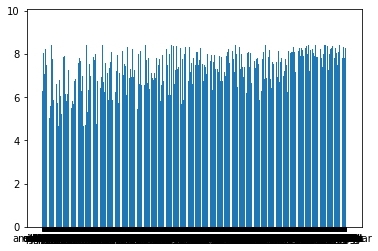

In [21]:
import math
IDF = {}
doc_length = len(df_train['clean_title'])
for w in freq_dict: 
    IDF[w] = math.log(doc_length/(freq_dict[w]+1))
plt.bar(*zip(*IDF.items()))
plt.show()

In [22]:
TF = []
def calculate(x):
    sent_TF={}
    sent_len=len(x)
  #  print(type(x))
    for (key,value) in x.items():
        sent_TF[key]= value/sent_len
    TF.append(sent_TF)
temp_df['dic_words'].apply(lambda x: calculate(x))
TF

[{'differ': 0.5, 'order': 0.5},
 {'concern': 0.25, 'sink': 0.25, 'tini': 0.25, 'hat': 0.25},
 {'leak': 0.5, 'ambassador': 0.5},
 {'puppi': 0.3333333333333333,
  'take': 0.3333333333333333,
  'view': 0.3333333333333333},
 {'face': 0.3333333333333333,
  'sheet': 0.3333333333333333,
  'music': 0.3333333333333333},
 {'bride': 0.16666666666666666,
  'exchang': 0.16666666666666666,
  'fatal': 0.16666666666666666,
  'shoot': 0.16666666666666666,
  'we': 0.16666666666666666,
  'd': 0.16666666666666666},
 {'meat': 0.25, 'pig': 0.25, 'eat': 0.25, 'milk': 0.25},
 {'convert': 0.2, 'local': 0.2, 'teen': 0.2, 'circa': 0.2, 'ad': 0.2},
 {'victori': 0.3333333333333333,
  'great': 0.3333333333333333,
  'crusad': 0.3333333333333333},
 {'villag': 0.25, 'leader': 0.25, 'clean': 0.25, 'patch': 0.25},
 {'ai': 0.3333333333333333,
  'fli': 0.3333333333333333,
  'moon': 0.3333333333333333},
 {'seven': 0.5, 'sloth': 0.5},
 {'babi': 0.16666666666666666,
  'cow': 0.16666666666666666,
  'see': 0.16666666666666666,

In [23]:
# TFIDF 
TF_IDF_list=[]
for t in TF: 
    TF_IDF  = {}
    for (key,value) in t.items():
        TF_IDF[key]= value*IDF[key]
    TF_IDF_list.append(TF_IDF)
TF_IDF_list

[{'differ': 2.808921147032861, 'order': 3.0580384762316},
 {'concern': 1.842089701189932,
  'sink': 1.6141982556535566,
  'tini': 1.394993005002578,
  'hat': 1.578626104183278},
 {'leak': 4.185371530666642, 'ambassador': 4.108951928551918},
 {'puppi': 2.1545273049826372,
  'take': 1.5492722687180107,
  'view': 2.0612548250903675},
 {'face': 1.5193952154910417,
  'sheet': 2.6860482125389895,
  'music': 2.07527722209512},
 {'bride': 1.3016362525859662,
  'exchang': 1.340801851124584,
  'fatal': 1.2451839938419285,
  'shoot': 0.8858930059681344,
  'we': 1.0119724071780911,
  'd': 0.8758990951735415},
 {'meat': 1.7733458458942655,
  'pig': 1.7560550059100726,
  'eat': 1.2501510191727754,
  'milk': 1.6822028288556845},
 {'convert': 1.6404557078401514,
  'local': 1.0556067881844997,
  'teen': 1.1944028215572673,
  'circa': 0.9234936889962052,
  'ad': 1.1017608675924018},
 {'victori': 2.2335961553298107,
  'great': 1.7815798904590328,
  'crusad': 2.749968862730003},
 {'villag': 1.799614941991

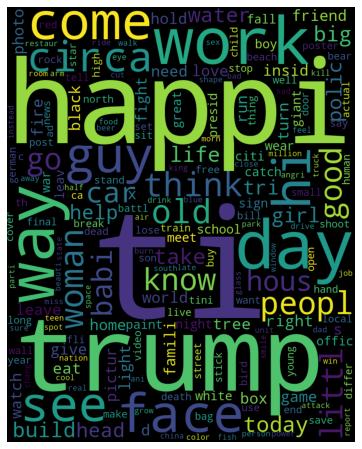

In [24]:
from wordcloud import WordCloud
corpus= temp_df['clean_title'].apply(lambda x: ' '.join(x))
all_text= ' '.join(corpus)
wc= WordCloud(width=800, height=1000).generate(all_text)
fig =plt.figure(figsize=(10,8))
plt.imshow(wc)
plt.axis('off')
plt.show()

In [25]:

words= list(freq_dict.keys())
freq_true= []
freq_false=[]
for word in words:
    if(word in freq_dict_false):
        freq_false.append(freq_dict_false[word])
    else:
        freq_false.append(0)
    if(word in freq_dict_true):
        freq_true.append(freq_dict_true[word])
    else: 
        freq_true.append(0)

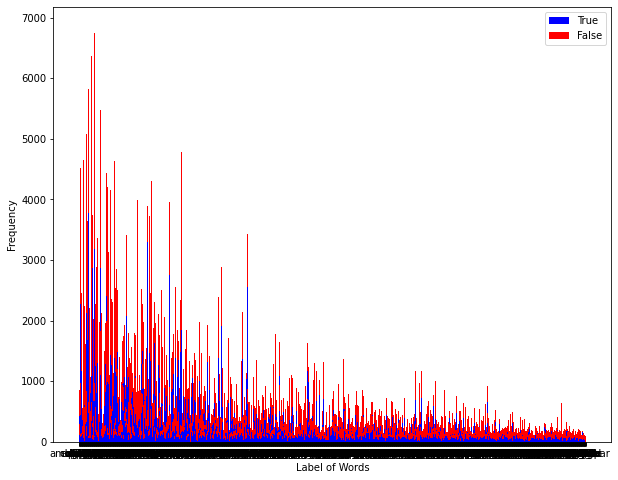

In [26]:
width=3
fig =plt.figure(figsize=(10,8))
plt.bar(words,freq_true,width=width, color='b')
plt.bar(words,freq_false, bottom=freq_true,width=width, color='r')
plt.ylabel('Frequency')
plt.xlabel('Label of Words')
plt.legend(labels=("True","False"))
plt.show()

In [27]:
df_train=temp_df
df_train

,clean_title,2_way_label,word_count,dic_words
0,"[differ, order]",1,2,"{'differ': 1, 'order': 1}"
1,"[concern, sink, tini, hat]",0,4,"{'concern': 1, 'sink': 1, 'tini': 1, 'hat': 1}"
2,"[leak, ambassador]",1,2,"{'leak': 1, 'ambassador': 1}"
3,"[puppi, take, view]",1,3,"{'puppi': 1, 'take': 1, 'view': 1}"
4,"[face, sheet, music]",0,3,"{'face': 1, 'sheet': 1, 'music': 1}"
...,...,...,...,...
563991,"[true, superhero]",0,2,"{'true': 1, 'superhero': 1}"
563995,"[sky, today]",1,2,"{'sky': 1, 'today': 1}"
563996,"[guy, move, show, towel]",0,4,"{'guy': 1, 'move': 1, 'show': 1, 'towel': 1}"
563997,"[wet, concret]",1,2,"{'wet': 1, 'concret': 1}"


In [28]:
df_train.to_csv('Ready_Dataset.csv', index=False)